# Measuring all 5 protocols and 2 player sizes (720p, 4k) (quality auto) on the test VM -- 1 video

In [1]:
import pandas as pd
import sqlite3
import datetime
import numpy as np
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import PercentFormatter
import math
import Cdf
import Pmf
from urllib.parse import urlparse, parse_qs
mpl.rcParams['figure.dpi'] = 200
okabe_ito = ["#000000", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
sns.set_context('paper')
sns.set_palette(sns.color_palette(okabe_ito))
#https://stackoverflow.com/a/45846841
def human_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][magnitude])
def make_cdf(series):
    return series.value_counts(normalize=True).sort_index().cumsum()
def make_pdf(series):
    return series.value_counts(normalize=True).sort_index()
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
conn = sqlite3.connect('web-performance-youtube-2022-03-15.db')

#### remove measurements where googlevideo subdomain changed

In [3]:
googlevideo_subdomains = pd.read_sql_query("SELECT msm_id, name FROM page_resources", conn)
googlevideo_subdomains['googlevideo'] = googlevideo_subdomains.name.str.split('/').str[2]

In [4]:
googlevideo_subdomains.groupby('msm_id', as_index=False).agg({'googlevideo':pd.Series.nunique}).sort_values('googlevideo').googlevideo.value_counts()

1    238
2      2
Name: googlevideo, dtype: int64

In [5]:
msm_ids_to_remove = googlevideo_subdomains.groupby('msm_id', as_index=False).filter(lambda x: pd.Series.nunique(x['googlevideo']) > 1).msm_id.unique().tolist()

#### remove measurement runs where resolution failed in the lookups table -- sadly the timestamps of dnsproxy are not reliable, so we cannot know from just looking at the lookups at which point of playback it failed -- in this run no googlevideo.com resolution failed, however removing them anyway in case it skews results -- also all errors happened over DoUDP

In [6]:
failed_lookups = pd.read_sql_query('SELECT measurement_id as msm_id FROM lookups WHERE status <> "NOERROR"', conn).msm_id.tolist()

In [7]:
msm_ids_to_remove.extend(failed_lookups)

In [8]:
#conn = sqlite3.connect('web-performance-youtube-two-videos.db')
measurements = pd.read_sql_query("SELECT * FROM measurements", conn)
measurements
#conn.close()

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,page_load_time,error
0,c6b82bf3-1694-abfa-35ea-1f5e7ae30e10,-1,-1.000000e+00,-1.000000e+00,tls,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:30:05.078187,auto,1280,720,0,30,aqz-KE-bpKQ,1,989.9,
1,1fe11405-cf65-80a2-2d97-e238e7a05094,1647365441715782000,1.647365e+12,1.647365e+12,tls,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:30:08.428716,auto,1280,720,0,30,aqz-KE-bpKQ,0,793.9,
2,af9b9b6f-8d45-e539-bf6f-ad41a200ecb5,-1,-1.000000e+00,-1.000000e+00,tls,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:30:46.620839,auto,1920,1080,0,30,aqz-KE-bpKQ,1,761.5,
3,cc39d5cf-8456-5c3d-d85f-1a309b578acb,1647365483172170230,1.647365e+12,1.647365e+12,tls,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:30:49.715073,auto,1920,1080,0,30,aqz-KE-bpKQ,0,830.4,
4,96f370d6-091a-7598-218e-520dfeb001ed,-1,-1.000000e+00,-1.000000e+00,tls,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:31:29.157704,auto,2560,1440,0,30,aqz-KE-bpKQ,1,798.6,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,5e0fccab-fb46-da10-19ed-289caccac68a,1647385947158915997,1.647386e+12,1.647386e+12,udp,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:11:53.780584,auto,1920,1080,0,30,aqz-KE-bpKQ,0,820.8,
476,d4f80d9d-8831-c095-eca8-6a61202bf00c,-1,-1.000000e+00,-1.000000e+00,udp,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:12:32.089697,auto,2560,1440,0,30,aqz-KE-bpKQ,1,729.1,
477,ac18b841-2e1c-3156-230f-9da6d4dcd490,1647385988574866844,1.647386e+12,1.647386e+12,udp,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:12:35.148481,auto,2560,1440,0,30,aqz-KE-bpKQ,0,819.8,
478,b40fd371-c561-cdf5-f833-540c49f3672f,-1,-1.000000e+00,-1.000000e+00,udp,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:13:14.580207,auto,3840,2160,0,30,aqz-KE-bpKQ,1,754.2,


# data pre-processing

In [9]:
measurements.groupby(['cacheWarming', 'error']).agg({'msm_id':pd.Series.nunique})

msm_id
cacheWarming error                                                     
0                                                                   240
1                                                                   239
             failed loading player for cache warming ### Mes...       1

In [10]:
measurements = measurements[measurements.error == '']

remove cache warming runs early to reduce processing later on

In [11]:
measurements = measurements[measurements.cacheWarming == 0]

#### runs where the googlevideo subdomain changed -> no clear trend

In [12]:
measurements[measurements.msm_id.isin(msm_ids_to_remove)].groupby(['domain', 'player_width', 'player_height']).size()

domain       player_width  player_height
aqz-KE-bpKQ  1280          720              1
             1920          1080             2
             2560          1440             1
             3840          2160             1
dtype: int64

In [13]:
measurements.msm_id.nunique()

240

In [14]:
measurements = measurements[~measurements.msm_id.isin(msm_ids_to_remove)]

In [15]:
measurements.msm_id.nunique()

235

In [16]:
measurements['player_width'] = measurements['player_width'].astype(str)
measurements['player_height'] = measurements['player_height'].astype(str)
measurements['player_dimensions'] = measurements['player_width']+"x"+measurements['player_height']

In [17]:
measurements['protocol'] = measurements['protocol'].str.upper()

In [18]:
dns_proto_mapping = {'QUIC':'DoQ', 'HTTPS':'DoH', 'TLS':'DoT', 'TCP':'DoTCP', 'UDP':'DoUDP'}
def map_proto_to_dns(x):
    return dns_proto_mapping[x]
measurements['protocol'] = measurements['protocol'].map(map_proto_to_dns)

In [19]:
measurements

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,page_load_time,error,player_dimensions
1,1fe11405-cf65-80a2-2d97-e238e7a05094,1647365441715782000,1.647365e+12,1.647365e+12,DoT,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:30:08.428716,auto,1280,720,0,30,aqz-KE-bpKQ,0,793.9,,1280x720
3,cc39d5cf-8456-5c3d-d85f-1a309b578acb,1647365483172170230,1.647365e+12,1.647365e+12,DoT,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:30:49.715073,auto,1920,1080,0,30,aqz-KE-bpKQ,0,830.4,,1920x1080
5,50519f61-9376-7322-87ef-ecb20b6535da,1647365525947264073,1.647366e+12,1.647365e+12,DoT,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:31:32.523041,auto,2560,1440,0,30,aqz-KE-bpKQ,0,836.9,,2560x1440
7,d9daf436-9a2c-10e2-d19e-c3f2fc072943,1647365568893829828,1.647366e+12,1.647366e+12,DoT,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:32:15.521704,auto,3840,2160,0,30,aqz-KE-bpKQ,0,774.8,,3840x2160
9,110cce88-b994-2b89-7cb7-fbc21ab89fc1,1647365609928287820,1.647366e+12,1.647366e+12,DoH,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 17:32:56.542719,auto,1280,720,0,30,aqz-KE-bpKQ,0,898.0,,1280x720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,1b88fd83-2446-8bd0-e7d7-d21076ef13c5,1647385864299547094,1.647386e+12,1.647386e+12,DoTCP,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:10:30.905425,auto,3840,2160,0,30,aqz-KE-bpKQ,0,741.1,,3840x2160
473,a7c3d833-bfc4-59a1-d874-1cbb2db9c901,1647385905682116056,1.647386e+12,1.647386e+12,DoUDP,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:11:12.376474,auto,1280,720,0,30,aqz-KE-bpKQ,0,797.2,,1280x720
475,5e0fccab-fb46-da10-19ed-289caccac68a,1647385947158915997,1.647386e+12,1.647386e+12,DoUDP,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:11:53.780584,auto,1920,1080,0,30,aqz-KE-bpKQ,0,820.8,,1920x1080
477,ac18b841-2e1c-3156-230f-9da6d4dcd490,1647385988574866844,1.647386e+12,1.647386e+12,DoUDP,94.140.14.140,aqz-KE-bpKQ,Europe Central,2022-03-15 23:12:35.148481,auto,2560,1440,0,30,aqz-KE-bpKQ,0,819.8,,2560x1440


## find the optimal resolution as determined by the youtube player for each run

In [20]:
df_optimal_resolutions = pd.read_sql_query("""
SELECT msm_id, resolution, time FROM nerd_stats
""", conn)

In [21]:
df_optimal_resolutions['current_res'] = df_optimal_resolutions['resolution'].str.split(' / ').str[0]
df_optimal_resolutions['current_res'] = df_optimal_resolutions['current_res'].str.split('@').str[0]
df_optimal_resolutions['optimal_res'] = df_optimal_resolutions['resolution'].str.split(' / ').str[1]
df_optimal_resolutions['optimal_res'] = df_optimal_resolutions['optimal_res'].str.split('@').str[0]
df_optimal_resolutions['time'] = pd.to_datetime(df_optimal_resolutions['time'], unit='ms', origin='unix')

In [22]:
df_optimal_resolutions = df_optimal_resolutions[['msm_id','optimal_res', 'time', 'current_res']]

In [23]:
df_optimal_resolutions.groupby('msm_id').optimal_res.nunique().sort_values()

msm_id
057794bc-a6aa-467a-3757-89602151645e    1
8c8d37a0-8b97-f2cb-e087-173ff71b1a63    1
8ed14bc3-3ed7-0dca-1c27-fb04f3f87d96    1
945cd2f0-a33a-3691-7941-83ee217c8974    1
9635ddc8-ca58-6331-6e56-edf361cf47f4    1
                                       ..
d251101a-fe3d-400f-86ae-09d06b600539    2
1b88fd83-2446-8bd0-e7d7-d21076ef13c5    2
d2c88693-817b-5596-6bb7-468c4a90dfb3    2
2bcdfab7-76d5-defe-a121-8a03ead09157    2
6ec88d3f-b822-0fd9-c84a-d7c47e6c801f    2
Name: optimal_res, Length: 240, dtype: int64

### filter out measurements where the player changes the optimal resolution within the run (mostly from 4k to 1440p)

In [24]:
s_filter_msm = df_optimal_resolutions.groupby('msm_id').optimal_res.nunique()

In [25]:
s_filter_msm[s_filter_msm > 1].index.tolist()

['06dd33c6-cc0a-3f74-238a-67673269f4db',
 '0a37bdac-9310-5bdf-898d-ef1a8a572a55',
 '102668cd-1c59-013e-b1a2-836d9c001fa9',
 '12156223-ed94-bc14-f5f7-fa398235ef4d',
 '15c02a05-9a1a-668e-4e04-9185efdbb132',
 '15ff900c-1b24-3c8a-c738-70c56ef52571',
 '1aeebb49-538e-593b-7436-f5e897d17cc7',
 '1b571d79-92f7-dd8d-cd24-f2a2031c271f',
 '1b88fd83-2446-8bd0-e7d7-d21076ef13c5',
 '2226dfaa-d0d0-bf3d-e6ed-b879776cc56b',
 '25e68858-de03-edcc-90a8-4e2ff946c54c',
 '2bcdfab7-76d5-defe-a121-8a03ead09157',
 '331d414d-8b8f-87cf-d79f-377b6786ab29',
 '408df699-dd6a-3f9b-7e6d-d1c5617a5432',
 '40eeb77a-ff4e-70a1-3837-5c0ca804fde5',
 '4537f808-b20a-76ca-e9b8-dda783bdbc12',
 '5d42d229-664c-904b-8e5a-45a197744a4a',
 '5e4ee49c-3609-e24e-4b58-34e99c1460e3',
 '5eca7fa6-a2d2-7e9a-f734-79a4d7603845',
 '5f09b26e-80e7-e7b7-a7e3-fb63fcc02a73',
 '6c830791-135e-3d9f-15a5-f0854b04e4bc',
 '6d66c074-d42a-e226-4fe3-36beebd64ef1',
 '6e0984ec-b8cb-67d0-377f-2568ba40cd41',
 '6ec88d3f-b822-0fd9-c84a-d7c47e6c801f',
 '7d2e81db-722e-

In [26]:
df_optimal_resolutions[df_optimal_resolutions.msm_id.isin(s_filter_msm[s_filter_msm > 1].index.tolist())].sort_values('time').groupby(['msm_id', 'optimal_res']).agg({'time':'min'}).sort_values('time')

time
msm_id                               optimal_res                              
d9daf436-9a2c-10e2-d19e-c3f2fc072943 3840x2160   2022-03-15 17:32:18.581799936
                                     2560x1440   2022-03-15 17:32:44.769299968
1b571d79-92f7-dd8d-cd24-f2a2031c271f 3840x2160   2022-03-15 17:35:04.646600192
                                     2560x1440   2022-03-15 17:35:30.910300160
9f3187d3-d82d-9194-bff2-7300aa32d39d 3840x2160   2022-03-15 17:37:52.343299840
...                                                                        ...
a7e0481b-7626-9bff-830e-bf7b72778395 2560x1440   2022-03-15 23:08:14.072699904
1b88fd83-2446-8bd0-e7d7-d21076ef13c5 3840x2160   2022-03-15 23:10:33.953499904
                                     2560x1440   2022-03-15 23:11:00.157499904
969061ea-9669-6744-97f7-6a41415ef52d 3840x2160   2022-03-15 23:13:20.655300096
                                     2560x1440   2022-03-15 23:13:46.839200000

[90 rows x 1 columns]

first idea: we take the nerd stats optimal res at the end of playback (i.e. the furthest in terms of video playback) as the "true" optimal res  ------ probably dumb idea, see example above, for now just filter out the ones with multiple optimal resolutions?

In [27]:
#assert set(df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].msm_id.value_counts().values) == {1}
#assert df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].msm_id.nunique() == measurements.msm_id.nunique()
#df_optimal_resolutions = df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].reset_index(drop=True)


In [28]:
df_msms_with_multiple_opt_res = df_optimal_resolutions.groupby('msm_id', as_index=False).agg(opt_res_num=('optimal_res',pd.Series.nunique), opt_res_list=('optimal_res',pd.Series.unique)).sort_values('opt_res_num')

In [29]:
df_msms_with_multiple_opt_res[df_msms_with_multiple_opt_res.opt_res_num > 1]

,msm_id,opt_res_num,opt_res_list
117,6e0984ec-b8cb-67d0-377f-2568ba40cd41,2,"[3840x2160, 2560x1440]"
8,102668cd-1c59-013e-b1a2-836d9c001fa9,2,"[3840x2160, 2560x1440]"
214,d9daf436-9a2c-10e2-d19e-c3f2fc072943,2,"[3840x2160, 2560x1440]"
20,15ff900c-1b24-3c8a-c738-70c56ef52571,2,"[3840x2160, 2560x1440]"
19,15c02a05-9a1a-668e-4e04-9185efdbb132,2,"[3840x2160, 2560x1440]"
1,06dd33c6-cc0a-3f74-238a-67673269f4db,2,"[3840x2160, 2560x1440]"
2,0a37bdac-9310-5bdf-898d-ef1a8a572a55,2,"[3840x2160, 2560x1440]"
222,e3261884-5b4d-535a-9689-e4b1ed2cf768,2,"[3840x2160, 2560x1440]"
11,12156223-ed94-bc14-f5f7-fa398235ef4d,2,"[3840x2160, 2560x1440]"
96,5d42d229-664c-904b-8e5a-45a197744a4a,2,"[3840x2160, 2560x1440]"


In [30]:
measurements_to_remove = df_msms_with_multiple_opt_res[df_msms_with_multiple_opt_res.opt_res_num > 1].msm_id.unique().tolist()

In [31]:
measurements_to_remove

['6e0984ec-b8cb-67d0-377f-2568ba40cd41',
 '102668cd-1c59-013e-b1a2-836d9c001fa9',
 'd9daf436-9a2c-10e2-d19e-c3f2fc072943',
 '15ff900c-1b24-3c8a-c738-70c56ef52571',
 '15c02a05-9a1a-668e-4e04-9185efdbb132',
 '06dd33c6-cc0a-3f74-238a-67673269f4db',
 '0a37bdac-9310-5bdf-898d-ef1a8a572a55',
 'e3261884-5b4d-535a-9689-e4b1ed2cf768',
 '12156223-ed94-bc14-f5f7-fa398235ef4d',
 '5d42d229-664c-904b-8e5a-45a197744a4a',
 'e63dfdb1-0be0-77b3-1df2-e6940300a147',
 '5f09b26e-80e7-e7b7-a7e3-fb63fcc02a73',
 '5eca7fa6-a2d2-7e9a-f734-79a4d7603845',
 '5e4ee49c-3609-e24e-4b58-34e99c1460e3',
 '6c830791-135e-3d9f-15a5-f0854b04e4bc',
 'e07f9e8d-1ed0-7dc4-f5f8-769627ed4fc4',
 '6d66c074-d42a-e226-4fe3-36beebd64ef1',
 '4537f808-b20a-76ca-e9b8-dda783bdbc12',
 '1b571d79-92f7-dd8d-cd24-f2a2031c271f',
 '9f3187d3-d82d-9194-bff2-7300aa32d39d',
 '9eb56edd-33d7-bd66-f129-77877f8d3af0',
 '40eeb77a-ff4e-70a1-3837-5c0ca804fde5',
 '408df699-dd6a-3f9b-7e6d-d1c5617a5432',
 'a7e0481b-7626-9bff-830e-bf7b72778395',
 '99b4a334-aee1-

In [32]:
measurements[measurements.msm_id.isin(measurements_to_remove)].player_dimensions.value_counts()

3840x2160    44
Name: player_dimensions, dtype: int64

In [33]:
measurements[measurements.msm_id.isin(measurements_to_remove)].protocol.value_counts()

DoTCP    11
DoQ      10
DoT       8
DoUDP     8
DoH       7
Name: protocol, dtype: int64

In [34]:
measurements[measurements.player_dimensions == "3840x2160"].protocol.value_counts()

DoT      12
DoH      12
DoQ      12
DoTCP    12
DoUDP    11
Name: protocol, dtype: int64

In [35]:
measurements = measurements[~measurements.msm_id.isin(measurements_to_remove)]

In [36]:
df_optimal_resolutions = df_optimal_resolutions[~df_optimal_resolutions.msm_id.isin(measurements_to_remove)][['msm_id', 'optimal_res']].drop_duplicates().reset_index().drop('index', axis=1)

In [37]:
df_optimal_resolutions

,msm_id,optimal_res
0,1fe11405-cf65-80a2-2d97-e238e7a05094,1280x720
1,cc39d5cf-8456-5c3d-d85f-1a309b578acb,1920x1080
2,50519f61-9376-7322-87ef-ecb20b6535da,2560x1440
3,110cce88-b994-2b89-7cb7-fbc21ab89fc1,1280x720
4,2b8385fc-f838-4884-ff71-75e36b58877c,1920x1080
...,...,...
190,f6d46338-96a5-86aa-24a9-623edd06e397,1920x1080
191,0bb42da4-ced4-ae90-3f5c-147f26c500de,2560x1440
192,a7c3d833-bfc4-59a1-d874-1cbb2db9c901,1280x720
193,5e0fccab-fb46-da10-19ed-289caccac68a,1920x1080


In [38]:
df_optimal_resolutions = pd.merge(df_optimal_resolutions, measurements[['msm_id', 'player_dimensions']], on='msm_id')
df_optimal_resolutions

,msm_id,optimal_res,player_dimensions
0,1fe11405-cf65-80a2-2d97-e238e7a05094,1280x720,1280x720
1,cc39d5cf-8456-5c3d-d85f-1a309b578acb,1920x1080,1920x1080
2,50519f61-9376-7322-87ef-ecb20b6535da,2560x1440,2560x1440
3,110cce88-b994-2b89-7cb7-fbc21ab89fc1,1280x720,1280x720
4,2b8385fc-f838-4884-ff71-75e36b58877c,1920x1080,1920x1080
...,...,...,...
186,f6d46338-96a5-86aa-24a9-623edd06e397,1920x1080,1920x1080
187,0bb42da4-ced4-ae90-3f5c-147f26c500de,2560x1440,2560x1440
188,a7c3d833-bfc4-59a1-d874-1cbb2db9c901,1280x720,1280x720
189,5e0fccab-fb46-da10-19ed-289caccac68a,1920x1080,1920x1080


### make sure the optimal resolutions match what we set as the player size

In [39]:
df_optimal_resolutions[df_optimal_resolutions.optimal_res != df_optimal_resolutions.player_dimensions]

,msm_id,optimal_res,player_dimensions


### make sure each run has a start playing event that fired before 1s of playtime passed (there seems to always be a little bit of playtime (i.e. the curr play time when the event fires is never zero) presumably due to the delay from javascript execution between getting the playback time within the callback)

In [40]:
df_player_state_playing = pd.read_sql_query("select time, msm_id, curr_play_time from iframe_api where event_type = 'PlayerStatePLAYING'", conn)

In [41]:
df_player_state_playing[df_player_state_playing.curr_play_time > 1].curr_play_time.describe()

count    254.000000
mean      16.972923
std        2.773785
min        8.414500
25%       15.029266
50%       18.019071
75%       19.349333
max       28.395667
Name: curr_play_time, dtype: float64

In [42]:
df_player_state_playing[df_player_state_playing.curr_play_time < 1].curr_play_time.describe()

count    240.000000
mean       0.023147
std        0.014589
min        0.005473
25%        0.016371
50%        0.020729
75%        0.024126
max        0.115370
Name: curr_play_time, dtype: float64

In [43]:
df_player_state_intial_playback = df_player_state_playing[(df_player_state_playing.curr_play_time < 1) & 
                                    (df_player_state_playing.msm_id.isin(measurements.msm_id.unique()))]

make sure each measurement only has one corresponding initial playing state event and that all measurements have such an event

In [44]:
assert set(df_player_state_intial_playback.msm_id.value_counts().values) == {1}
assert pd.Series.nunique(df_player_state_intial_playback.msm_id.value_counts().index) == \
pd.Series.nunique(measurements['msm_id'])

### if the 1s metric produced a unique start playing state event for each run, we can use it to calculate the startup delay between when we tell the player to start playing and when it actually plays

In [45]:
df_start_time = pd.read_sql_query("""
SELECT start_time, play_time, msm_id, current_quality AS initial_quality FROM
(SELECT time AS start_time, msm_id FROM iframe_api WHERE event_type = 'PlayStartedFromFunction')
JOIN
(SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time < 1)
USING (msm_id);
""", conn)
df_start_time = df_start_time[df_start_time.msm_id.isin(measurements.msm_id.unique())]

df_start_time['start_time'] = pd.to_datetime(df_start_time['start_time'], unit='ms', origin='unix')
df_start_time['play_time'] = pd.to_datetime(df_start_time['play_time'], unit='ms', origin='unix')

df_start_time['startup_delay'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds()

In [46]:
df_start_time

,start_time,play_time,msm_id,initial_quality,startup_delay
0,2022-03-15 17:30:10.792699904,2022-03-15 17:30:11.210500096,1fe11405-cf65-80a2-2d97-e238e7a05094,hd720,0.4178
1,2022-03-15 17:30:52.115200000,2022-03-15 17:30:52.463699968,cc39d5cf-8456-5c3d-d85f-1a309b578acb,hd1080,0.3485
2,2022-03-15 17:31:34.929699840,2022-03-15 17:31:35.300099840,50519f61-9376-7322-87ef-ecb20b6535da,hd1440,0.3704
4,2022-03-15 17:32:59.011800064,2022-03-15 17:32:59.373400064,110cce88-b994-2b89-7cb7-fbc21ab89fc1,hd720,0.3616
5,2022-03-15 17:33:40.213799936,2022-03-15 17:33:40.653299968,2b8385fc-f838-4884-ff71-75e36b58877c,hd1080,0.4395
...,...,...,...,...,...
233,2022-03-15 23:09:10.487800064,2022-03-15 23:09:10.859899904,f6d46338-96a5-86aa-24a9-623edd06e397,hd1080,0.3721
234,2022-03-15 23:09:51.873999872,2022-03-15 23:09:52.243699968,0bb42da4-ced4-ae90-3f5c-147f26c500de,hd1440,0.3697
236,2022-03-15 23:11:14.750899968,2022-03-15 23:11:15.155000064,a7c3d833-bfc4-59a1-d874-1cbb2db9c901,hd720,0.4041
237,2022-03-15 23:11:56.220599808,2022-03-15 23:11:56.549899776,5e0fccab-fb46-da10-19ed-289caccac68a,hd1080,0.3293


### for each measurement we call getQuality when the player fires the start playing callback, however this seems to again be susceptible to some delay, some measurements have quality change events for that resolution fire __after__ the recorded timestamp for the playing event ---> thus we figure out the quality change event that happened closest to the timestamp of the start playing event but still happened before it

In [47]:
df_player_quality_change_event = pd.read_sql_query("select msm_id, time, curr_play_time, current_quality from iframe_api where event_type LIKE 'QualityChange%'", conn)
df_player_quality_change_event = df_player_quality_change_event[df_player_quality_change_event.msm_id.isin(measurements.msm_id.unique())]

In [48]:
df_player_quality_change_event['time'] = pd.to_datetime(df_player_quality_change_event['time'], unit='ms', origin='unix')

In [49]:
df_player_quality_change_event.curr_play_time.value_counts().sort_index()

0.000000     376
0.059366       1
0.073356       1
0.225917       1
0.252513       1
0.265689       1
0.274883       1
0.482040       1
0.657849       1
1.082747       1
1.193722       1
1.202185       1
1.208291       1
1.217280       1
1.236724       1
1.329613       1
1.329720       1
1.784540       1
3.054926       1
5.209864       1
22.354517      1
22.393709      1
22.715736      1
22.980359      1
Name: curr_play_time, dtype: int64

In [50]:
df_player_quality_change_event[df_player_quality_change_event.curr_play_time == 0].msm_id.value_counts()

1fe11405-cf65-80a2-2d97-e238e7a05094    2
a085c698-e7b4-2b62-e78a-ba898e93d2c6    2
121ad4cd-1226-dfb2-0fbc-2460e37f805f    2
87353e06-0cb0-318e-2cd8-d6fe00eb0531    2
a998619b-61a9-b695-3e1f-8c797ee888e7    2
                                       ..
d37f1316-9bf0-af45-763a-3b06fe4b90a4    1
20f67d2f-38e7-62b4-ce4c-05c1b327d35b    1
69181152-a9b5-f1b0-b682-ce4331d60228    1
6b77bc5d-02e1-9c3e-9cc1-34ccd6379ed1    1
bd03fe5e-ffc2-abe2-3509-6b6d7a057d11    1
Name: msm_id, Length: 191, dtype: int64

In [51]:
df_player_quality_change_event[df_player_quality_change_event.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,msm_id,time,curr_play_time,current_quality


In [52]:
measurements[measurements.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,page_load_time,error,player_dimensions


In [53]:
df_start_time[df_start_time.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,start_time,play_time,msm_id,initial_quality,startup_delay


In [54]:
df_true_initial_quality = pd.merge(df_start_time[['msm_id', 'play_time', 'initial_quality']], df_player_quality_change_event[df_player_quality_change_event.curr_play_time < 1][['time', 'current_quality', 'msm_id']], on='msm_id')


In [55]:
df_true_initial_quality['delay_to_play_time'] = (df_true_initial_quality['play_time'] - df_true_initial_quality['time']).dt.total_seconds()

In [56]:
df_true_initial_quality[df_true_initial_quality.msm_id == "e37a4c5f-daee-4fc3-41de-3a2787a97d81"]

,msm_id,play_time,initial_quality,time,current_quality,delay_to_play_time


In [57]:
df_true_initial_quality = df_true_initial_quality[df_true_initial_quality.delay_to_play_time > 0]

In [58]:
df_true_initial_quality = df_true_initial_quality.loc[df_true_initial_quality.groupby('msm_id').delay_to_play_time.idxmin()].reset_index(drop=True)

In [59]:
df_true_initial_quality[df_true_initial_quality.initial_quality != df_true_initial_quality.current_quality]

,msm_id,play_time,initial_quality,time,current_quality,delay_to_play_time


In [60]:
df_true_initial_quality.rename(columns=lambda x: x.replace('current_quality', 'true_initial_quality'), inplace=True)

In [61]:
df_true_initial_quality

,msm_id,play_time,initial_quality,time,true_initial_quality,delay_to_play_time
0,057794bc-a6aa-467a-3757-89602151645e,2022-03-15 22:38:41.686200064,hd720,2022-03-15 22:38:41.600699904,hd720,0.0855
1,0bb42da4-ced4-ae90-3f5c-147f26c500de,2022-03-15 23:09:52.243699968,hd1440,2022-03-15 23:09:52.167200000,hd1440,0.0765
2,0bf4331a-9463-8291-97f5-6a49b2372c8a,2022-03-15 20:33:39.101699840,hd1080,2022-03-15 20:33:39.087699968,hd1080,0.0140
3,0d89bdd5-866c-1040-965f-a233c448e841,2022-03-15 20:05:46.166600192,hd720,2022-03-15 20:05:46.103399936,hd720,0.0632
4,0de254db-15d7-6b9e-fabf-1edfad935745,2022-03-15 18:12:42.536400128,hd1440,2022-03-15 18:12:42.525100032,hd1440,0.0113
...,...,...,...,...,...,...
186,f6d46338-96a5-86aa-24a9-623edd06e397,2022-03-15 23:09:10.859899904,hd1080,2022-03-15 23:09:10.787599872,hd1080,0.0723
187,f7150a5b-de77-9665-c22d-bb61582c8ec4,2022-03-15 18:30:11.012300032,hd720,2022-03-15 18:30:10.944300032,hd720,0.0680
188,fed48102-f5f5-0e94-d447-29088272fab7,2022-03-15 18:34:19.316999936,hd1440,2022-03-15 18:34:19.307000064,hd1440,0.0100
189,ff8d1beb-a308-bdba-fe0c-a775d12c0ae4,2022-03-15 22:05:44.646600192,hd720,2022-03-15 22:05:44.543700224,hd720,0.1029


### helper functions

In [62]:
res_to_quality = {
    "unknown":"auto","256x144":"tiny", "426x240": "small", "640x360": "medium", "854x480": "large",
    "1280x720": "hd720", "1920x1080": "hd1080", "2560x1440": "hd1440", "3840x2160": "hd2160"
}

quality_to_res = {v: k for k, v in res_to_quality.items()}

def map_quality_to_res(quality):
    return quality_to_res[quality]
def map_res_to_quality(resolution):
    return res_to_quality[resolution]

def make_quality_column_sortable(df_, col_name_):
    df_[col_name_] = pd.Categorical(df_[col_name_], ['auto', 'tiny', 'small', 'medium', 'large', 'hd720', 'hd1080', 'highres', 'hd1440', 'hd2160'])

def make_res_column_sortable(df_, col_name_):
    df_[col_name_] = pd.Categorical(df_[col_name_], ['256x144', '426x240', '640x360', '854x480', '1280x720', '1920x1080', '2560x1440', '3840x2160'])

In [63]:
quality_to_res

{'auto': 'unknown',
 'tiny': '256x144',
 'small': '426x240',
 'medium': '640x360',
 'large': '854x480',
 'hd720': '1280x720',
 'hd1080': '1920x1080',
 'hd1440': '2560x1440',
 'hd2160': '3840x2160'}

In [64]:
df_resource_timing = pd.read_sql_query("SELECT msm_id, name, nextHopProtocol, domainLookupStart, domainLookupEnd FROM page_resources", conn)
#df_resource_timing = df_resource_timing[df_resource_timing.msm_id.isin(measurements.msm_id.unique())]

In [65]:
df_resource_timing['googlevideo'] = df_resource_timing.name.str.split('/').str[2]

In [66]:
df_resource_timing.googlevideo.unique()

array(['rr2---sn-4g5lzner.googlevideo.com',
       'rr2---sn-4g5ednly.googlevideo.com',
       'rr2---sn-5hnekn7z.googlevideo.com'], dtype=object)

In [67]:
def find_initial_requests(url_):
    parse_res = urlparse(url_)
    opts = parse_qs(parse_res.query)
    if opts['range'][0][0] == '0':
        return True
    return False
df_resource_timing['first_request'] = df_resource_timing['name'].map(find_initial_requests)

In [68]:
df_resource_timing['h1_first_request'] = False
df_resource_timing['h1_first_request'] = np.where((df_resource_timing.nextHopProtocol == 'http/1.1') & (df_resource_timing.first_request == True), True, df_resource_timing['h1_first_request'])

In [69]:
df_resource_timing = pd.merge(df_resource_timing, pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn))

In [70]:
df_resource_timing[df_resource_timing.cacheWarming == 0].groupby('msm_id', as_index=False).agg({'googlevideo':pd.Series.nunique}).sort_values('googlevideo')

,msm_id,googlevideo
0,057794bc-a6aa-467a-3757-89602151645e,1
152,9782396a-c9f7-56e6-f2b2-70e1b7f962de,1
153,98c623ed-7b81-bf2f-132b-0047fd1e0fdb,1
154,99b4a334-aee1-6b15-0ce6-0b3ea2029f55,1
155,9eb56edd-33d7-bd66-f129-77877f8d3af0,1
...,...,...
86,54c39e63-0812-5453-2014-d16add5d1194,1
74,4c6021a0-d347-3bf3-1909-926f75baab1a,1
239,ffeaad2e-3126-a6fe-3fe6-a21ddab62da1,1
199,cc568c39-4370-d1c1-1081-ce319750672d,2


In [71]:
df_caught_first_request = df_resource_timing.groupby('msm_id', as_index=False).agg({'first_request': lambda x: sum(x) > 0, 'h1_first_request': lambda x: sum(x) > 0})

In [72]:
print(df_caught_first_request[df_caught_first_request.first_request == True].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.first_request == False].msm_id.nunique())
print(df_caught_first_request.msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.h1_first_request == True].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.h1_first_request == False].msm_id.nunique())
print(df_caught_first_request.msm_id.nunique())

69
171
240
11
229
240


In [73]:
df_caught_first_request = pd.merge(df_caught_first_request, pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn))

In [74]:
print(df_caught_first_request[(df_caught_first_request.first_request == True) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.first_request == False) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 0].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == True) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == False) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 0].msm_id.nunique())

69
171
240
11
229
240


In [75]:
print(df_caught_first_request[(df_caught_first_request.first_request == True) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.first_request == False) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 1].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == True) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == False) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 1].msm_id.nunique())

0
0
0
0
0
0


In [76]:
df_resource_timing.msm_id.nunique()

240

In [77]:
df_resource_timing.domainLookupStart.describe()

count     4058.000000
mean     15817.945071
std       9641.214301
min          0.000000
25%       6845.725000
50%      14548.800000
75%      25570.750000
max      33863.000000
Name: domainLookupStart, dtype: float64

In [78]:
df_resource_timing.domainLookupEnd.describe()

count     4058.000000
mean     15817.956013
std       9641.200556
min          0.000000
25%       6845.725000
50%      14548.800000
75%      25570.750000
max      33863.000000
Name: domainLookupEnd, dtype: float64

In [79]:
df_resource_timing[df_resource_timing.domainLookupStart == 0]

,msm_id,name,nextHopProtocol,domainLookupStart,domainLookupEnd,googlevideo,first_request,h1_first_request,cacheWarming,player_dimensions,timestamp
126,1b571d79-92f7-dd8d-cd24-f2a2031c271f,https://rr2---sn-4g5lzner.googlevideo.com/vide...,,0.0,0.0,rr2---sn-4g5lzner.googlevideo.com,False,False,0,3840x2160,2022-03-15 17:35:01.204490


In [80]:
all_measurements = pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn)

In [81]:
df_start_time = pd.merge(df_start_time, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']])

In [82]:
#df_start_time = df_start_time[df_start_time.cacheWarming == 0]

In [83]:
df_start_time.protocol.value_counts()

DoH      40
DoT      39
DoQ      38
DoUDP    38
DoTCP    36
Name: protocol, dtype: int64

In [84]:
df_start_time.columns

Index(['start_time', 'play_time', 'msm_id', 'initial_quality', 'startup_delay',
       'player_dimensions', 'protocol', 'vantagePoint', 'domain'],
      dtype='object')

In [85]:
df_start_time = pd.merge(df_start_time, df_true_initial_quality[['msm_id', 'true_initial_quality']], on='msm_id')

In [86]:
df_start_time[df_start_time.initial_quality != df_start_time.true_initial_quality]

,start_time,play_time,msm_id,initial_quality,startup_delay,player_dimensions,protocol,vantagePoint,domain,true_initial_quality


In [87]:
make_quality_column_sortable(df_start_time, 'true_initial_quality')
make_quality_column_sortable(df_start_time, 'initial_quality')
make_res_column_sortable(df_start_time, 'player_dimensions')

In [88]:
df_start_time['player_dimensions_as_quality'] = df_start_time['player_dimensions'].map(map_res_to_quality)

In [89]:
pd.set_option('display.max_rows', 100)

In [90]:
df_start_time['suggested_with_initial_quality'] = df_start_time['player_dimensions_as_quality'].astype(str) +'<-'+ df_start_time['true_initial_quality'].astype(str)

In [91]:
df_start_time[df_start_time.domain == 'aqz-KE-bpKQ'].groupby(['suggested_with_initial_quality', 'protocol']).agg({'msm_id':pd.Series.nunique}).dropna()

msm_id
suggested_with_initial_quality protocol        
hd1080<-hd1080                 DoH           11
                               DoQ           12
                               DoT           12
                               DoTCP         10
                               DoUDP         11
hd1080<-large                  DoTCP          1
                               DoUDP          1
hd1440<-hd1440                 DoH           11
                               DoQ           12
                               DoT           12
                               DoTCP         12
                               DoUDP         11
hd1440<-hd720                  DoH            1
hd2160<-hd1440                 DoH            5
                               DoQ            2
                               DoT            4
                               DoUDP          3
hd2160<-hd720                  DoTCP          1
hd720<-hd720                   DoH           12
                               DoQ           12
                               DoT           11
                               DoTCP         12
                               DoUDP         12

In [92]:
df_start_time[df_start_time.domain == 'lqiN98z6Dak'].groupby(['suggested_with_initial_quality', 'protocol']).agg({'msm_id':pd.Series.nunique}).dropna()

,,msm_id
suggested_with_initial_quality,protocol,


In [93]:
df_player_quality_change_event['curr_qual_as_res'] = df_player_quality_change_event['current_quality'].map(map_quality_to_res)

In [94]:
df_player_started = pd.read_sql_query("""
SELECT time AS start_time, msm_id FROM iframe_api WHERE event_type = 'PlayStartedFromFunction'
""", conn)
df_player_started = df_player_started[df_player_started.msm_id.isin(measurements.msm_id.unique())]

df_player_started['start_time'] = pd.to_datetime(df_player_started['start_time'], unit='ms', origin='unix')


#df_start_time['startup_delay'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds()

In [95]:
df_player_quality_change_event = pd.merge(df_player_quality_change_event, df_optimal_resolutions[['msm_id', 'optimal_res']], on='msm_id')
df_player_quality_change_event

,msm_id,time,curr_play_time,current_quality,curr_qual_as_res,optimal_res
0,1fe11405-cf65-80a2-2d97-e238e7a05094,2022-03-15 17:30:11.034400000,0.0,large,854x480,1280x720
1,1fe11405-cf65-80a2-2d97-e238e7a05094,2022-03-15 17:30:11.127899904,0.0,hd720,1280x720,1280x720
2,cc39d5cf-8456-5c3d-d85f-1a309b578acb,2022-03-15 17:30:52.331600128,0.0,large,854x480,1920x1080
3,cc39d5cf-8456-5c3d-d85f-1a309b578acb,2022-03-15 17:30:52.452300032,0.0,hd1080,1920x1080,1920x1080
4,50519f61-9376-7322-87ef-ecb20b6535da,2022-03-15 17:31:35.124800000,0.0,large,854x480,2560x1440
...,...,...,...,...,...,...
394,a7c3d833-bfc4-59a1-d874-1cbb2db9c901,2022-03-15 23:11:15.023000064,0.0,hd720,1280x720,1280x720
395,5e0fccab-fb46-da10-19ed-289caccac68a,2022-03-15 23:11:56.399500032,0.0,large,854x480,1920x1080
396,5e0fccab-fb46-da10-19ed-289caccac68a,2022-03-15 23:11:56.473599744,0.0,hd1080,1920x1080,1920x1080
397,ac18b841-2e1c-3156-230f-9da6d4dcd490,2022-03-15 23:12:37.783200256,0.0,large,854x480,2560x1440


In [96]:
df_player_quality_change_event[df_player_quality_change_event.curr_qual_as_res == df_player_quality_change_event.optimal_res].msm_id.nunique()

191

In [97]:
df_player_quality_change_event = df_player_quality_change_event[df_player_quality_change_event.curr_qual_as_res == df_player_quality_change_event.optimal_res]

In [98]:
df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].curr_play_time.value_counts()

0.000000    173
1.208291      1
0.657849      1
1.784540      1
1.236724      1
1.082747      1
1.202185      1
1.217280      1
1.329613      1
0.265689      1
0.482040      1
0.059366      1
1.329720      1
1.193722      1
5.209864      1
0.225917      1
0.252513      1
0.274883      1
3.054926      1
Name: curr_play_time, dtype: int64

In [99]:
assert set(df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.value_counts().values) == {1}
assert df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.nunique() == measurements.msm_id.nunique()
df_player_quality_change_event_to_opt = df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].reset_index(drop=True)


In [100]:
df_player_quality_change_event_to_opt = pd.merge(df_player_quality_change_event_to_opt[['msm_id', 'time', 'optimal_res']], df_player_started,on='msm_id')

In [101]:

df_player_quality_change_event_to_opt['optimal_quality_delay'] = (df_player_quality_change_event_to_opt['time'] - df_player_quality_change_event_to_opt['start_time']).dt.total_seconds()
df_player_quality_change_event_to_opt

,msm_id,time,optimal_res,start_time,optimal_quality_delay
0,057794bc-a6aa-467a-3757-89602151645e,2022-03-15 22:38:41.600699904,1280x720,2022-03-15 22:38:41.304000000,0.2967
1,0bb42da4-ced4-ae90-3f5c-147f26c500de,2022-03-15 23:09:52.167200000,2560x1440,2022-03-15 23:09:51.873999872,0.2932
2,0bf4331a-9463-8291-97f5-6a49b2372c8a,2022-03-15 20:33:39.087699968,1920x1080,2022-03-15 20:33:38.671699968,0.4160
3,0d89bdd5-866c-1040-965f-a233c448e841,2022-03-15 20:05:46.103399936,1280x720,2022-03-15 20:05:45.826800128,0.2766
4,0de254db-15d7-6b9e-fabf-1edfad935745,2022-03-15 18:12:42.525100032,2560x1440,2022-03-15 18:12:42.191900160,0.3332
...,...,...,...,...,...
186,f6d46338-96a5-86aa-24a9-623edd06e397,2022-03-15 23:09:10.787599872,1920x1080,2022-03-15 23:09:10.487800064,0.2998
187,f7150a5b-de77-9665-c22d-bb61582c8ec4,2022-03-15 18:30:10.944300032,1280x720,2022-03-15 18:30:10.613699840,0.3306
188,fed48102-f5f5-0e94-d447-29088272fab7,2022-03-15 18:34:19.307000064,2560x1440,2022-03-15 18:34:18.970100224,0.3369
189,ff8d1beb-a308-bdba-fe0c-a775d12c0ae4,2022-03-15 22:05:44.543700224,1280x720,2022-03-15 22:05:44.284700160,0.2590


In [102]:
df_player_quality_change_event_to_opt = pd.merge(df_player_quality_change_event_to_opt, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')

In [103]:
df_buffering_events = pd.read_sql_query("""
SELECT time, curr_play_time, current_quality, msm_id FROM iframe_api WHERE event_type = 'PlayerStateBUFFERING'
""", conn)

df_buffering_events = df_buffering_events[df_buffering_events.msm_id.isin(measurements.msm_id.unique())]

#df_buffering_events_time = pd.merge(df_buffering_events, measurements[measurements.cacheWarming == 0][['msm_id', 'player_dimensions', 'domain']], on='msm_id')

In [104]:
df_buffering_events['time'] = pd.to_datetime(df_buffering_events['time'], unit='ms', origin='unix')

In [105]:
#df_buffering_events_time['time'] = pd.to_datetime(df_buffering_events_time['time'], unit='ms', origin='unix')

In [106]:
#df_buffering_events_time = df_buffering_events_time[~df_buffering_events_time.msm_id.isin(measurements_to_remove)]

In [107]:
df_buffering_events[df_buffering_events.curr_play_time > 1].current_quality.unique()

array(['hd1440', 'hd2160', 'hd1080'], dtype=object)

filter out buffering events that happened before the player started playing

In [108]:
df_playback_started = pd.read_sql_query("""
SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time < 1
""", conn)
df_playback_started = df_playback_started[df_playback_started.msm_id.isin(measurements.msm_id.unique())]

df_playback_started['play_time'] = pd.to_datetime(df_playback_started['play_time'], unit='ms', origin='unix')

In [109]:
#df_playback_started = df_playback_started[~df_playback_started.msm_id.isin(measurements_to_remove)]

In [110]:
df_playback_started

,play_time,msm_id,current_quality
0,2022-03-15 17:30:11.210500096,1fe11405-cf65-80a2-2d97-e238e7a05094,hd720
1,2022-03-15 17:30:52.463699968,cc39d5cf-8456-5c3d-d85f-1a309b578acb,hd1080
2,2022-03-15 17:31:35.300099840,50519f61-9376-7322-87ef-ecb20b6535da,hd1440
4,2022-03-15 17:32:59.373400064,110cce88-b994-2b89-7cb7-fbc21ab89fc1,hd720
5,2022-03-15 17:33:40.653299968,2b8385fc-f838-4884-ff71-75e36b58877c,hd1080
...,...,...,...
233,2022-03-15 23:09:10.859899904,f6d46338-96a5-86aa-24a9-623edd06e397,hd1080
234,2022-03-15 23:09:52.243699968,0bb42da4-ced4-ae90-3f5c-147f26c500de,hd1440
236,2022-03-15 23:11:15.155000064,a7c3d833-bfc4-59a1-d874-1cbb2db9c901,hd720
237,2022-03-15 23:11:56.549899776,5e0fccab-fb46-da10-19ed-289caccac68a,hd1080


In [111]:
df_buffering_events_time = pd.merge(df_buffering_events, df_playback_started[['msm_id', 'play_time']], on='msm_id')

In [112]:
df_buffering_events_time = df_buffering_events_time[df_buffering_events_time.time > df_buffering_events_time.play_time]

In [113]:
df_buffering_events_time = pd.merge(df_buffering_events_time, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')
df_buffering_events_time


,time,curr_play_time,current_quality,msm_id,play_time,player_dimensions,protocol,vantagePoint,domain
0,2022-03-15 17:31:54.612199936,19.267798,hd1440,50519f61-9376-7322-87ef-ecb20b6535da,2022-03-15 17:31:35.300099840,2560x1440,DoT,Europe Central,aqz-KE-bpKQ
1,2022-03-15 17:37:28.620400128,19.270092,hd1440,834de572-7cda-20f4-a8bb-5b30efe961b1,2022-03-15 17:37:09.361499904,2560x1440,DoQ,Europe Central,aqz-KE-bpKQ
2,2022-03-15 17:40:08.927800064,12.920599,hd1440,bacad408-6e5b-b57a-8a30-bc462f470f60,2022-03-15 17:39:55.938200064,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ
3,2022-03-15 17:40:15.413199872,19.274885,hd1440,bacad408-6e5b-b57a-8a30-bc462f470f60,2022-03-15 17:39:55.938200064,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ
4,2022-03-15 18:01:47.364300032,12.909443,hd1440,a27f848b-066f-77bc-c0ed-bebdf3b30c4d,2022-03-15 18:01:34.398600192,2560x1440,DoT,Europe Central,aqz-KE-bpKQ
...,...,...,...,...,...,...,...,...,...
115,2022-03-15 23:05:27.517199872,21.050111,hd2160,ae5e62df-5901-aa46-008b-37007380f6aa,2022-03-15 23:05:01.830200064,3840x2160,DoH,Europe Central,aqz-KE-bpKQ
116,2022-03-15 23:07:25.889700096,19.273033,hd1440,8ed14bc3-3ed7-0dca-1c27-fb04f3f87d96,2022-03-15 23:07:06.556700160,2560x1440,DoQ,Europe Central,aqz-KE-bpKQ
117,2022-03-15 23:10:05.191800064,12.925649,hd1440,0bb42da4-ced4-ae90-3f5c-147f26c500de,2022-03-15 23:09:52.243699968,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ
118,2022-03-15 23:10:11.837400064,19.276017,hd1440,0bb42da4-ced4-ae90-3f5c-147f26c500de,2022-03-15 23:09:52.243699968,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ


In [114]:
df_buffering_events_time.domain.value_counts()

aqz-KE-bpKQ    120
Name: domain, dtype: int64

In [115]:
df_buffering_events_time.msm_id.value_counts().describe()

count    74.000000
mean      1.621622
std       0.917153
min       1.000000
25%       1.000000
50%       1.000000
75%       2.000000
max       4.000000
Name: msm_id, dtype: float64

In [116]:
df_buffering_events_time.msm_id.nunique()

74

In [117]:
df_buffering_events_time[df_buffering_events_time.domain == "aqz-KE-bpKQ"].groupby('player_dimensions').msm_id.nunique()

player_dimensions
1920x1080     1
2560x1440    58
3840x2160    15
Name: msm_id, dtype: int64

In [118]:
measurements[(measurements.player_dimensions == "3840x2160") & (measurements.domain == "aqz-KE-bpKQ")].msm_id.nunique()

15

In [119]:
measurements[(measurements.player_dimensions == "2560x1440") & (measurements.domain == "aqz-KE-bpKQ")].msm_id.nunique()

59

In [120]:
#df_buffering_events_time.rename(columns=lambda x: x.replace('domain_x', 'domain'), inplace=True)
#df_buffering_events_time.rename(columns=lambda x: x.replace('player_dimensions_x', 'player_dimensions'), inplace=True)

In [121]:
df_playback_restarted = pd.read_sql_query("""
SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time >= 1
""", conn)
df_playback_restarted = df_playback_restarted[df_playback_restarted.msm_id.isin(measurements.msm_id.unique())]

df_playback_restarted['play_time'] = pd.to_datetime(df_playback_restarted['play_time'], unit='ms', origin='unix')
#df_playback_restarted = df_playback_restarted[~df_playback_restarted.msm_id.isin(measurements_to_remove)]

In [122]:
df_buffering_events.dtypes


time               datetime64[ns]
curr_play_time            float64
current_quality            object
msm_id                     object
dtype: object

In [123]:
df_stall_times = pd.merge_asof(df_playback_restarted, df_buffering_events, by='msm_id', left_on='play_time', right_on='time', direction='backward')

In [124]:
df_stall_times = pd.merge(df_stall_times, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')
df_stall_times

,play_time,msm_id,current_quality_x,time,curr_play_time,current_quality_y,player_dimensions,protocol,vantagePoint,domain
0,2022-03-15 17:31:55.047399936,50519f61-9376-7322-87ef-ecb20b6535da,hd1440,2022-03-15 17:31:54.612199936,19.267798,hd1440,2560x1440,DoT,Europe Central,aqz-KE-bpKQ
1,2022-03-15 17:37:29.057100032,834de572-7cda-20f4-a8bb-5b30efe961b1,hd1440,2022-03-15 17:37:28.620400128,19.270092,hd1440,2560x1440,DoQ,Europe Central,aqz-KE-bpKQ
2,2022-03-15 17:40:09.048999936,bacad408-6e5b-b57a-8a30-bc462f470f60,hd1440,2022-03-15 17:40:08.927800064,12.920599,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ
3,2022-03-15 17:40:15.862700032,bacad408-6e5b-b57a-8a30-bc462f470f60,hd1440,2022-03-15 17:40:15.413199872,19.274885,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ
4,2022-03-15 18:01:47.564699904,a27f848b-066f-77bc-c0ed-bebdf3b30c4d,hd1440,2022-03-15 18:01:47.364300032,12.909443,hd1440,2560x1440,DoT,Europe Central,aqz-KE-bpKQ
...,...,...,...,...,...,...,...,...,...,...
110,2022-03-15 23:05:30.553400064,ae5e62df-5901-aa46-008b-37007380f6aa,hd2160,2022-03-15 23:05:27.517199872,21.050111,hd2160,3840x2160,DoH,Europe Central,aqz-KE-bpKQ
111,2022-03-15 23:07:26.380900096,8ed14bc3-3ed7-0dca-1c27-fb04f3f87d96,hd1440,2022-03-15 23:07:25.889700096,19.273033,hd1440,2560x1440,DoQ,Europe Central,aqz-KE-bpKQ
112,2022-03-15 23:10:05.468900096,0bb42da4-ced4-ae90-3f5c-147f26c500de,hd1440,2022-03-15 23:10:05.191800064,12.925649,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ
113,2022-03-15 23:10:12.287699968,0bb42da4-ced4-ae90-3f5c-147f26c500de,hd1440,2022-03-15 23:10:11.837400064,19.276017,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ


In [125]:

df_stall_times['stall_time'] = (df_stall_times['play_time'] - df_stall_times['time']).dt.total_seconds()

In [126]:
df_stall_times

,play_time,msm_id,current_quality_x,time,curr_play_time,current_quality_y,player_dimensions,protocol,vantagePoint,domain,stall_time
0,2022-03-15 17:31:55.047399936,50519f61-9376-7322-87ef-ecb20b6535da,hd1440,2022-03-15 17:31:54.612199936,19.267798,hd1440,2560x1440,DoT,Europe Central,aqz-KE-bpKQ,0.4352
1,2022-03-15 17:37:29.057100032,834de572-7cda-20f4-a8bb-5b30efe961b1,hd1440,2022-03-15 17:37:28.620400128,19.270092,hd1440,2560x1440,DoQ,Europe Central,aqz-KE-bpKQ,0.4367
2,2022-03-15 17:40:09.048999936,bacad408-6e5b-b57a-8a30-bc462f470f60,hd1440,2022-03-15 17:40:08.927800064,12.920599,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ,0.1212
3,2022-03-15 17:40:15.862700032,bacad408-6e5b-b57a-8a30-bc462f470f60,hd1440,2022-03-15 17:40:15.413199872,19.274885,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ,0.4495
4,2022-03-15 18:01:47.564699904,a27f848b-066f-77bc-c0ed-bebdf3b30c4d,hd1440,2022-03-15 18:01:47.364300032,12.909443,hd1440,2560x1440,DoT,Europe Central,aqz-KE-bpKQ,0.2004
...,...,...,...,...,...,...,...,...,...,...,...
110,2022-03-15 23:05:30.553400064,ae5e62df-5901-aa46-008b-37007380f6aa,hd2160,2022-03-15 23:05:27.517199872,21.050111,hd2160,3840x2160,DoH,Europe Central,aqz-KE-bpKQ,3.0362
111,2022-03-15 23:07:26.380900096,8ed14bc3-3ed7-0dca-1c27-fb04f3f87d96,hd1440,2022-03-15 23:07:25.889700096,19.273033,hd1440,2560x1440,DoQ,Europe Central,aqz-KE-bpKQ,0.4912
112,2022-03-15 23:10:05.468900096,0bb42da4-ced4-ae90-3f5c-147f26c500de,hd1440,2022-03-15 23:10:05.191800064,12.925649,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ,0.2771
113,2022-03-15 23:10:12.287699968,0bb42da4-ced4-ae90-3f5c-147f26c500de,hd1440,2022-03-15 23:10:11.837400064,19.276017,hd1440,2560x1440,DoTCP,Europe Central,aqz-KE-bpKQ,0.4503


In [127]:
def draw_cdf(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim):
    if col_name_ == 'protocol':
        line_order =['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    else:
        line_order = sorted(df_[col_name_].unique().tolist())
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    for vp in df_['vantagePoint'].unique():
        print(vp)
        for video in df_['domain'].unique():
            for log in log_list:
                for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                    lnwidth = .5
                    mrksize = 3
                    df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                    fig, ax = plt.subplots(figsize=(5,2))
                    for col_val_ in df_tmp[col_name_].sort_values().unique():
                        cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        ax.plot(cdf.xs, cdf.ps, label=col_val_+'('+str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]))+')',
                                    linestyle='-', linewidth=lnwidth, 
                                    markersize=mrksize, fillstyle='none', 
                                    markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                    color=colors[col_val_], marker=markers[col_val_]
                                )
                        #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                    ax.spines['right'].set_color('none')
                    ax.spines['top'].set_color('none')
                    ax.yaxis.set_ticks_position('left')
                    ax.xaxis.set_ticks_position('bottom')
                    ax.spines['bottom'].set_position(('axes', -0.0))
                    ax.spines['left'].set_position(('axes', -0.0))

                    if not log:
                        #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                        ax.legend(loc='best', ncol=2, markerscale=2)
                    else:
                        ax.set_xscale('log')
                        #ax.set_xscale('symlog')
                        ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.5))

                    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.tick_params(axis='x', which='minor', labelsize=6)


                    ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                    ax.set_xlabel(xlabel)

                    ax.set_ylabel("CDF")
                    ax.set_ylim(-0.1,1.1)
                    if xlim != [0,0]:
                        ax.set_xlim(xlim)
                        
                    for line in ax.get_legend().get_lines():
                        line.set_linewidth(2.0)

                    if log:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                    #plt.show()

In [500]:
def draw_cdf_grid(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim):
    if col_name_ == 'protocol':
        line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    else:
        line_order = sorted(df_[col_name_].unique().tolist())
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    for vp in df_['vantagePoint'].unique():
        print(vp)
        for video in df_['domain'].unique():
            for log in log_list:
                num_rows = math.ceil(df_[col_outer_groupby_].nunique()/2)
                if col_outer_groupby_ == 'true_initial_quality':
                    num_rows = 2
                if df_[col_outer_groupby_].nunique() > 1:
                    fig, axs = plt.subplots(num_rows, 2, sharex='all', sharey='all', figsize=(12,3*num_rows))
                    fig.subplots_adjust(hspace=.5)
                    sample_size = dict()
                    legend_labels = df_[col_name_].unique()
                    for legend_label in legend_labels:
                        sample_size[legend_label] = []
                    col_outer_groupby_values = df_[col_outer_groupby_].sort_values().unique()
                    if col_outer_groupby_ == 'true_initial_quality':
                        col_outer_groupby_values = ['hd720', 'hd1080', 'hd1440', 'hd2160']
                    for col_grp_, ax in zip(col_outer_groupby_values, axs.flat):
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                        
                        for col_val_ in legend_labels:#df_tmp[col_name_].sort_values().unique():
                            sample_size[col_val_].append(str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])))
                            if len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]) == 0:
                                continue
                            cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            ax.plot(cdf.xs, cdf.ps, label=col_val_,
                                        linestyle='-', linewidth=lnwidth, 
                                        markersize=mrksize, fillstyle='none', 
                                        markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                        color=colors[col_val_], marker=markers[col_val_]
                                    )
                            #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                            ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                            ax.spines['right'].set_color('none')
                            ax.spines['top'].set_color('none')
                            ax.yaxis.set_ticks_position('left')
                            ax.xaxis.set_ticks_position('bottom')
                            ax.spines['bottom'].set_position(('axes', -0.0))
                            ax.spines['left'].set_position(('axes', -0.0))
                            if log:
                                ax.set_xscale('log')
                            #if not log:
                            #    #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                            #    ax.legend(loc='best', ncol=2, markerscale=2)
                            #else:
                            #    ax.set_xscale('log')
                            #    #ax.set_xscale('symlog')
                            #    ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.4))
                            #if i == df_[col_outer_groupby_].nunique()-1:
                            #    handles, labels = ax.get_legend_handles_labels()
                            #    fig.legend(handles, labels, loc='upper center')

                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel("CDF")
                            ax.set_ylim(-0.1,1.1)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)
                                
                        #for line in ax.get_legend().get_lines():
                            #    line.set_linewidth(2.0)
                    
                    legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]
                    #handles, labels = ax.get_legend_handles_labels()
                    plt.gca().legend(handles=legend_elements, loc='lower left', ncol=2, bbox_to_anchor=(-.3, (-.4-num_rows*.1)))

                    if log:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                    plt.show()
                

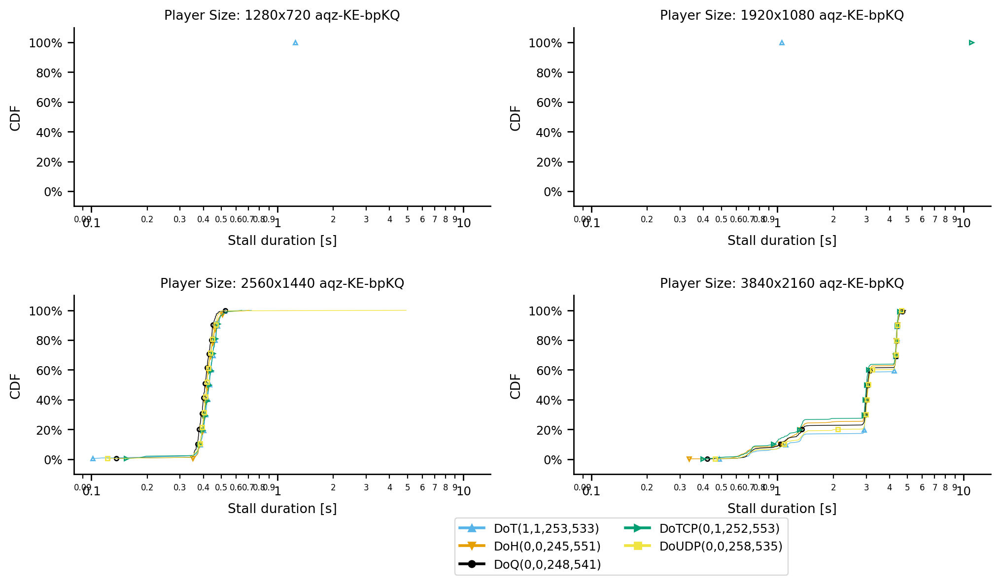

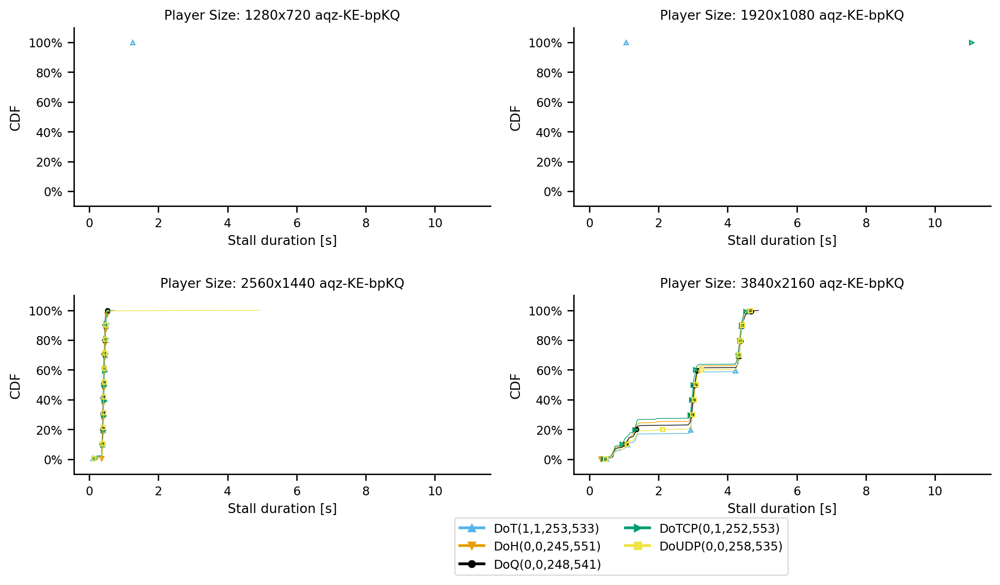

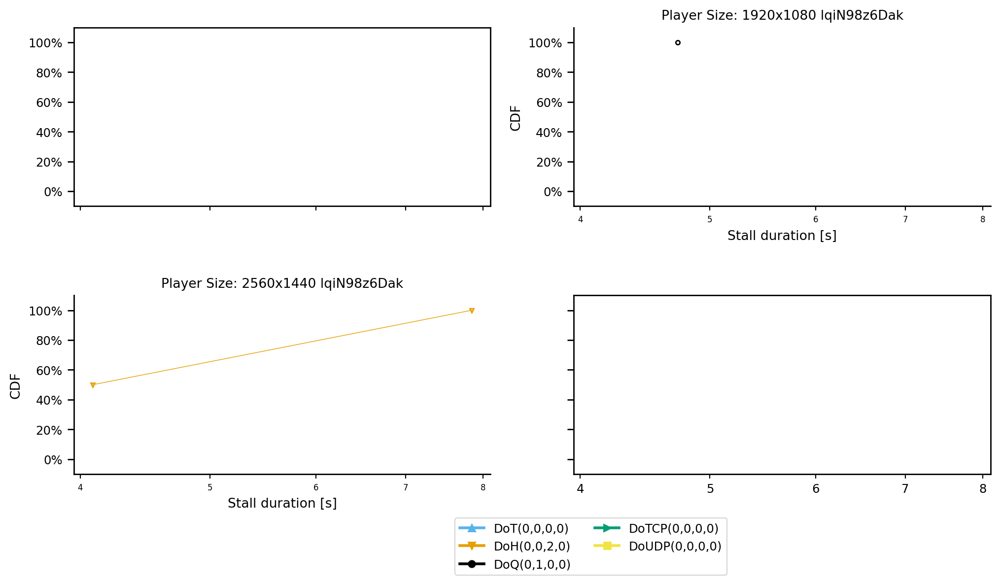

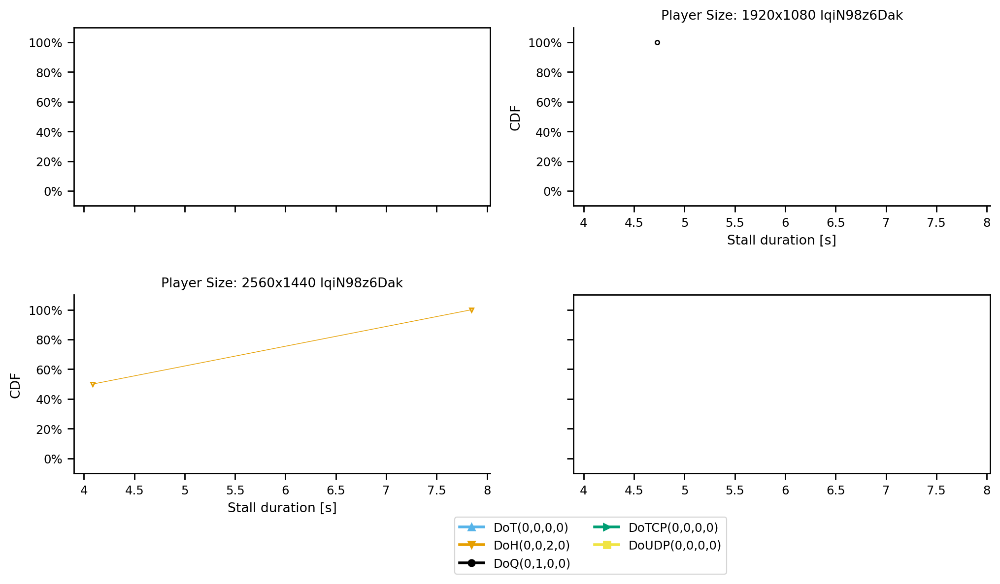

In [501]:
draw_cdf_grid(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0])

In [ ]:
draw_cdf(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0])

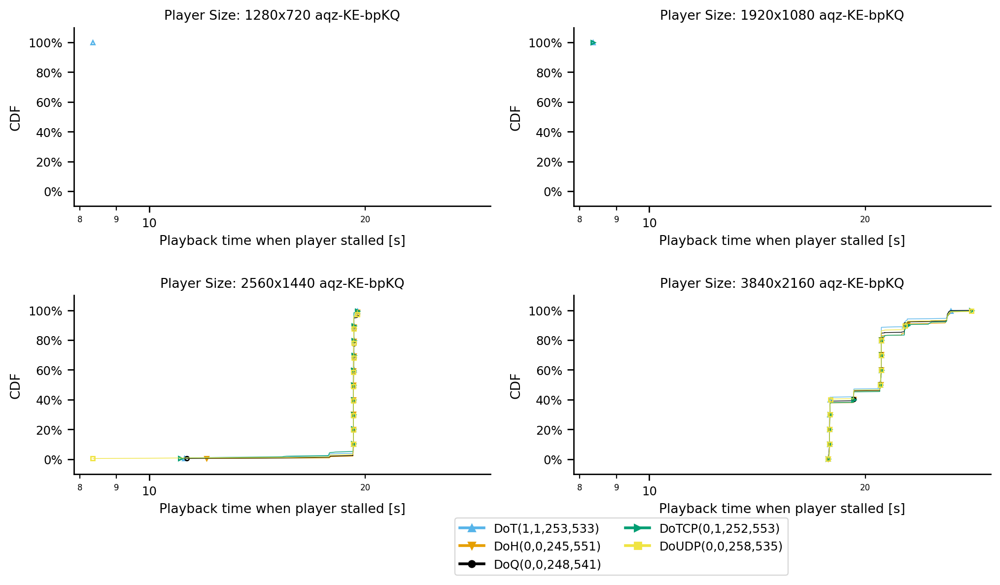

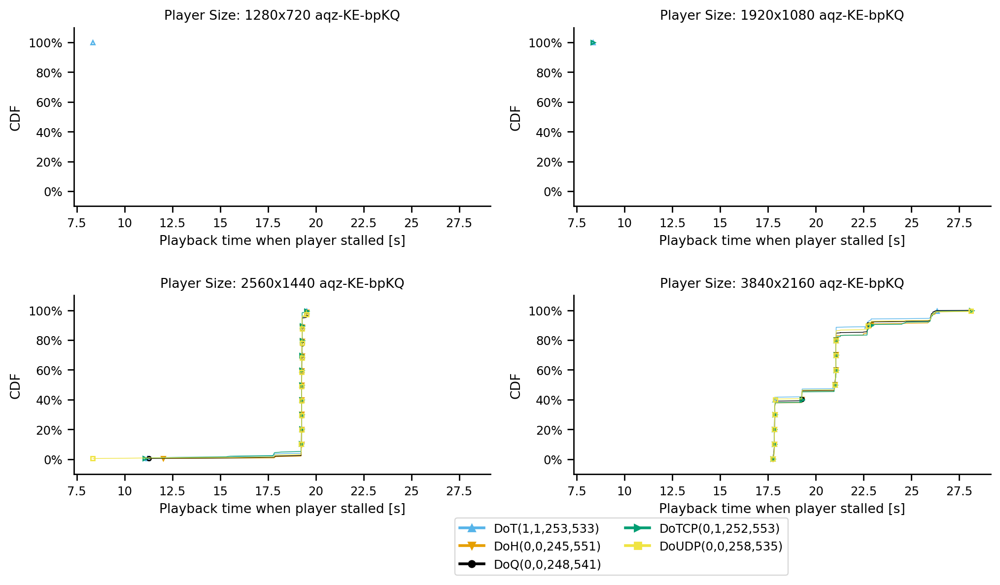

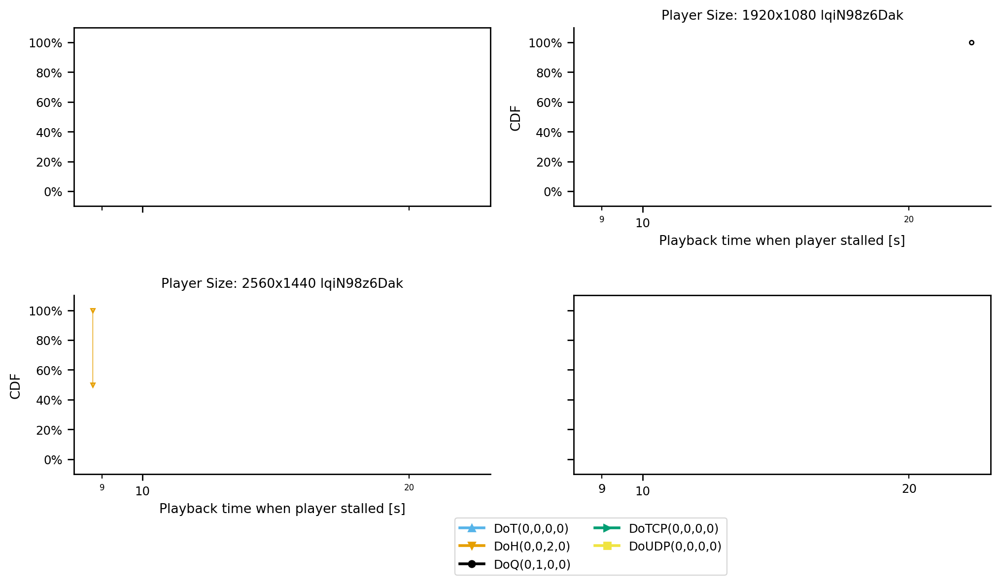

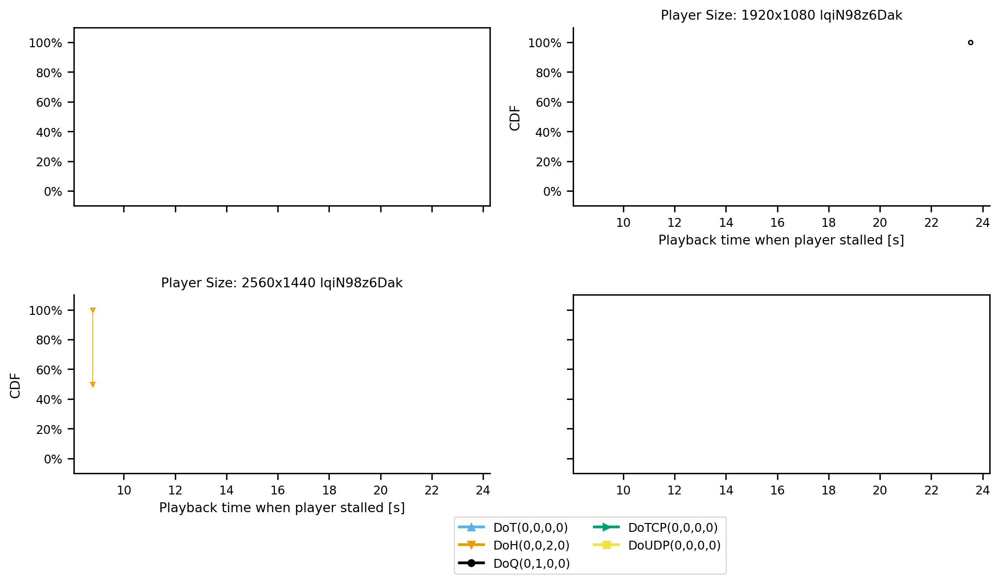

In [687]:
draw_cdf_grid(df_stall_times, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-with-restart-events-by-player-size-and-proto', [0,0])

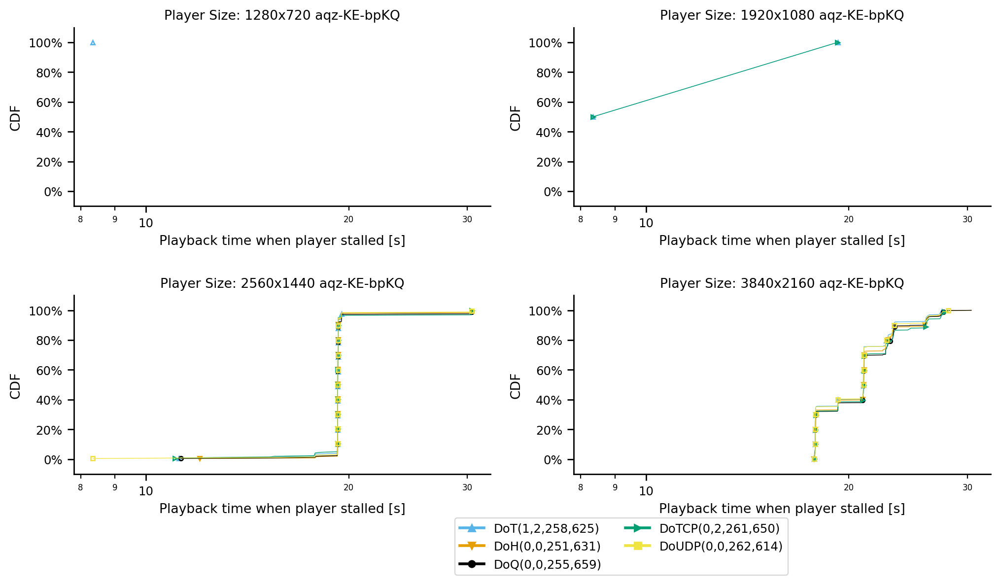

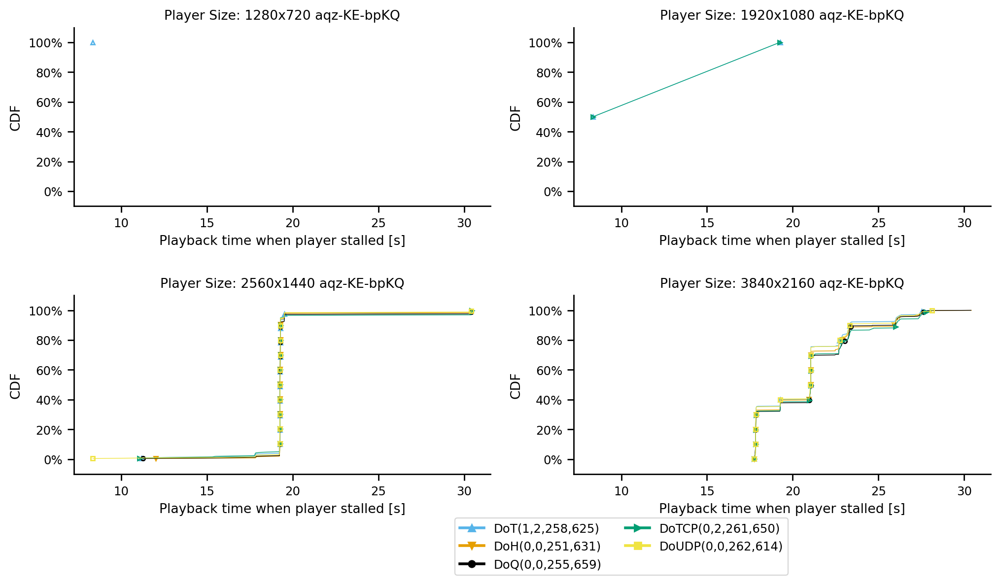

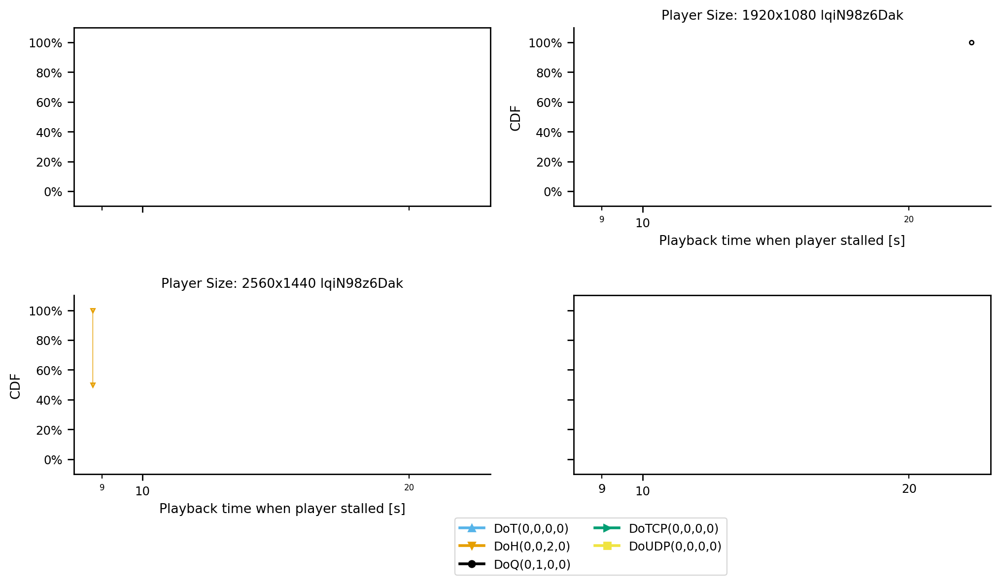

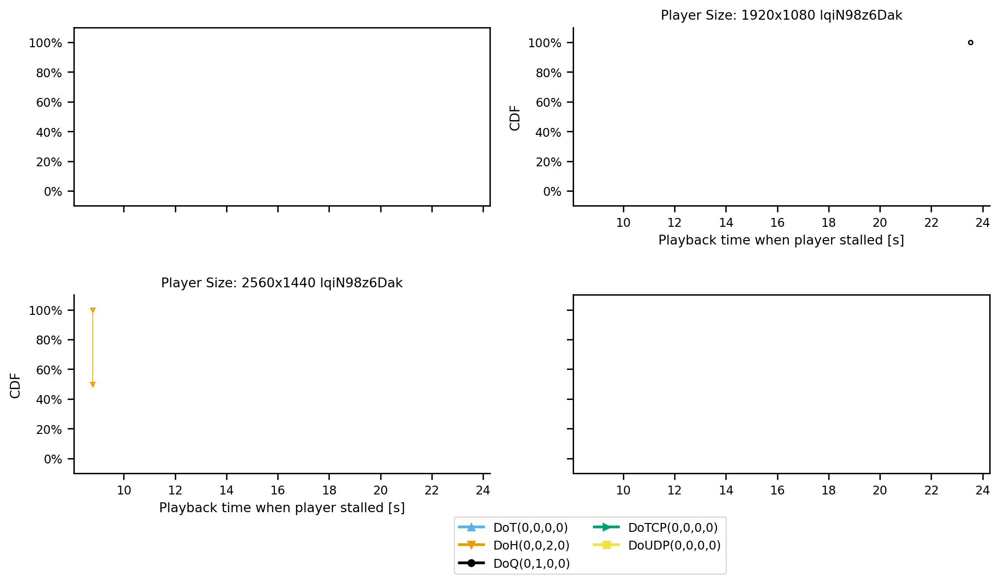

In [503]:
draw_cdf_grid(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0])

In [ ]:
draw_cdf(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0])

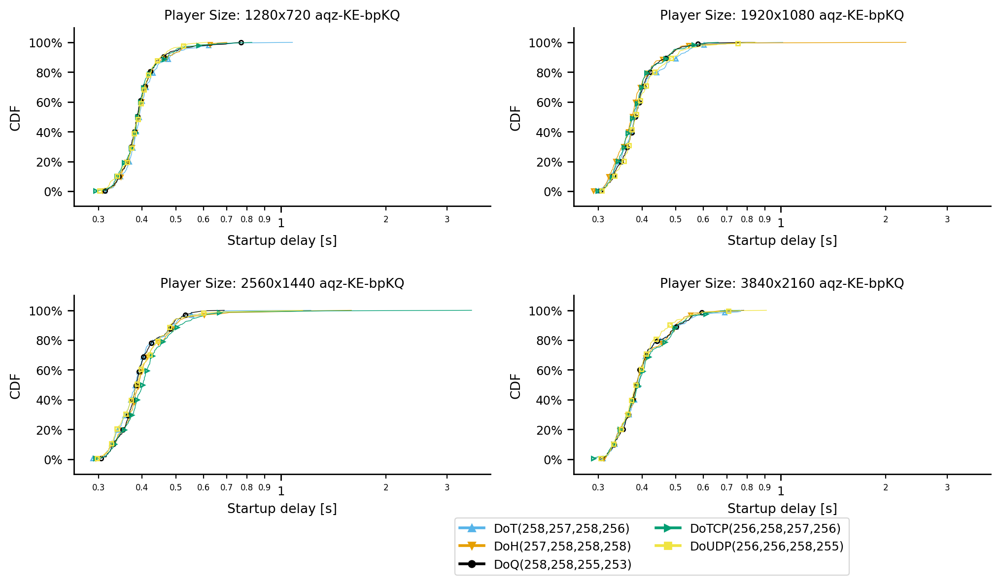

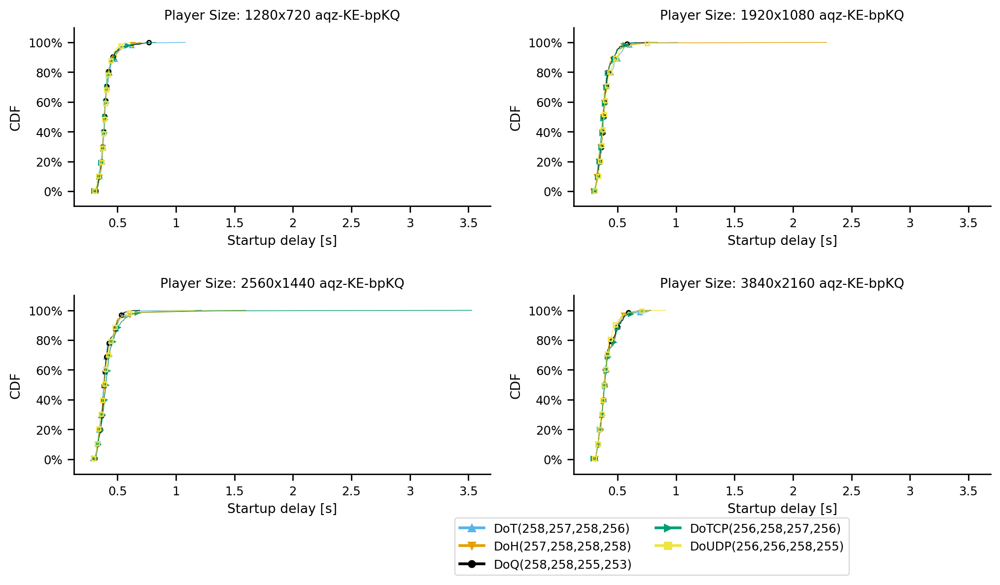

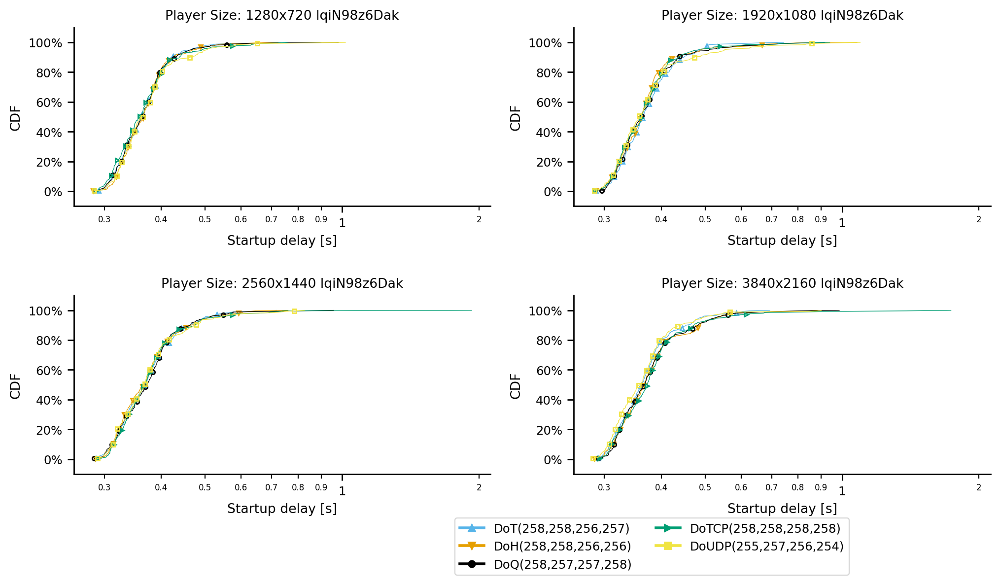

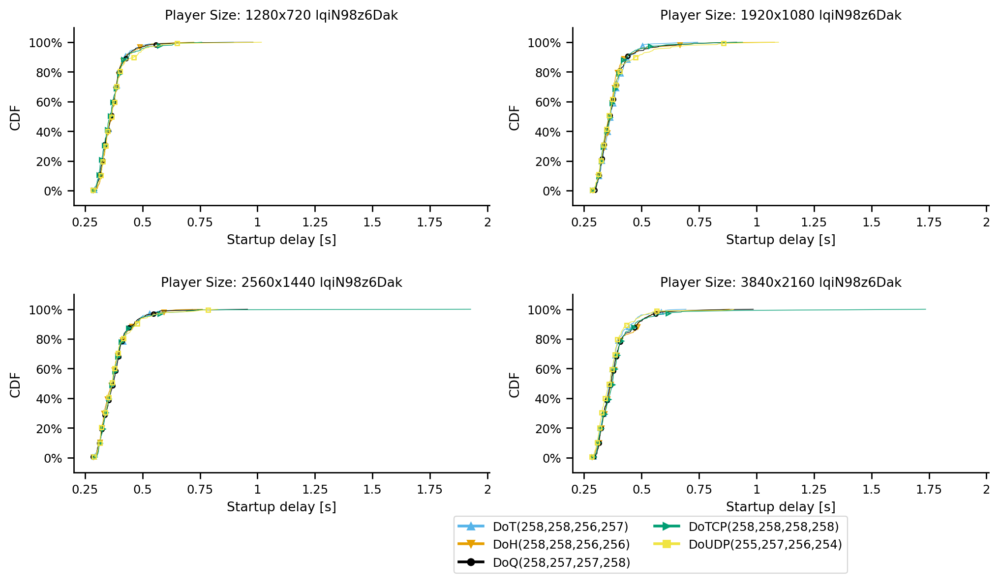

In [505]:
draw_cdf_grid(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0])

In [ ]:
draw_cdf(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0.1,1])

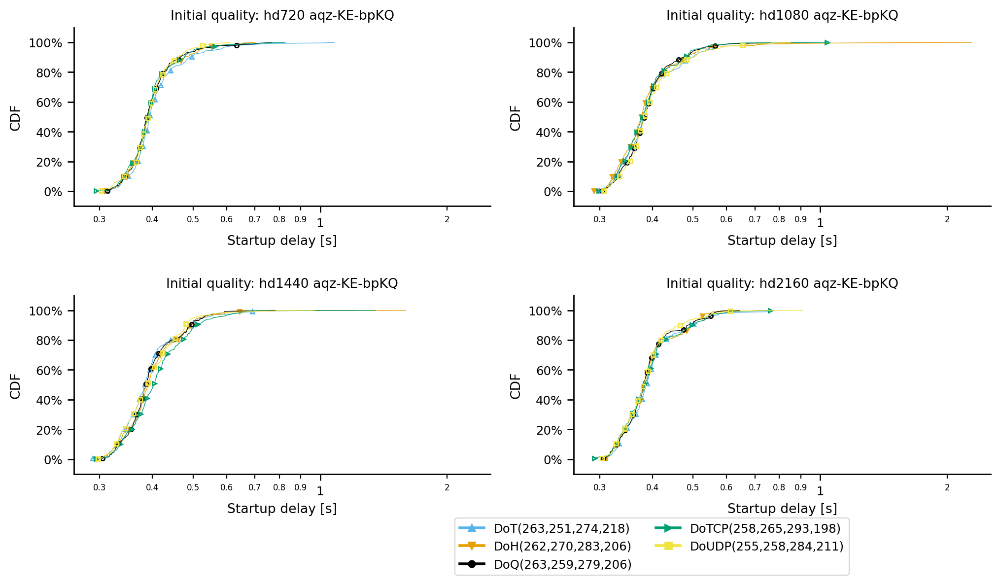

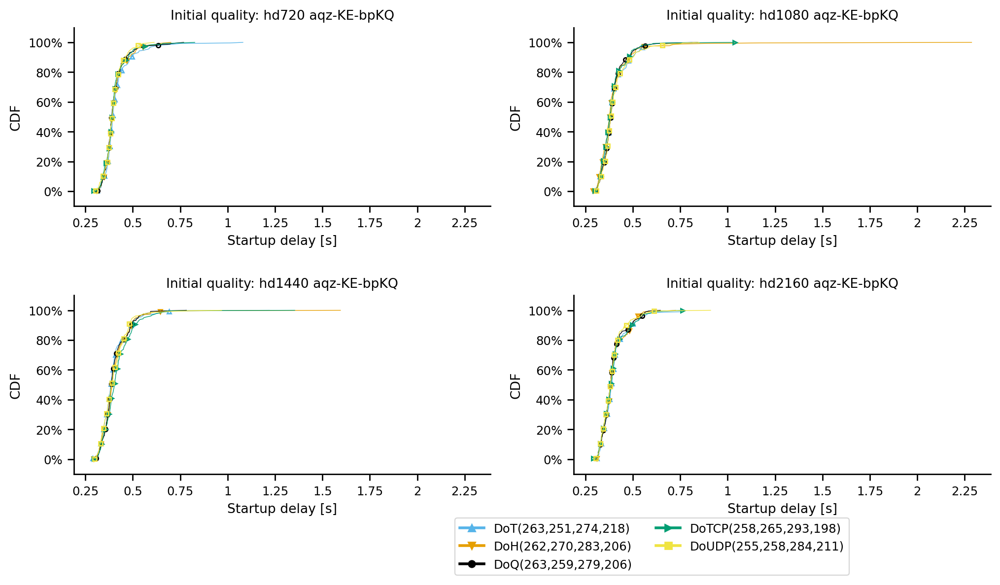

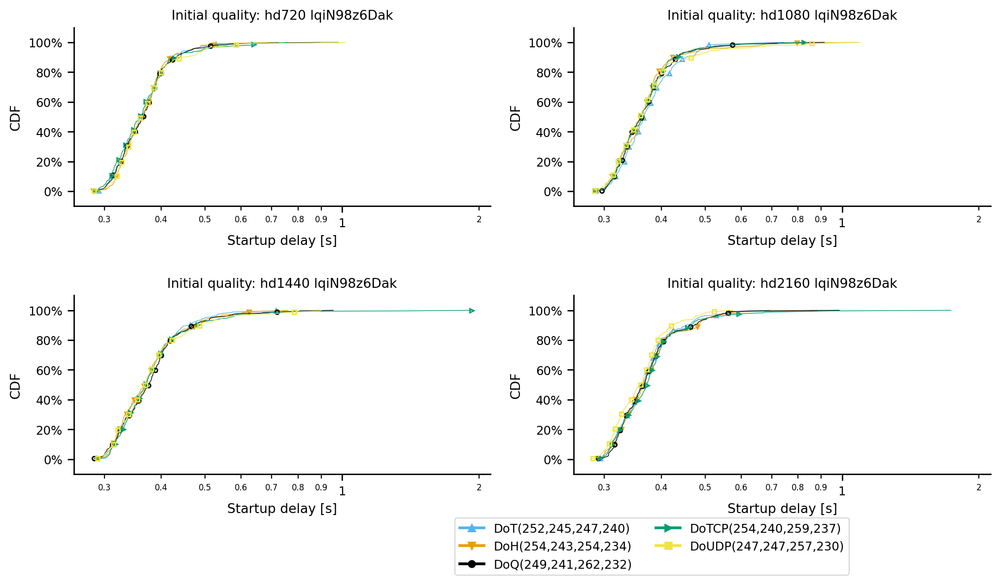

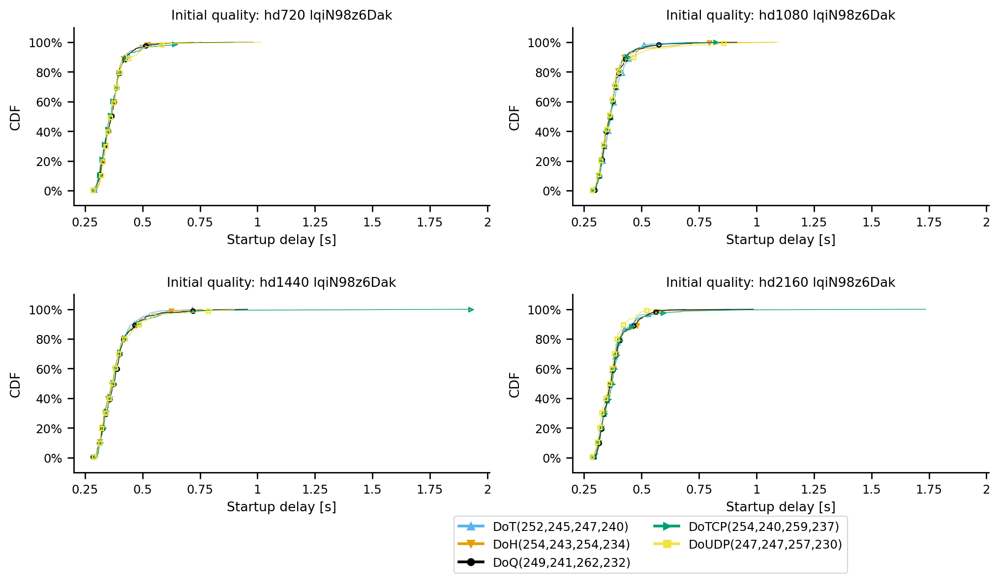

In [507]:
draw_cdf_grid(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0])

In [ ]:
draw_cdf(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0.1,1])

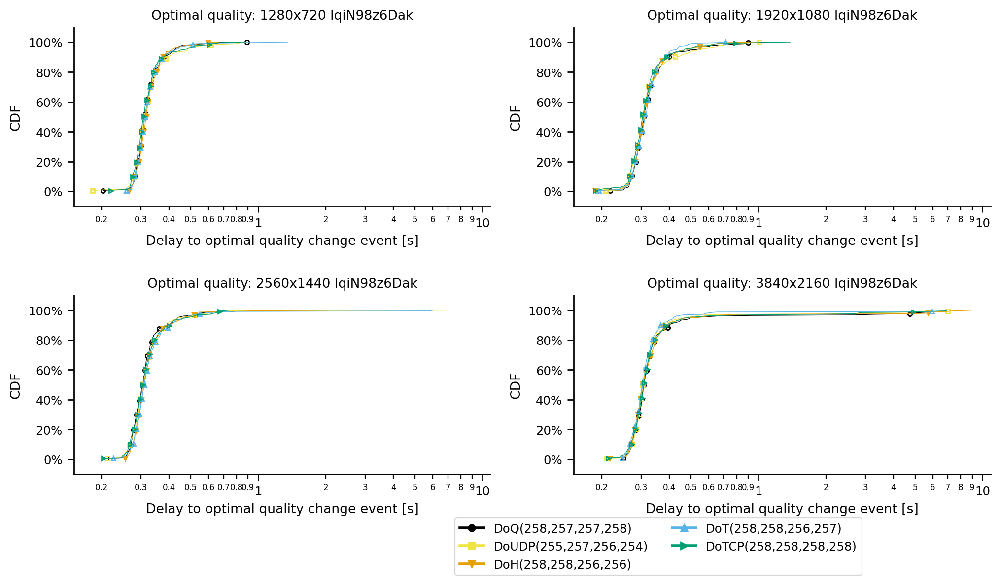

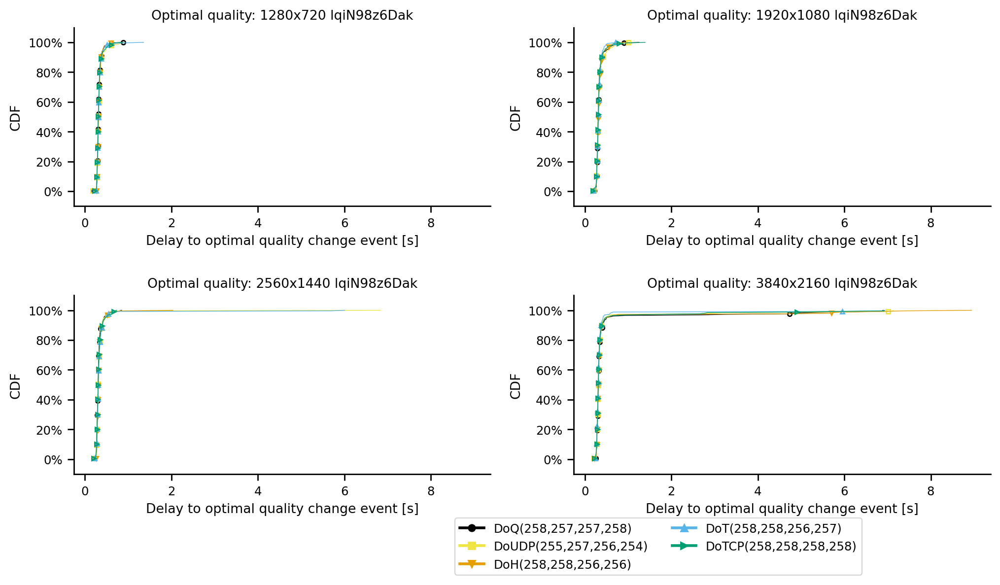

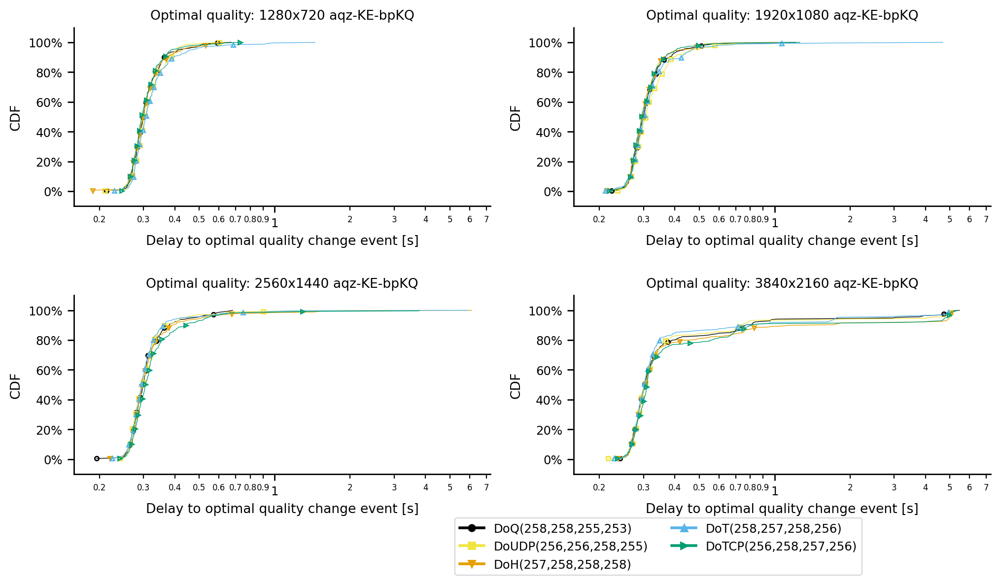

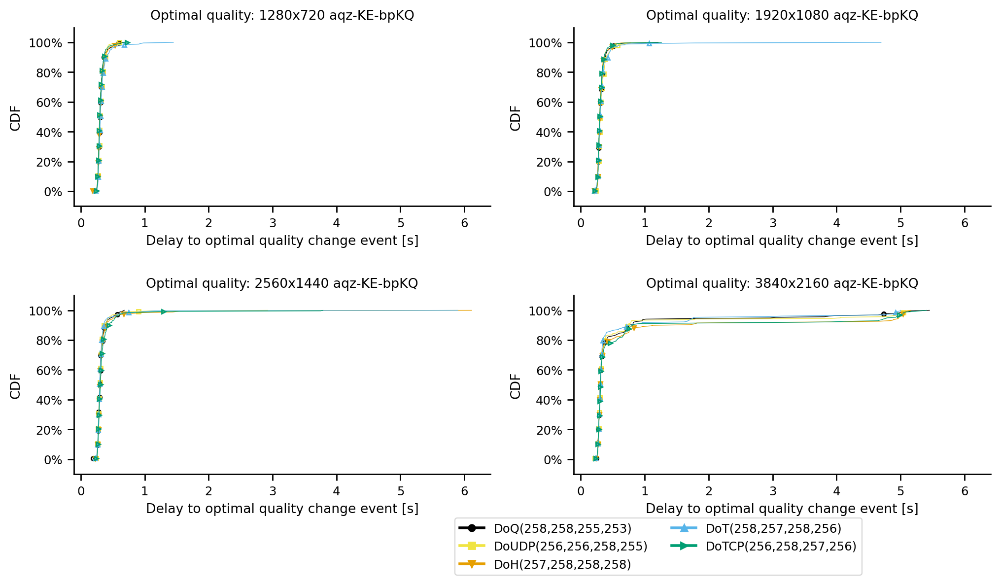

In [509]:
draw_cdf_grid(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True,False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0])

In [ ]:
draw_cdf(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True,False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0])

In [128]:
def draw_boxplot_grid(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, ylabel, showmean=True):
    proto_order=['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    if col_name_ == 'protocol':
        y_order = proto_order
    else:
        y_order = sorted(df_[col_name_].unique().tolist())
    with plt.style.context('seaborn-whitegrid'):
        for vp in df_['vantagePoint'].unique():
            print(vp)
            for video in df_['domain'].unique():
                for log in log_list:
                    num_rows = math.ceil(df_[col_outer_groupby_].nunique()/2)
                    if col_outer_groupby_ == 'true_initial_quality':
                        num_rows = 2
                    if df_[col_outer_groupby_].nunique() > 1:
                        fig, axs = plt.subplots(num_rows, 2, sharex='all', figsize=(12,6*num_rows))#, sharey='all')
                        fig.subplots_adjust(hspace=.2, wspace=.3)
                        col_outer_groupby_values = df_[col_outer_groupby_].sort_values().unique()
                        if col_outer_groupby_ == 'true_initial_quality':
                            col_outer_groupby_values = ['hd720', 'hd1080', 'hd1440', 'hd2160']
                        for col_grp_, ax in zip(col_outer_groupby_values, axs.flat):
                        #for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                            lnwidth = .5
                            mrksize = 3
                            df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                            #hue=
                            
                            boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                            showfliers=False, order=y_order,
                            color='white',
                            meanline = True, showmeans = showmean, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                            #sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                            
                            if log:
                                ax.set_xscale('log')
                            
                            
                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel(ylabel)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)

                            ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                            ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                        plt.show()

In [129]:
def draw_boxplot(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, ylabel, showmean=True):
    proto_order=['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    if col_name_ == 'protocol':
        y_order = proto_order
    else:
        y_order = sorted(df_[col_name_].unique().tolist())
    with plt.style.context('seaborn-whitegrid'):
        for vp in df_['vantagePoint'].unique():
            print(vp)
            for video in df_['domain'].unique():
                for log in log_list:
                    for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                        fig, ax = plt.subplots(figsize=(6,8))
                        #hue=
                        boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                        showfliers=False, order=y_order,
                        color='white',
                        meanline = True, showmeans = showmean, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                        #sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                        
                        if log:
                            ax.set_xscale('log')
                        
                        
                        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


                        ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                        ax.set_xlabel(xlabel)

                        ax.set_ylabel(ylabel)
                        if xlim != [0,0]:
                            ax.set_xlim(xlim)

                        ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                        ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                        #plt.show()

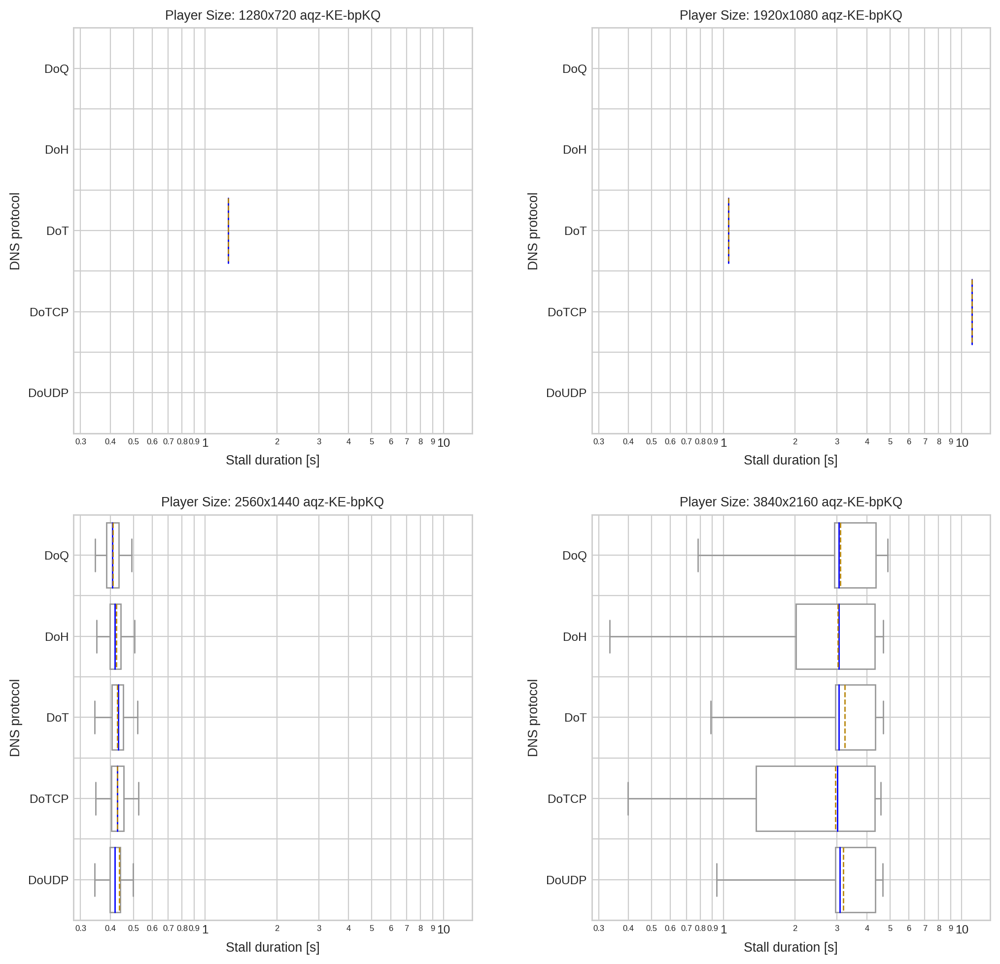

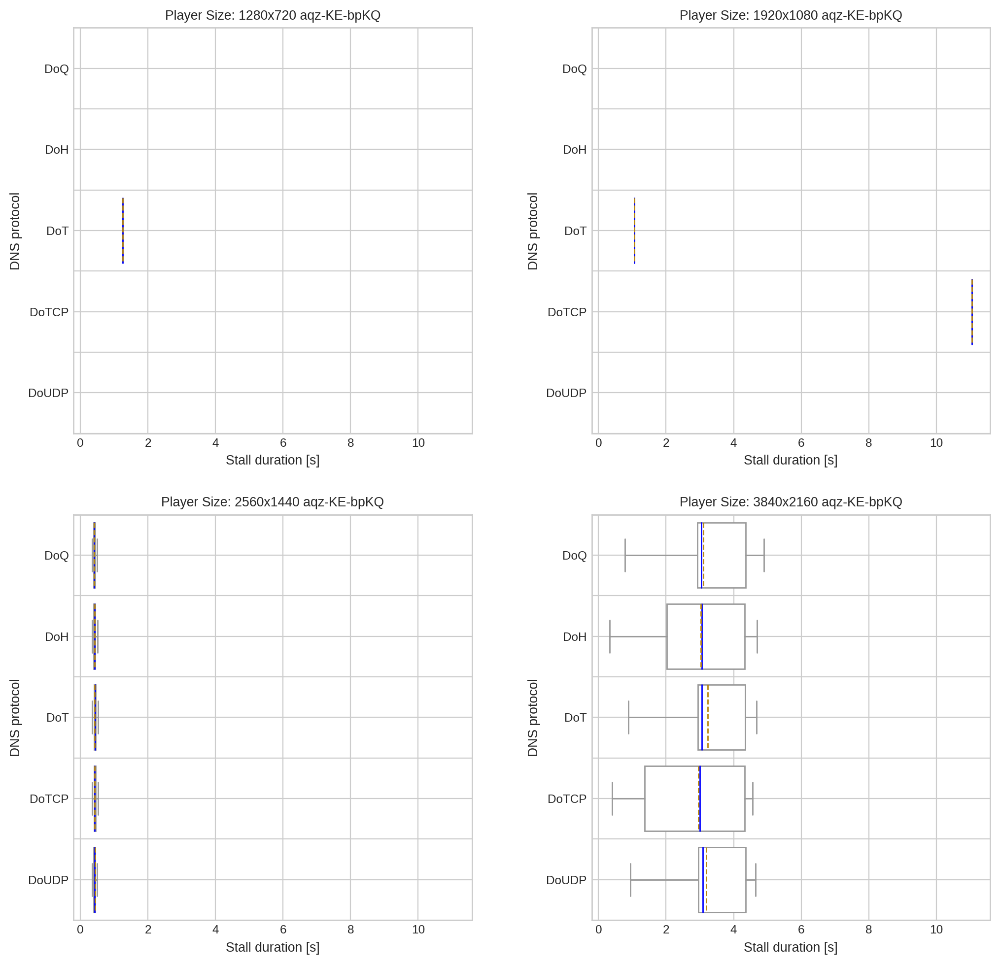

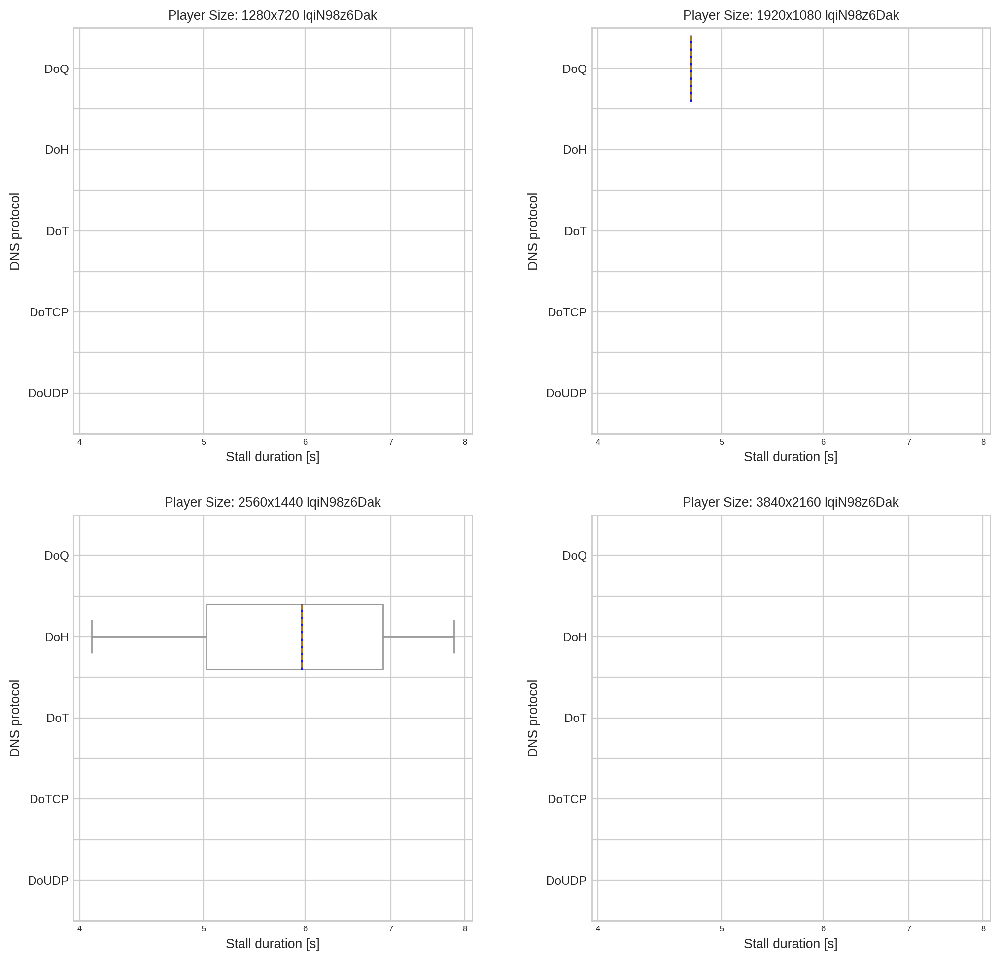

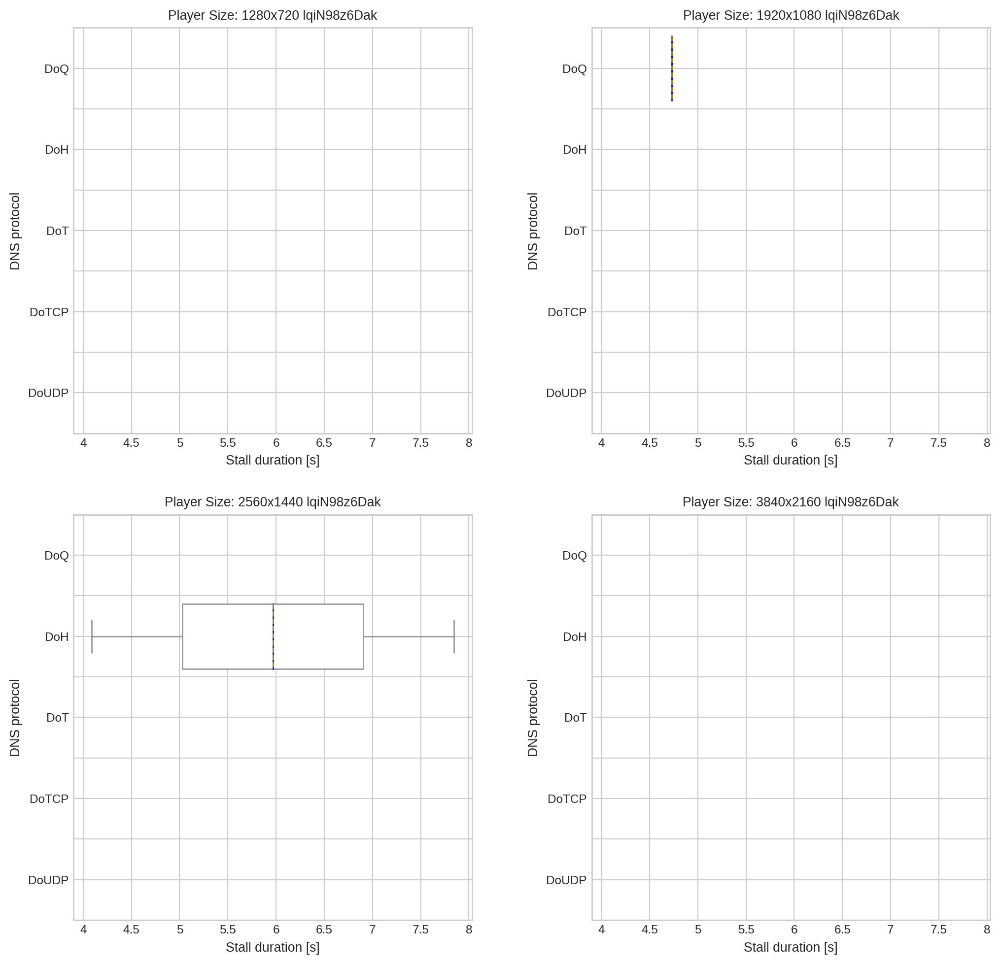

In [709]:
draw_boxplot_grid(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], "DNS protocol")

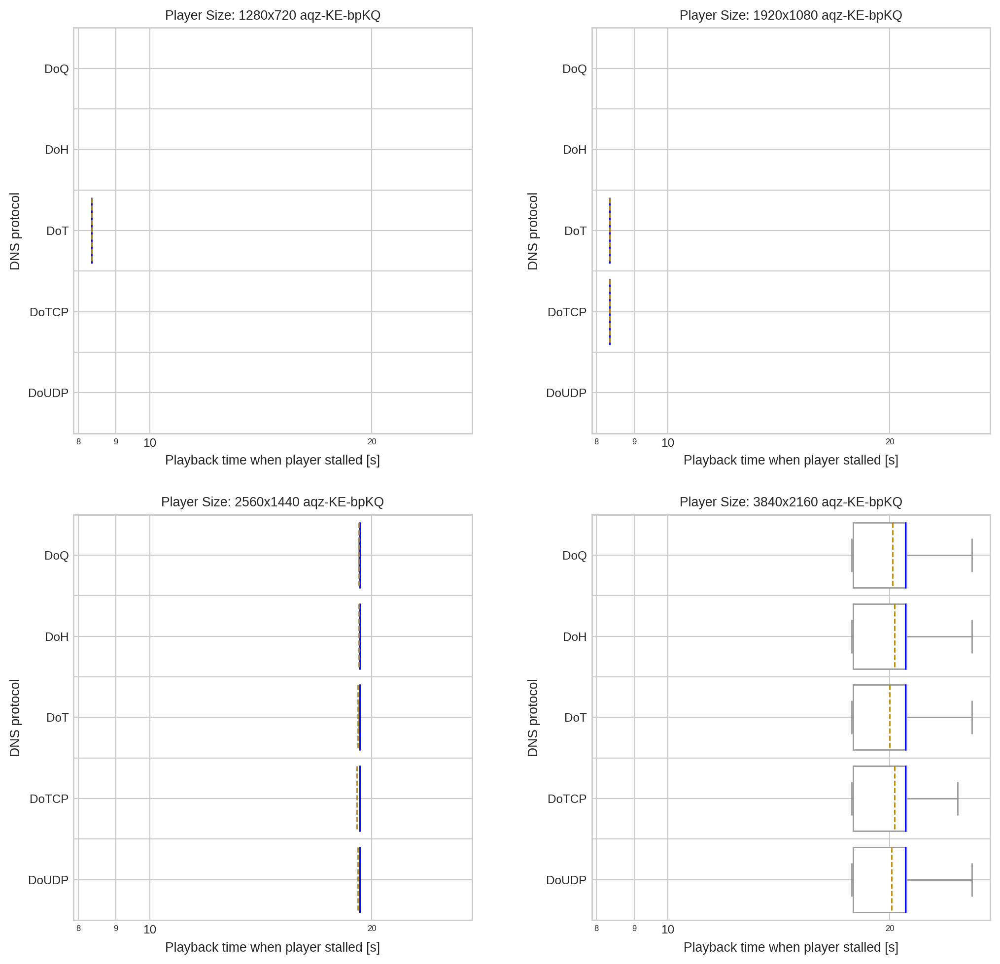

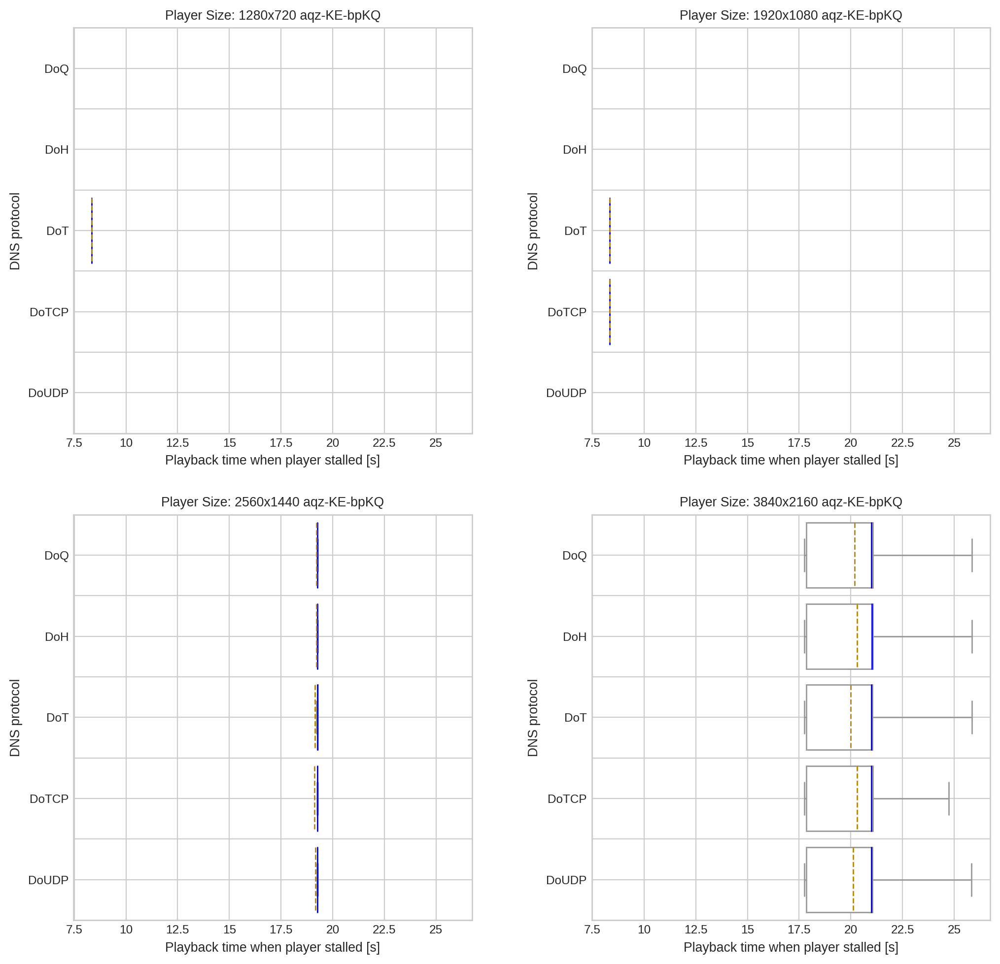

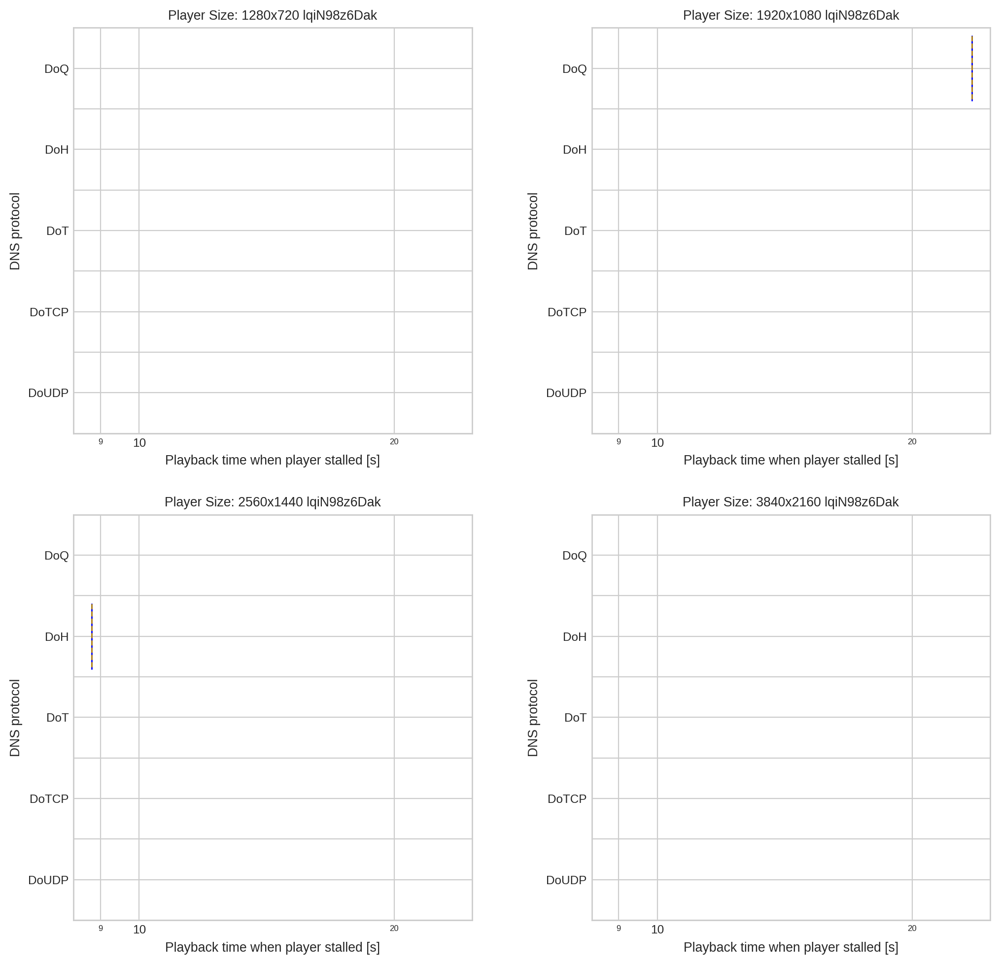

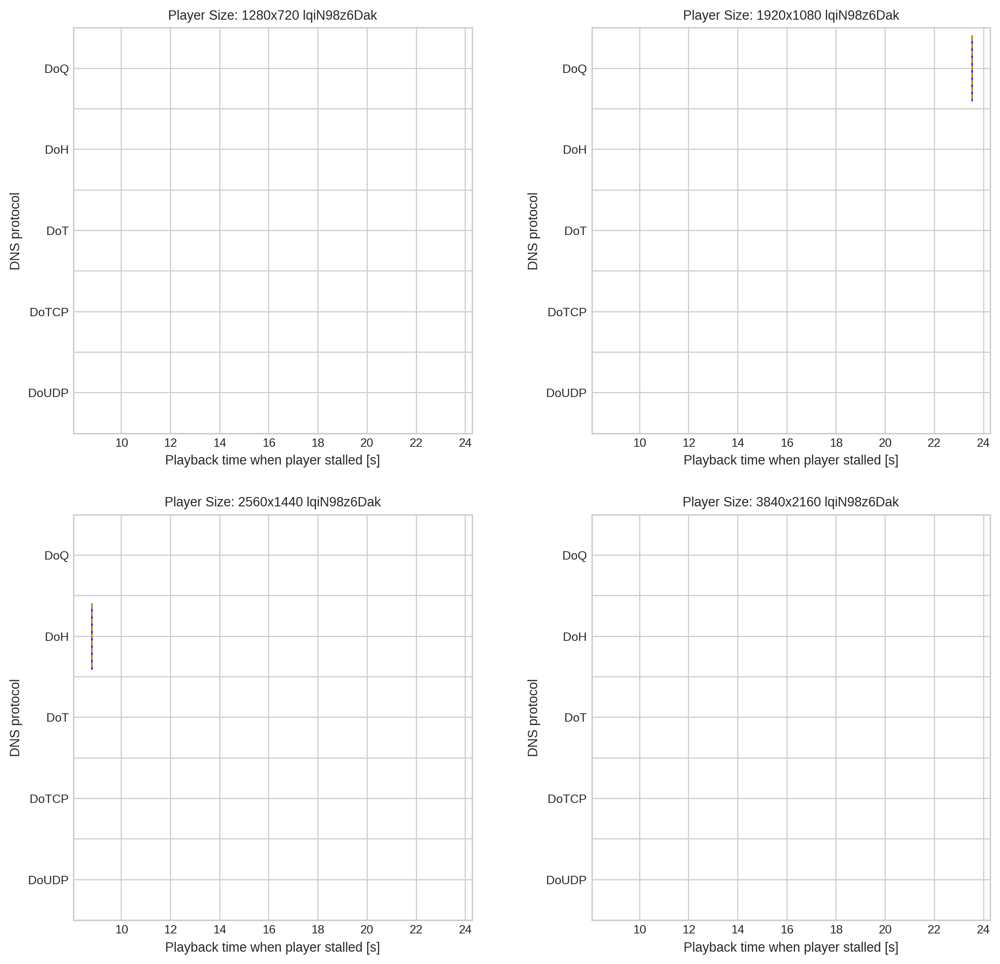

In [688]:
draw_boxplot_grid(df_stall_times, 'player_dimensions', 'protocol', 'curr_play_time', [True, False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-with-restart-events-by-player-size-and-proto', [0,0], "DNS protocol")

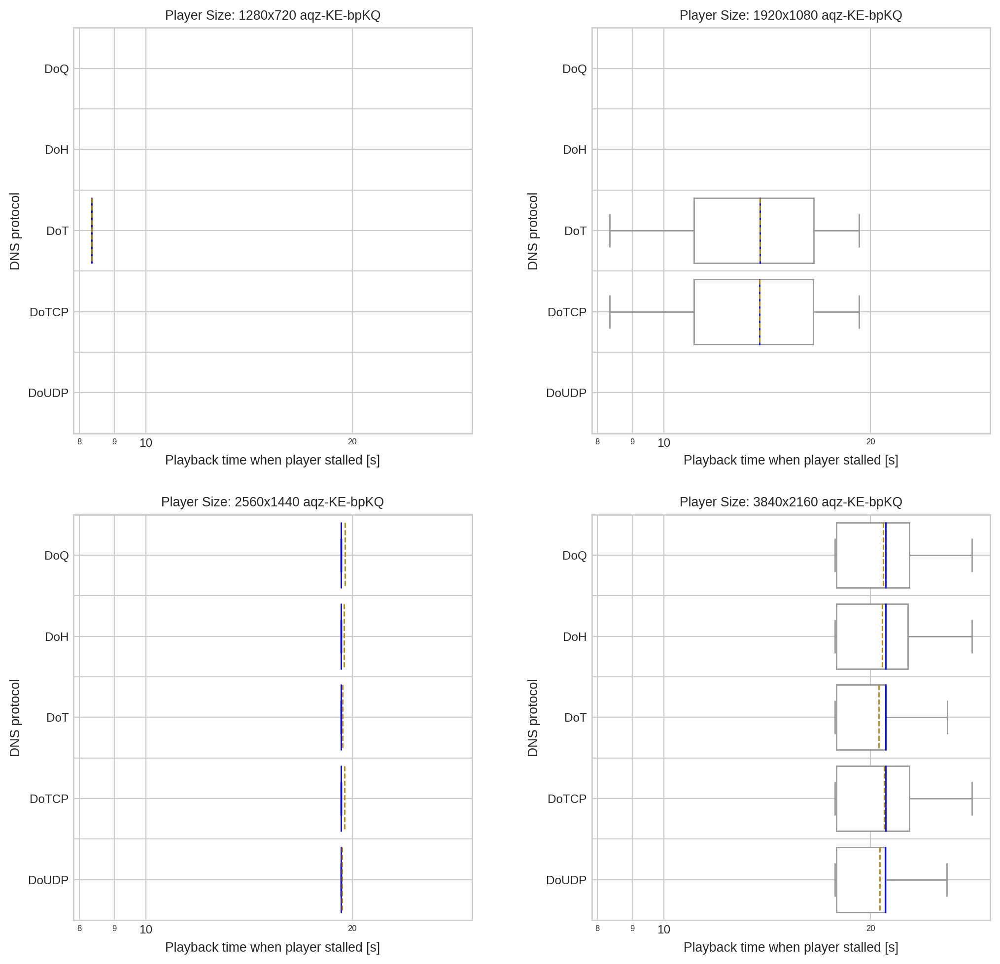

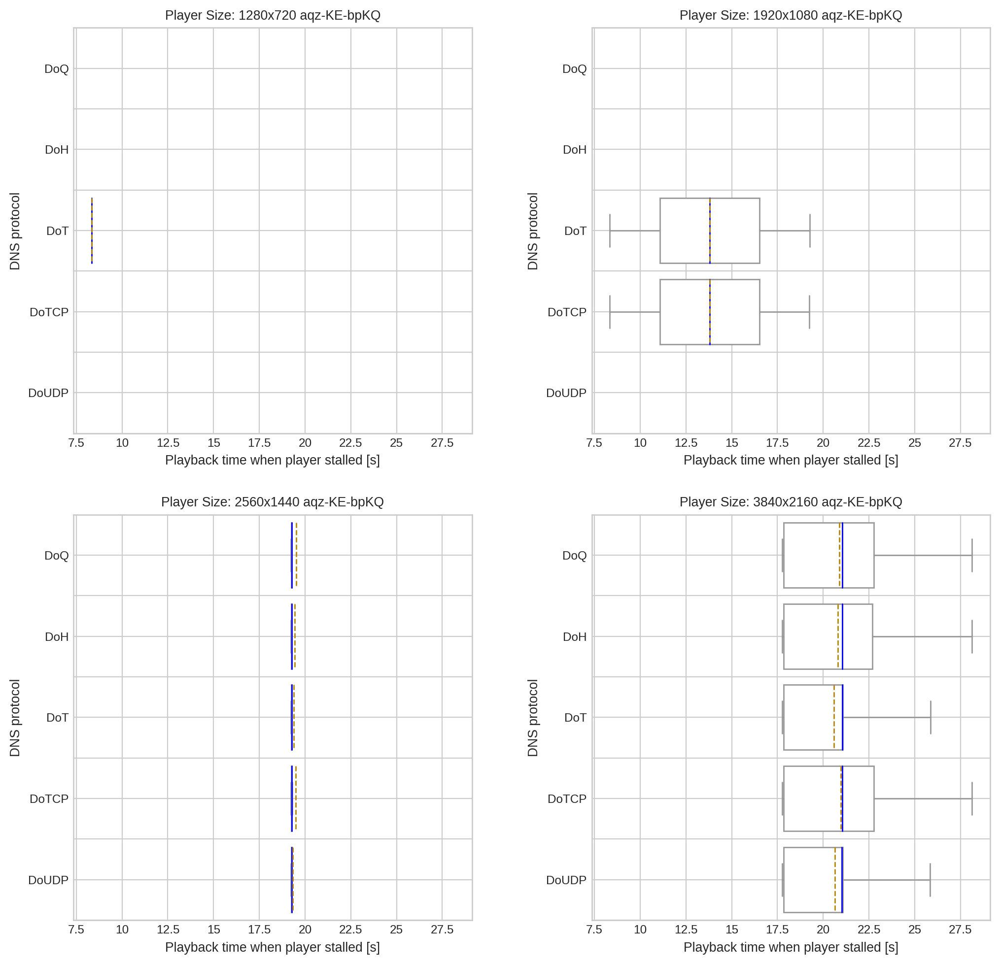

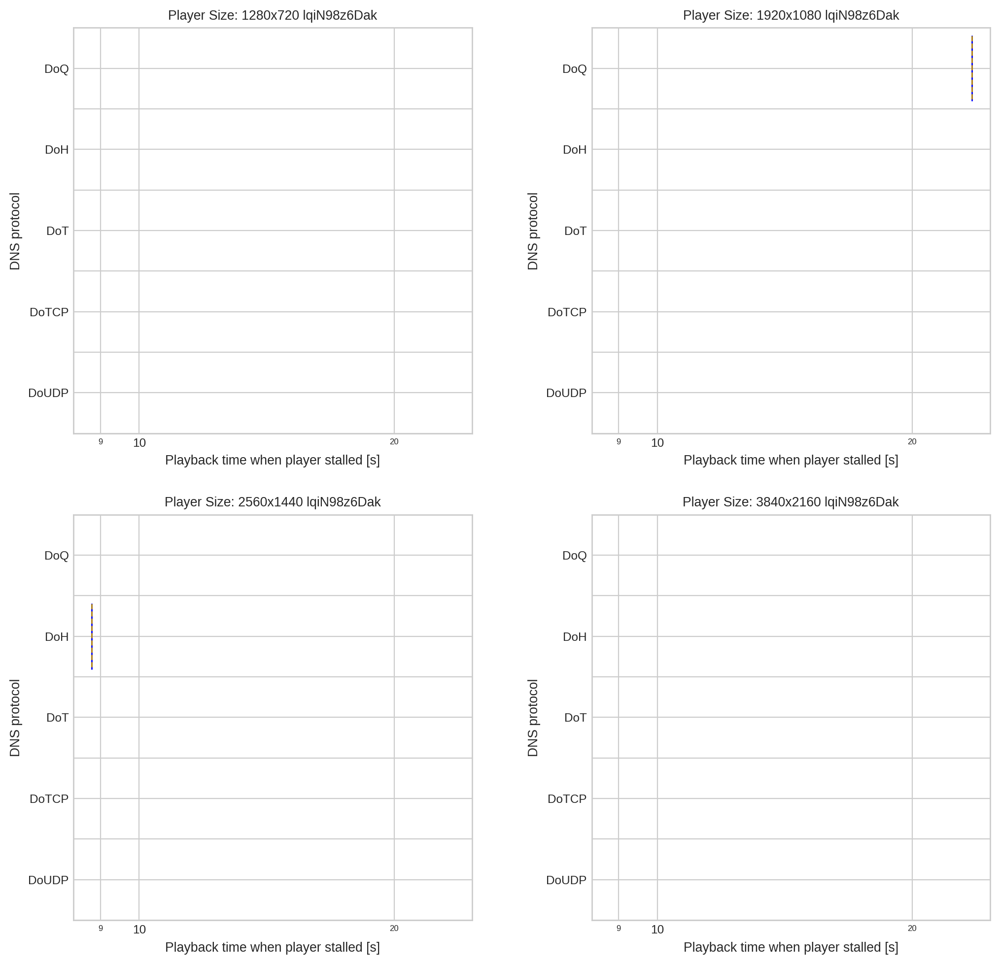

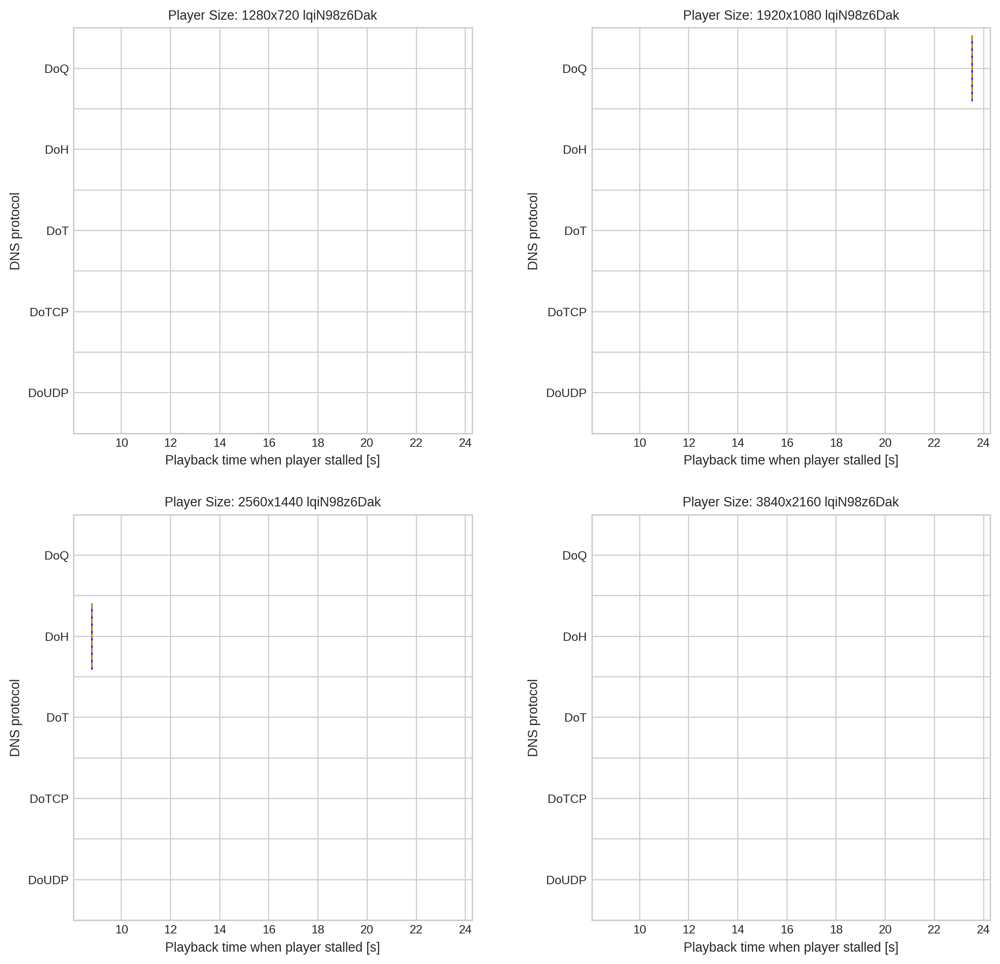

In [515]:
draw_boxplot_grid(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True, False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], "DNS protocol")

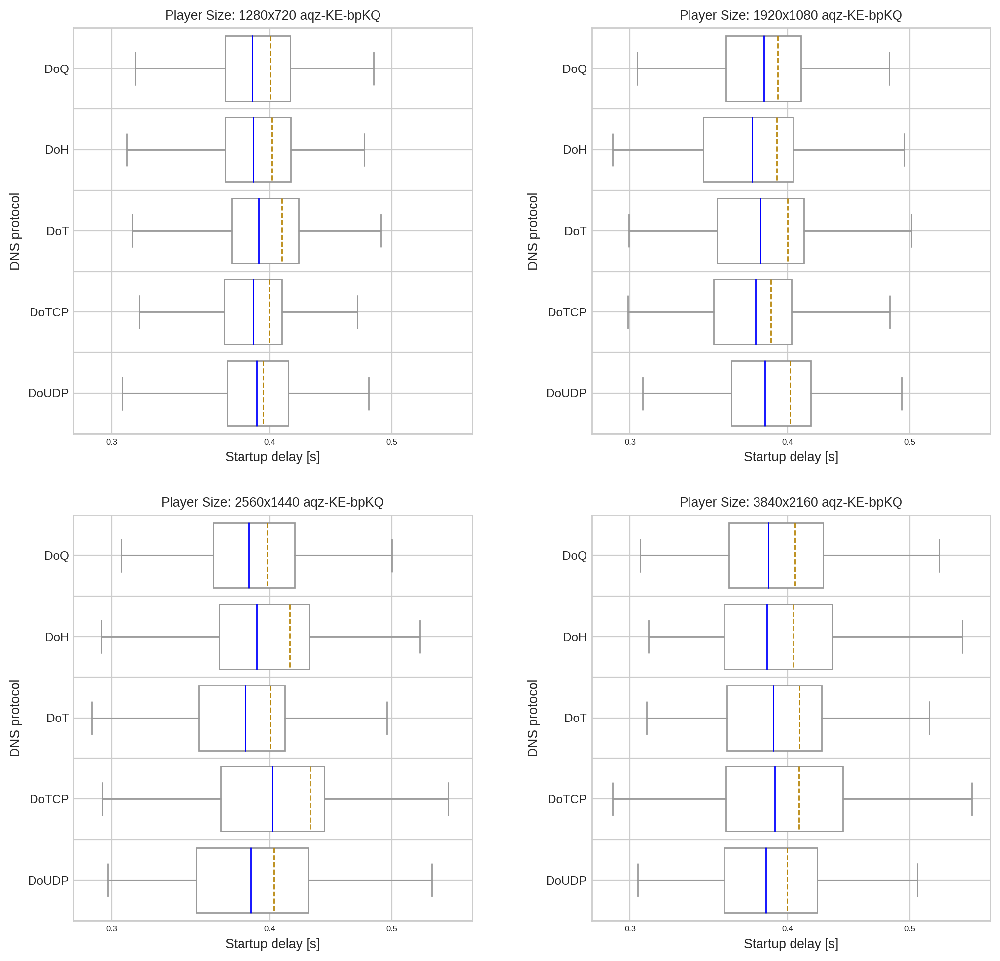

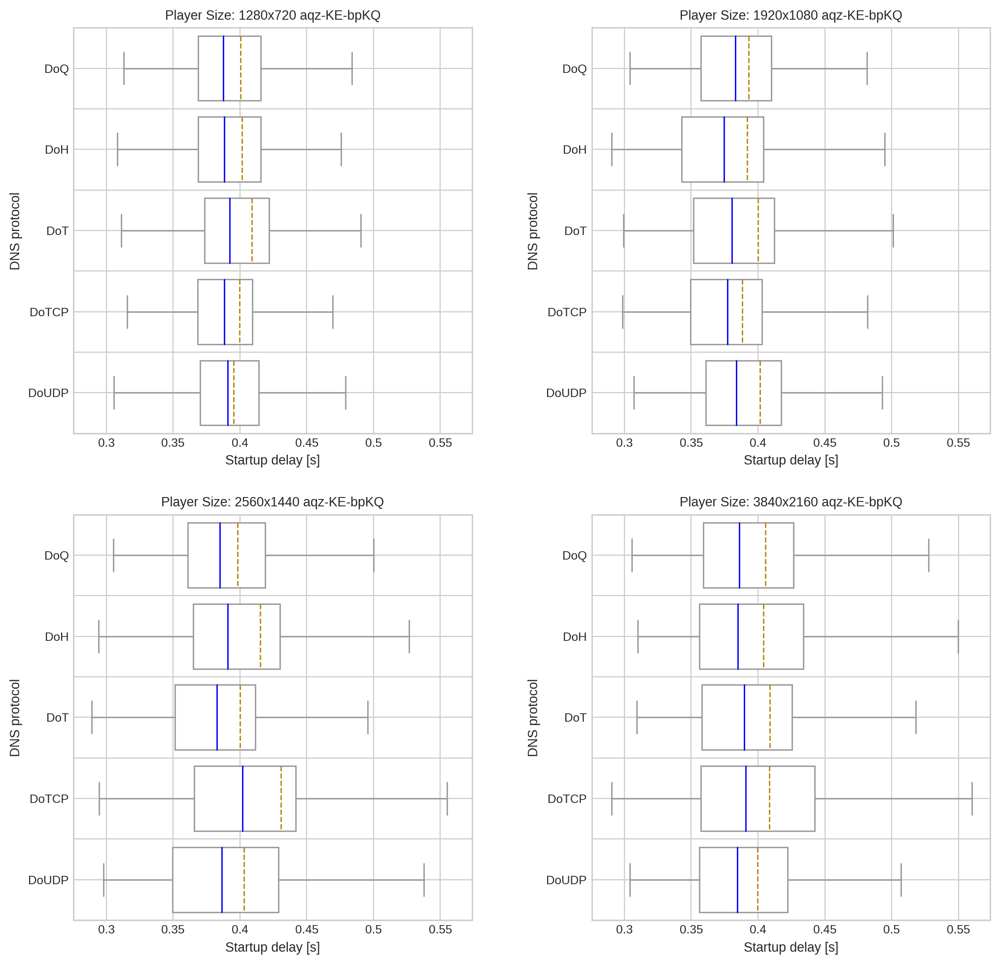

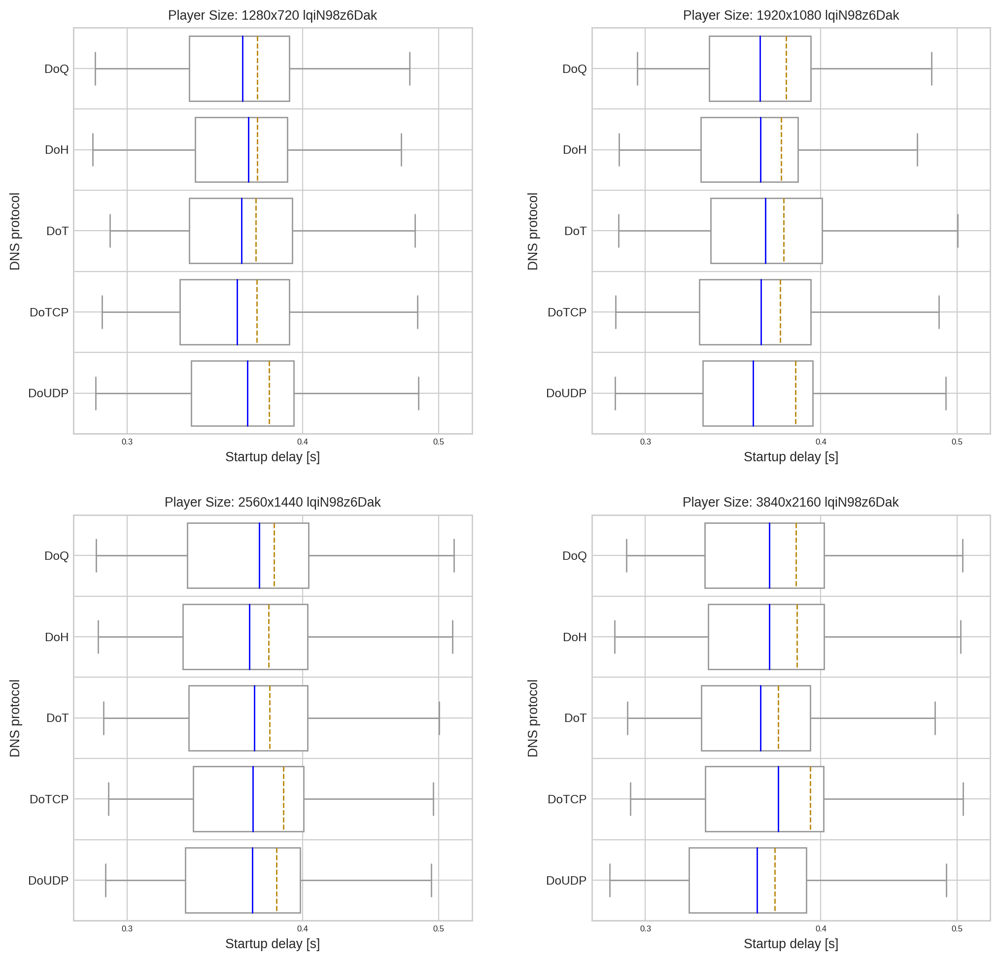

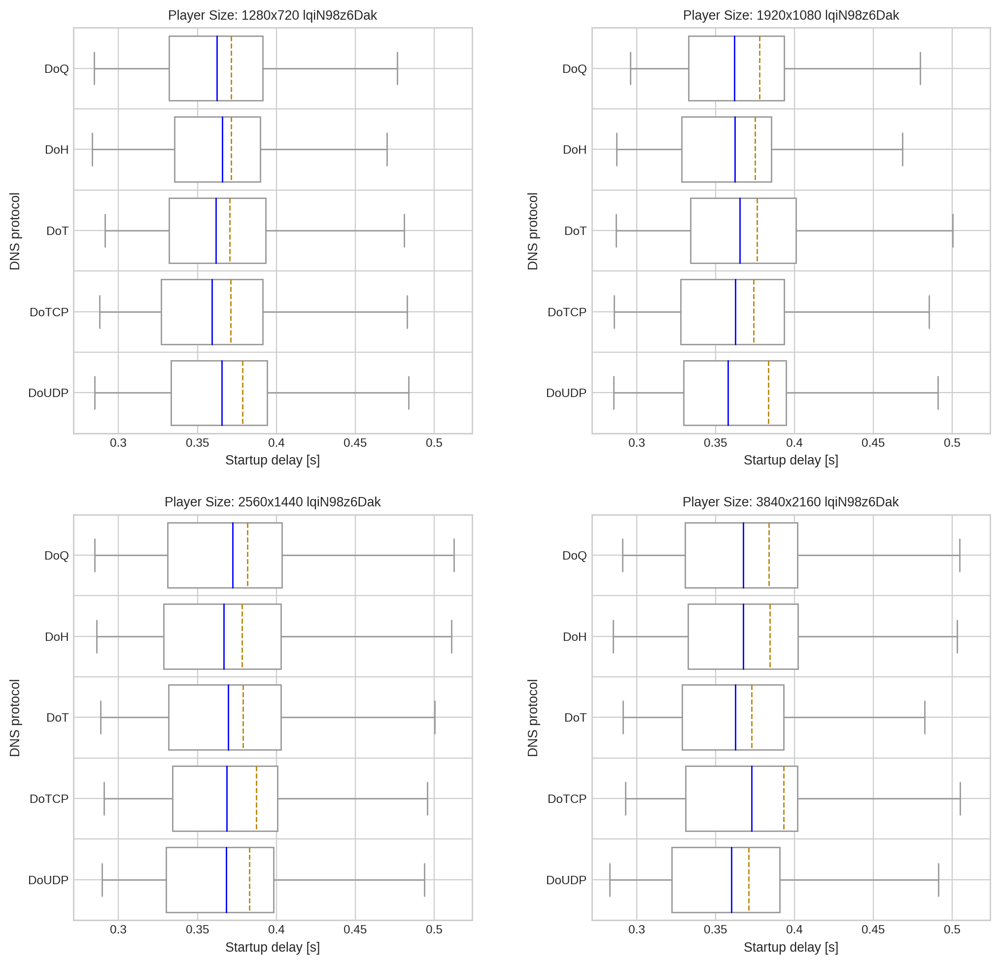

In [517]:
draw_boxplot_grid(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True, False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0], "DNS protocol")

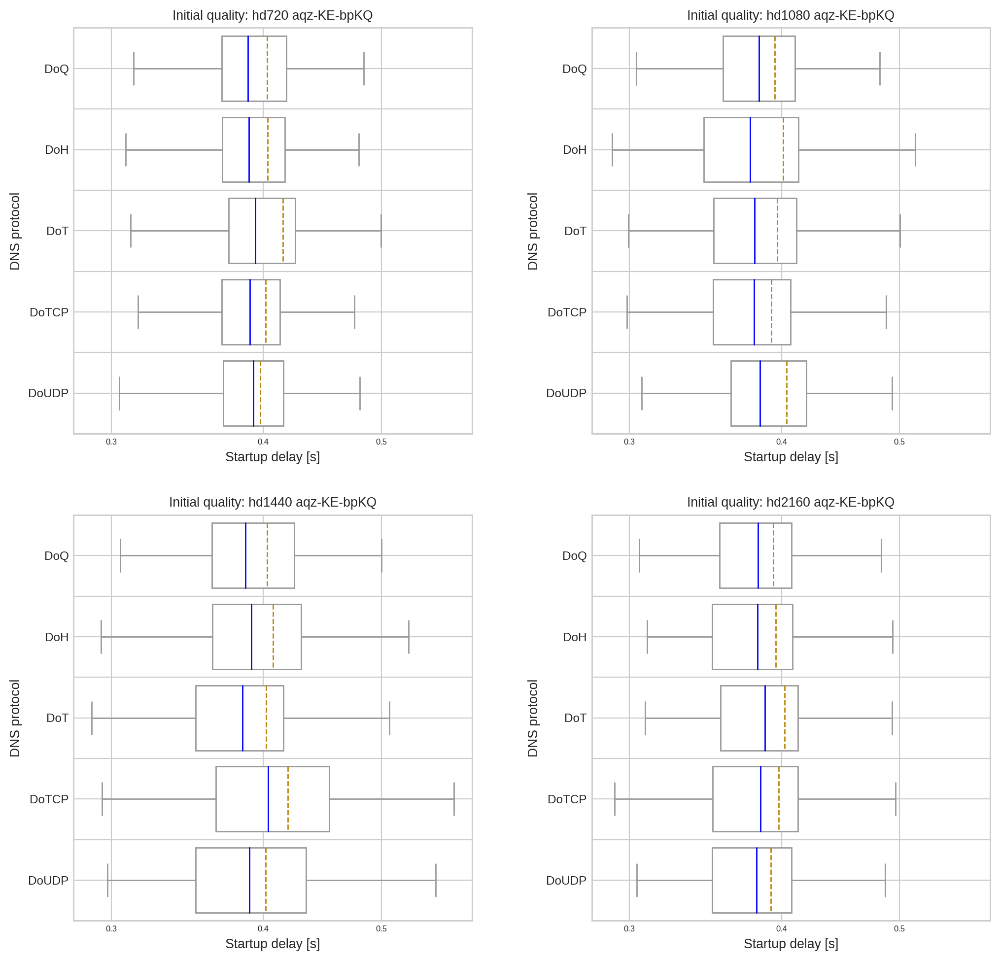

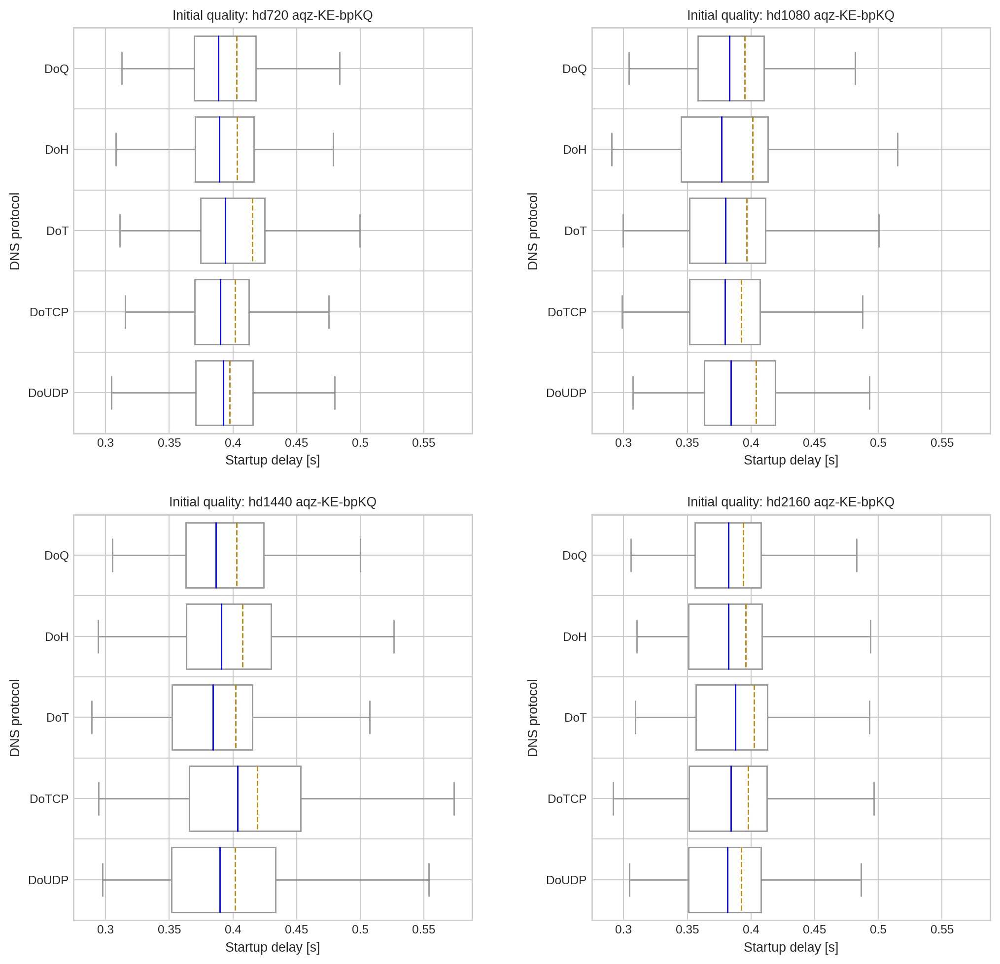

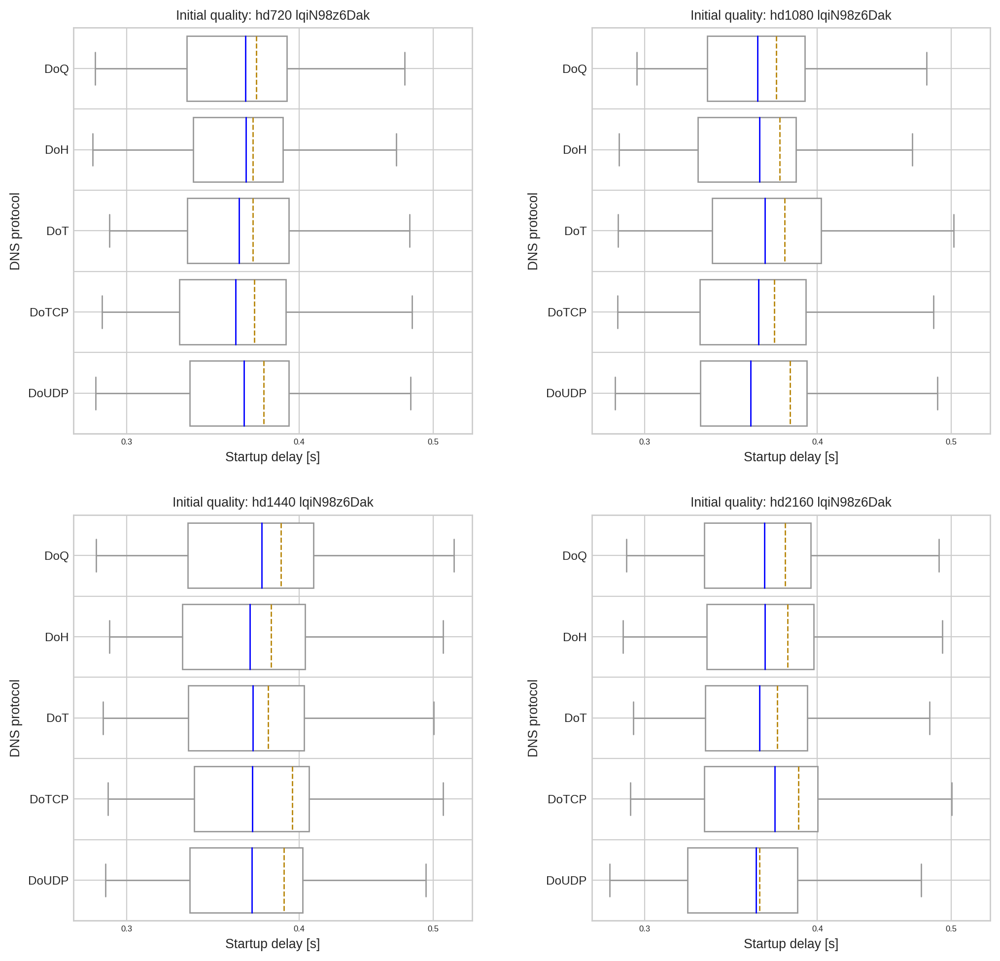

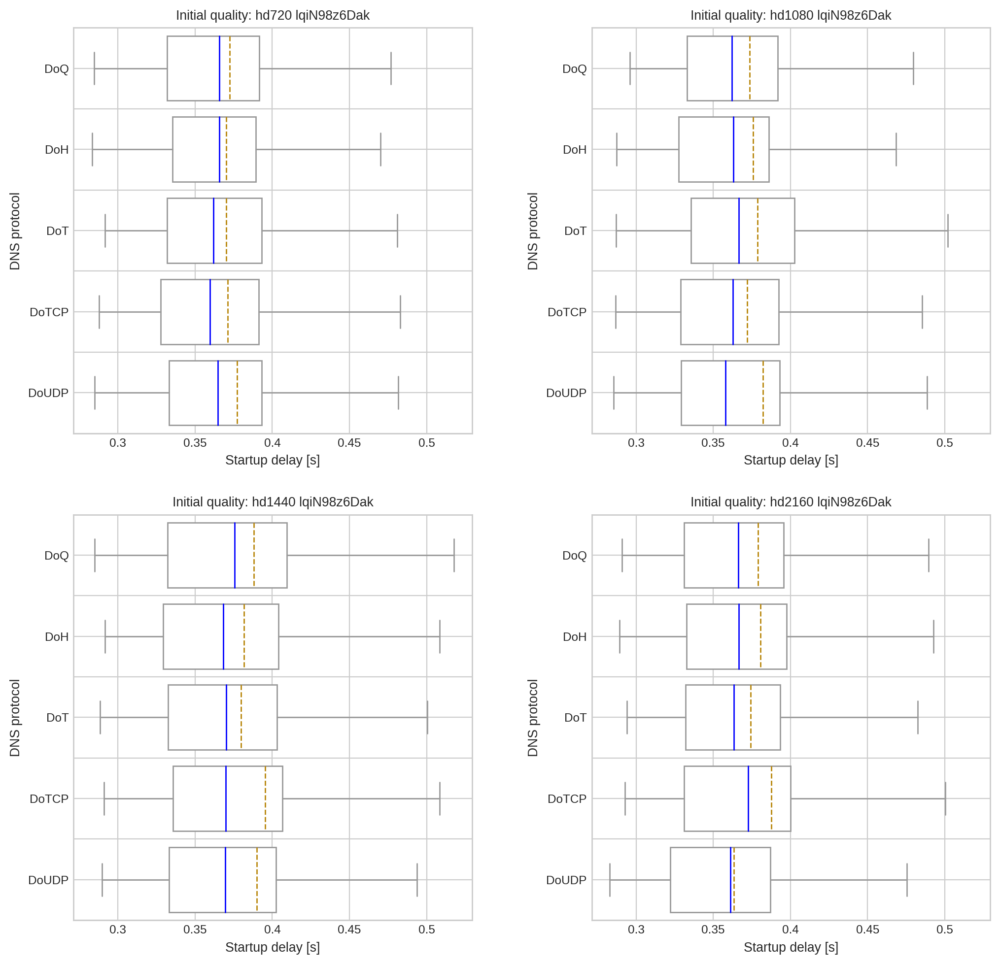

In [519]:
draw_boxplot_grid(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True, False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0], "DNS protocol")


In [ ]:
draw_boxplot(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0], "DNS protocol")


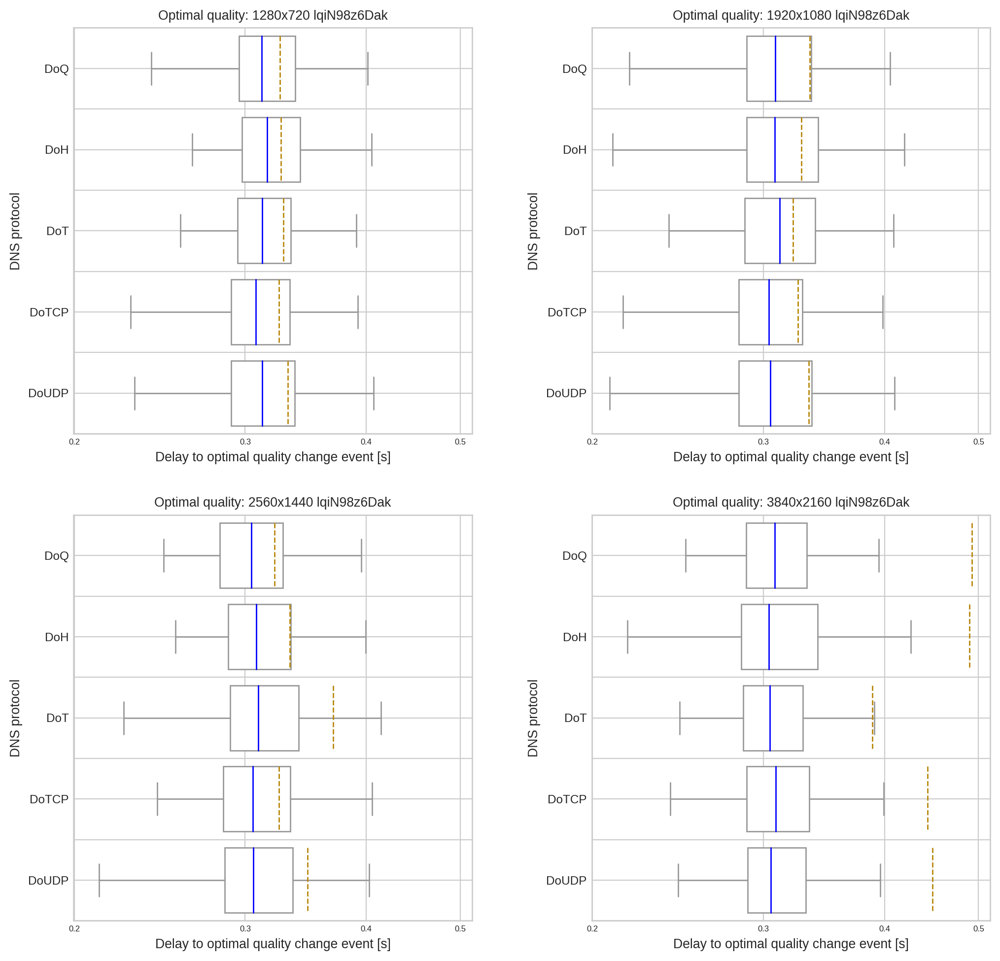

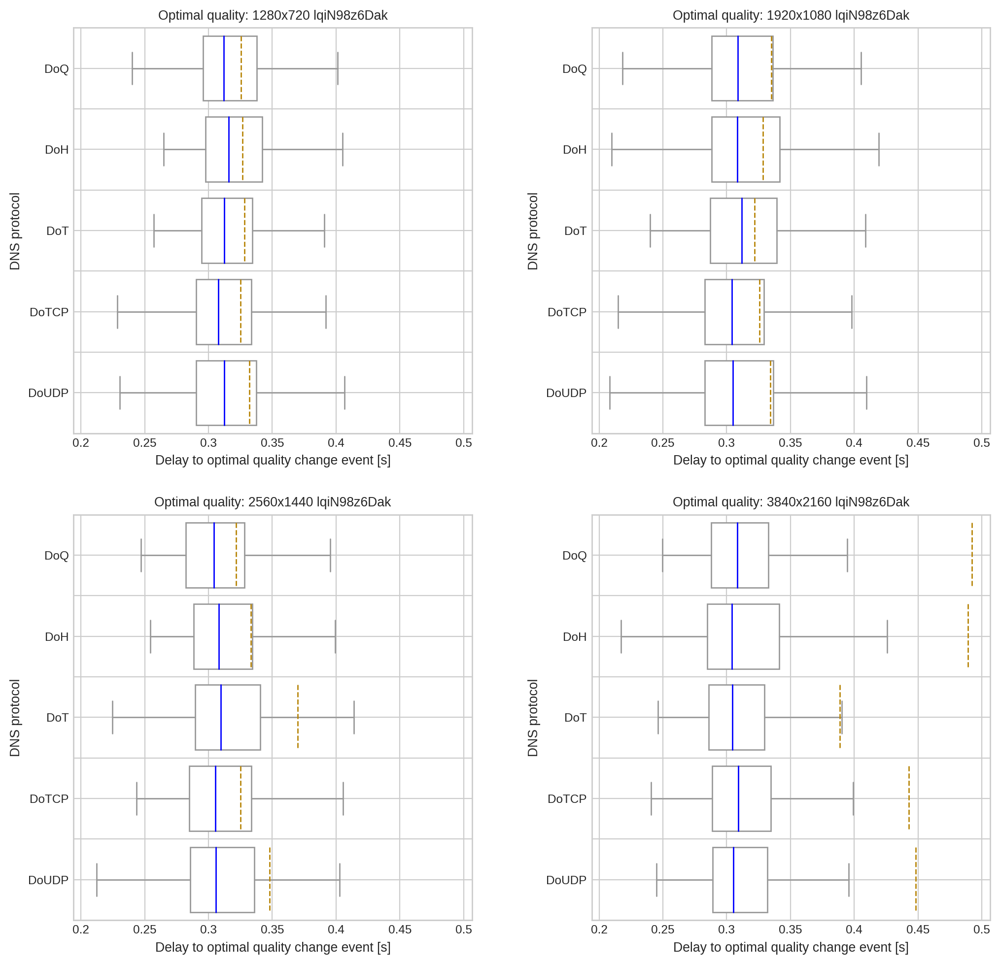

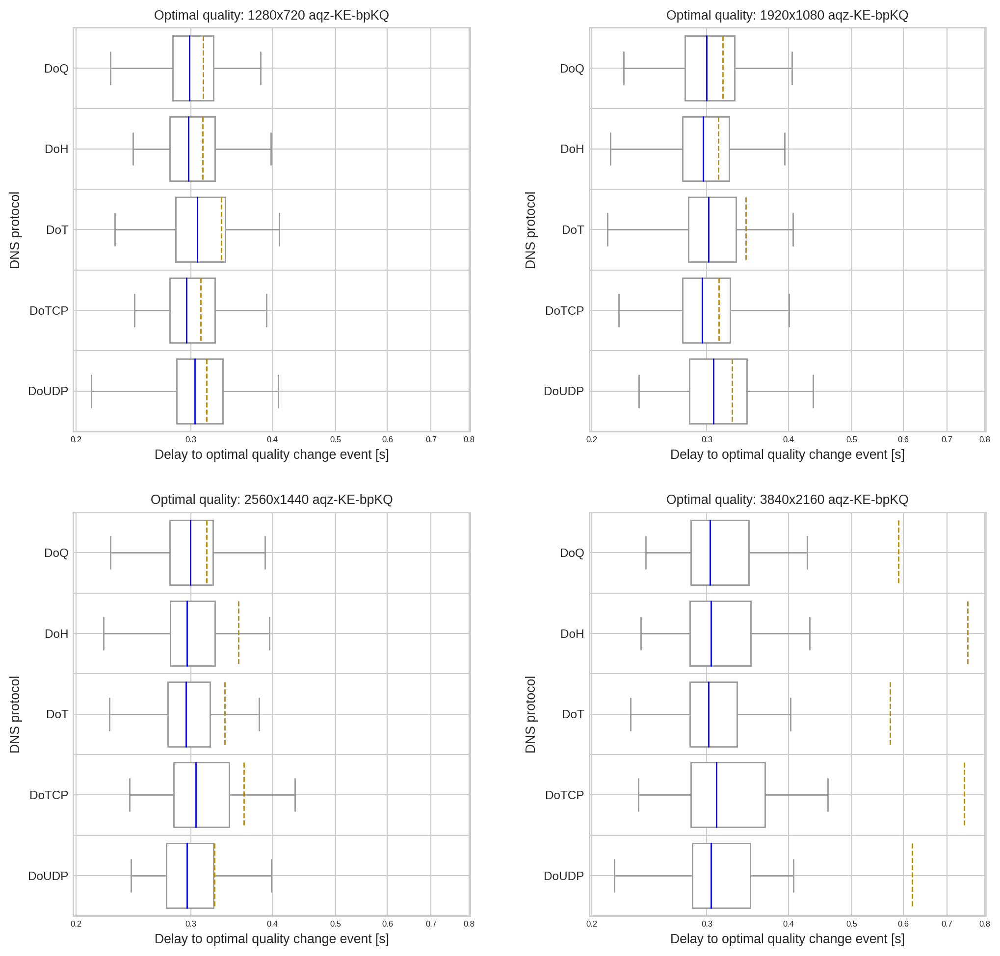

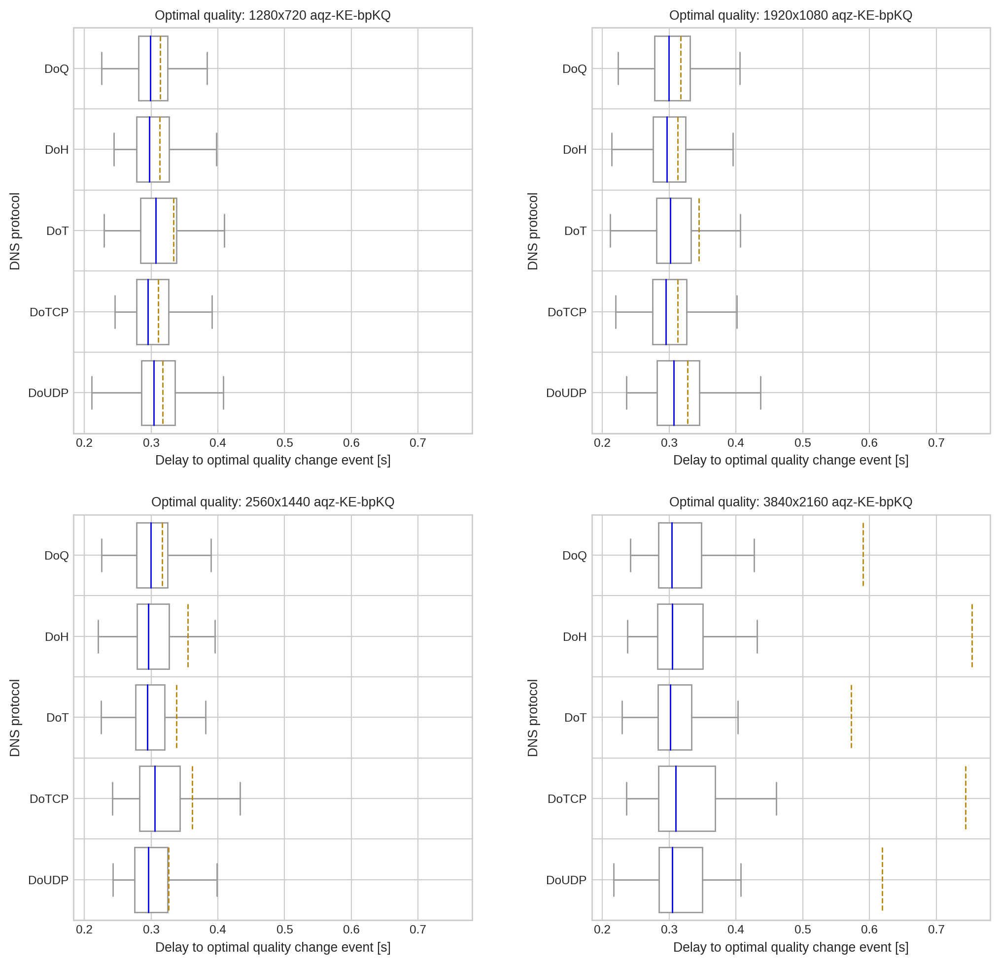

In [521]:
draw_boxplot_grid(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True, False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], "DNS protocol")

In [ ]:
draw_boxplot(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], "DNS protocol")

## Lookup times

In [130]:
df_resolution_lookups = pd.read_sql_query("SELECT measurement_id as msm_id, elapsed, status, answer, domain as queried_domain FROM lookups", conn)

In [131]:
df_resolution_lookups.groupby('msm_id', as_index=False).size().sort_values('size')

,msm_id,size
184,58de2b73-b444-14cd-c941-c31a58e763eb,2
0,00a2e807-f142-4ff3-7145-1849771c6b9e,5
265,850dae11-b493-5091-4371-c563f51cd404,5
264,8432f2cd-9524-9a36-0a08-1324ce4f5f7b,5
261,8317382b-1a23-b78f-2bdd-e5343e42f482,5
...,...,...
249,7a38bb63-df55-3211-876e-d10de5a2b564,11
257,82142390-4338-c4b7-9734-140b335927f2,11
94,2e046151-ce67-606a-0fb7-f654b4eef601,11
132,42e2ce4e-4dd3-2f58-2837-a35f478ee763,11


In [133]:
df_resolution_lookups[df_resolution_lookups.msm_id == 'bd03fe5e-ffc2-abe2-3509-6b6d7a057d11']

,msm_id,elapsed,status,answer,queried_domain
1758,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,4.799743,NOERROR,"www.youtube.com.,115,IN,CNAME,youtube-ui.l.goo...",www.youtube.com.
1759,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.482636,NOERROR,"fonts.gstatic.com.,265,IN,CNAME,gstaticadssl.l...",fonts.gstatic.com.
1760,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.296448,NOERROR,"googleads.g.doubleclick.net.,211,IN,A,142.250....",googleads.g.doubleclick.net.
1761,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.249715,NOERROR,"static.doubleclick.net.,118,IN,CNAME,static-do...",static.doubleclick.net.
1762,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.265308,NOERROR,"jnn-pa.googleapis.com.,43,IN,A,142.250.74.106|",jnn-pa.googleapis.com.
1763,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.232847,NOERROR,"redirector.googlevideo.com.,270,IN,A,142.250.7...",redirector.googlevideo.com.
1764,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.368327,NOERROR,"www.gstatic.com.,225,IN,A,142.250.74.99|",www.gstatic.com.
1765,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.281051,NOERROR,"yt3.ggpht.com.,238,IN,CNAME,photos-ugc.l.googl...",yt3.ggpht.com.
1766,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.309415,NOERROR,"i.ytimg.com.,88,IN,A,142.250.74.118|i.ytimg.co...",i.ytimg.com.
1767,bd03fe5e-ffc2-abe2-3509-6b6d7a057d11,1.352703,NOERROR,"r2---sn-4g5edns6.googlevideo.com.,1435,IN,CNAM...",r2---sn-4g5edns6.googlevideo.com.


In [134]:
df_resolution_lookups[df_resolution_lookups.status == 'NOERROR'].queried_domain.value_counts()

www.youtube.com.                      479
fonts.gstatic.com.                    479
googleads.g.doubleclick.net.          479
static.doubleclick.net.               479
www.gstatic.com.                      478
www.google.com.                       241
yt3.ggpht.com.                        240
i.ytimg.com.                          239
rr2---sn-4g5lzner.googlevideo.com.    152
rr2---sn-4g5ednly.googlevideo.com.     89
jnn-pa.googleapis.com.                 63
play.google.com.                       34
redirector.googlevideo.com.             8
r2---sn-4g5e6nzz.googlevideo.com.       3
rr2---sn-5hnekn7z.googlevideo.com.      1
r2---sn-4g5edns6.googlevideo.com.       1
changelogs.ubuntu.com.                  1
Name: queried_domain, dtype: int64

In [135]:
df_resolution_lookups[df_resolution_lookups.status != 'NOERROR'].queried_domain.value_counts()

www.youtube.com.    3
yt3.ggpht.com.      1
www.google.com.     1
ip-172-31-9-60.     1
Name: queried_domain, dtype: int64

In [136]:
df_resolution_lookups.elapsed.describe()

count     3472.000000
mean        10.871156
std        241.027407
min          0.635693
25%          0.954673
50%          1.248827
75%          2.034798
max      10004.841353
Name: elapsed, dtype: float64

In [137]:
df_resolution_lookups = pd.merge(measurements[['msm_id', 'protocol', 'server', 'vantagePoint', 'domain', 'player_dimensions']], df_resolution_lookups, on='msm_id')

In [138]:
df_resolution_lookups = pd.merge(df_true_initial_quality[['msm_id', 'true_initial_quality']], df_resolution_lookups, on='msm_id')

In [139]:
df_resolution_lookups[df_resolution_lookups.status != 'NOERROR'].groupby('server', as_index=False).agg({'queried_domain':pd.Series.unique})

,server,queried_domain


In [140]:
df_resolution_lookups[df_resolution_lookups.status != 'NOERROR'].groupby('msm_id', as_index=False).agg({'queried_domain':pd.Series.unique})

,msm_id,queried_domain


In [141]:
df_resolution_lookups[df_resolution_lookups.status == 'SERVFAIL']['answer'].tolist()

[]

In [142]:
df_resolution_lookups[df_resolution_lookups.status == 'SERVFAIL'].protocol.value_counts()

Series([], Name: protocol, dtype: int64)

In [143]:
df_googlevideo_lookup_time = df_resolution_lookups[df_resolution_lookups.queried_domain.str.endswith('.googlevideo.com.')].groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'elapsed':'median'}).reset_index().copy().dropna()
df_overall_lookup_time = df_resolution_lookups.groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'elapsed':'median'}).reset_index().copy().dropna()

In [144]:
df_googlevideo_lookup_time.rename(columns=lambda x: x.replace('elapsed', 'metric'), inplace=True)
df_googlevideo_lookup_time.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)
df_overall_lookup_time.rename(columns=lambda x: x.replace('elapsed', 'metric'), inplace=True)
df_overall_lookup_time.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)

In [145]:
df_googlevideo_lookup_time['protocol'] = pd.Categorical(df_googlevideo_lookup_time['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])
df_overall_lookup_time['protocol'] = pd.Categorical(df_overall_lookup_time['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

df_start_time, 'player_dimensions', 'protocol', 'startup_delay'

In [146]:
#startup_delay_medians = df_start_time[df_start_time.true_initial_quality.isin(['hd720', 'hd1080', 'hd1440', 'hd2160'])].groupby(['vantagePoint', 'domain', 'true_initial_quality', 'protocol']).agg({'startup_delay':'median'}).reset_index().copy().dropna()
#startup_delay_medians['true_initial_quality'] = startup_delay_medians['true_initial_quality'].map(map_quality_to_res)
#startup_delay_medians.rename(columns=lambda x: x.replace('startup_delay', 'metric'), inplace=True)
#startup_delay_medians.rename(columns=lambda x: x.replace('true_initial_quality', 'resolution'), inplace=True)

In [147]:
startup_delay_medians = df_start_time.groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'startup_delay':'median'}).reset_index().copy().dropna()
startup_delay_medians.rename(columns=lambda x: x.replace('startup_delay', 'metric'), inplace=True)
startup_delay_medians.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)

In [148]:
startup_delay_medians['protocol'] = pd.Categorical(startup_delay_medians['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

In [149]:
#make_quality_column_sortable(startup_delay_medians, 'true_initial_quality')

In [150]:
startup_delay_medians.sort_values(['domain', 'resolution', 'protocol'], inplace=True)

In [151]:
startup_delay_medians['metric'] = startup_delay_medians['metric'] * 1000

In [152]:
startup_delay_medians['resolution'].cat.remove_unused_categories(inplace=True)

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay'

In [153]:
delay_to_opt_medians = df_player_quality_change_event_to_opt.groupby(['vantagePoint', 'domain', 'optimal_res', 'protocol']).agg({'optimal_quality_delay':'median'}).reset_index().copy().dropna()

In [154]:
#make_res_column_sortable(delay_to_opt_medians, 'optimal_res')

In [155]:
delay_to_opt_medians['protocol'] = pd.Categorical(delay_to_opt_medians['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

In [156]:
delay_to_opt_medians.sort_values(['domain', 'optimal_res', 'protocol'], inplace=True)

In [157]:
delay_to_opt_medians['optimal_quality_delay'] = delay_to_opt_medians['optimal_quality_delay'] * 1000

In [158]:
delay_to_opt_medians.rename(columns=lambda x: x.replace('optimal_quality_delay', 'metric'), inplace=True)
delay_to_opt_medians.rename(columns=lambda x: x.replace('optimal_res', 'resolution'), inplace=True)

In [163]:
delay_to_opt_medians[(delay_to_opt_medians.vantagePoint == "Europe Central") & (delay_to_opt_medians.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

protocol,DoQ,DoH,DoT,DoTCP,DoUDP
resolution,,,,,
1280x720,291.30,298.60,299.50,295.95,282.85
1920x1080,290.85,343.60,292.95,290.00,353.75
2560x1440,294.75,320.80,273.15,284.65,328.70
3840x2160,1655.75,1300.70,1676.60,5689.40,645.80


In [164]:
startup_delay_medians[(startup_delay_medians.vantagePoint == "Europe Central") & (startup_delay_medians.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

protocol,DoQ,DoH,DoT,DoTCP,DoUDP
resolution,,,,,
1280x720,367.90,387.95,408.60,395.05,395.20
1920x1080,372.90,439.50,374.60,393.60,422.85
2560x1440,404.70,409.00,421.20,381.65,396.10
3840x2160,479.95,482.50,407.30,456.60,392.20


In [165]:
df_googlevideo_lookup_time[(df_googlevideo_lookup_time.vantagePoint == "Europe Central") & (df_googlevideo_lookup_time.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

protocol,DoQ,DoH,DoT,DoTCP,DoUDP
resolution,,,,,
1280x720,0.89,1.49,1.25,2.31,1.24
1920x1080,1.02,1.27,1.24,2.29,1.24
2560x1440,0.84,1.41,1.26,2.29,1.49
3840x2160,0.82,1.42,1.64,122.47,1.27


In [166]:
df_googlevideo_lookup_time

,vantagePoint,domain,resolution,protocol,metric
0,Europe Central,aqz-KE-bpKQ,1280x720,DoH,1.489908
1,Europe Central,aqz-KE-bpKQ,1280x720,DoQ,0.886691
2,Europe Central,aqz-KE-bpKQ,1280x720,DoT,1.248520
3,Europe Central,aqz-KE-bpKQ,1280x720,DoTCP,2.313902
4,Europe Central,aqz-KE-bpKQ,1280x720,DoUDP,1.237479
5,Europe Central,aqz-KE-bpKQ,1920x1080,DoH,1.269993
6,Europe Central,aqz-KE-bpKQ,1920x1080,DoQ,1.024174
7,Europe Central,aqz-KE-bpKQ,1920x1080,DoT,1.240931
8,Europe Central,aqz-KE-bpKQ,1920x1080,DoTCP,2.293680
9,Europe Central,aqz-KE-bpKQ,1920x1080,DoUDP,1.239567


In [168]:
df_overall_lookup_time[(df_overall_lookup_time.vantagePoint == "Europe Central") & (df_overall_lookup_time.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

protocol,DoQ,DoH,DoT,DoTCP,DoUDP
resolution,,,,,
1280x720,0.88,1.35,1.19,2.12,1.18
1920x1080,0.87,1.25,1.22,2.16,1.18
2560x1440,0.86,1.36,1.26,2.16,1.19
3840x2160,0.87,1.45,1.20,2.24,1.22


In [171]:
df_plt_medians = measurements.groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'page_load_time':'median'}).reset_index().copy().dropna()
df_plt_medians.rename(columns=lambda x: x.replace('page_load_time', 'metric'), inplace=True)
df_plt_medians.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)

Europe Central


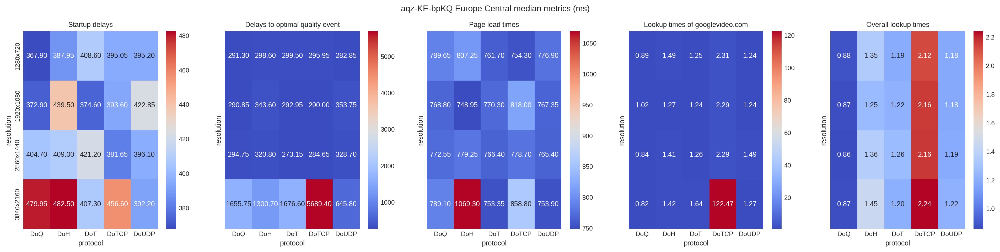

In [173]:
with plt.style.context('seaborn-whitegrid'):
    for vp in measurements['vantagePoint'].unique():
        print(vp)
        for video in measurements['domain'].unique():
            fig, axs = plt.subplots(1, 5, sharex='all', figsize=(24,5), sharey='all')
            #fig.subplots_adjust(hspace=.2, wspace=.3)
            fig.suptitle(video+' '+vp+' median metrics (ms)')
            df_tmp_1 = startup_delay_medians[(startup_delay_medians.vantagePoint == vp) & (startup_delay_medians.domain == video)]
            df_tmp_2 = delay_to_opt_medians[(delay_to_opt_medians.vantagePoint == vp) & (delay_to_opt_medians.domain == video)]
            df_tmp_3 = df_googlevideo_lookup_time[(df_googlevideo_lookup_time.vantagePoint == vp) & (df_googlevideo_lookup_time.domain == video)]
            df_tmp_4 = df_overall_lookup_time[(df_overall_lookup_time.vantagePoint == vp) & (df_overall_lookup_time.domain == video)]
            df_tmp_5 = df_plt_medians[(df_plt_medians.vantagePoint == vp) & (df_plt_medians.domain == video)]

            for df, ax, title in zip(
                [df_tmp_1, df_tmp_2, df_tmp_5, df_tmp_3, df_tmp_4],
                axs.flat, ['Startup delays', 'Delays to optimal quality event', 'Page load times', 'Lookup times of googlevideo.com', 'Overall lookup times']):
                sns.heatmap(df.pivot(index='resolution', columns='protocol', values='metric'), ax=ax, cmap="coolwarm", annot=True, fmt='.2f')
                ax.set_title(title)

            plt.show()

In [699]:
df_4k_stall_count = df_stall_times[df_stall_times.player_dimensions == '3840x2160'].groupby('msm_id', as_index=False).agg({'stall_time':'count'})
df_4k_stall_count.stall_time.value_counts()

2    1053
3     197
1      16
Name: stall_time, dtype: int64

In [700]:
one_stall = df_4k_stall_count[df_4k_stall_count.stall_time == 1].msm_id.unique().tolist()
two_stalls = df_4k_stall_count[df_4k_stall_count.stall_time == 2].msm_id.unique().tolist()
three_stalls = df_4k_stall_count[df_4k_stall_count.stall_time == 3].msm_id.unique().tolist()

In [732]:
df_4k_stalls = df_stall_times[df_stall_times.player_dimensions == '3840x2160'].copy().drop_duplicates()

In [733]:
first_stall = df_4k_stalls.loc[df_4k_stalls.groupby('msm_id').time.idxmin()].reset_index(drop=True).drop_duplicates()
latest_stall = df_4k_stalls.loc[df_4k_stalls.groupby('msm_id').time.idxmax()].reset_index(drop=True).drop_duplicates()

In [752]:
#get the second stall out of three by removing all first stalls and all last stalls -> this breaks if there are 4 stalls
#remove single stalls from the first merge because they would then get added in the second merge without getting dropped
second_stall_of_three = pd.concat([df_4k_stalls, first_stall[~first_stall.msm_id.isin(one_stall)]]).drop_duplicates(keep=False)
second_stall_of_three = pd.concat([second_stall_of_three, latest_stall]).drop_duplicates(keep=False)

In [753]:
print(first_stall.msm_id.nunique())
print(second_stall_of_three.msm_id.nunique())
print(latest_stall.msm_id.nunique())
print(latest_stall[latest_stall.msm_id.isin(one_stall)].msm_id.nunique())
print(latest_stall[latest_stall.msm_id.isin(two_stalls)].msm_id.nunique())
print(latest_stall[latest_stall.msm_id.isin(three_stalls)].msm_id.nunique())
print(latest_stall[~latest_stall.msm_id.isin(one_stall+two_stalls+three_stalls)].msm_id.nunique())
print(second_stall_of_three[second_stall_of_three.msm_id.isin(three_stalls)].msm_id.nunique())
print(second_stall_of_three[~second_stall_of_three.msm_id.isin(three_stalls)].msm_id.nunique())

1266
197
1266
16
1053
197
0
197
0


In [704]:
first_stall

,play_time,msm_id,current_quality_x,time,curr_play_time,current_quality_y,player_dimensions,protocol,vantagePoint,domain,stall_time
0,2022-03-01 16:09:53.362400256,002c7bc6-fe3e-ae13-cffe-4bf54efb6ae7,hd2160,2022-03-01 16:09:52.701699840,19.271126,hd2160,3840x2160,DoH,,aqz-KE-bpKQ,0.6607
1,2022-03-05 03:50:30.735099904,0051ac02-224a-3e71-08f5-017cd79037f8,hd2160,2022-03-05 03:50:26.382400000,17.842161,hd2160,3840x2160,DoTCP,,aqz-KE-bpKQ,4.3527
2,2022-03-05 19:45:13.009299968,01e94cdc-dadf-784d-43d3-467ff2cd7b55,hd2160,2022-03-05 19:45:08.371800064,17.789207,hd2160,3840x2160,DoQ,,aqz-KE-bpKQ,4.6375
3,2022-02-28 18:50:37.707100160,02636420-1f6a-107b-db1f-f6e69e11448c,hd2160,2022-02-28 18:50:33.261499904,17.845864,hd2160,3840x2160,DoTCP,,aqz-KE-bpKQ,4.4456
4,2022-03-04 19:45:12.139899904,029215fe-3ca1-9225-64ca-625070d793f2,hd2160,2022-03-04 19:45:11.432399872,19.272017,hd2160,3840x2160,DoQ,,aqz-KE-bpKQ,0.7075
...,...,...,...,...,...,...,...,...,...,...,...
1261,2022-03-01 02:45:15.998100224,ffa30917-6342-dfca-2d00-5027f254d307,hd2160,2022-03-01 02:45:11.568000000,17.768053,hd2160,3840x2160,DoQ,,aqz-KE-bpKQ,4.4301
1262,2022-03-03 21:25:56.067200000,ffb251eb-dee7-f752-3460-be715d91f585,hd2160,2022-03-03 21:25:51.741900032,17.826731,hd2160,3840x2160,DoUDP,,aqz-KE-bpKQ,4.3253
1263,2022-03-01 05:20:36.208199936,ffefeeaa-abd0-57b6-3719-6c689999dce1,hd2160,2022-03-01 05:20:31.894700032,17.857483,hd2160,3840x2160,DoTCP,,aqz-KE-bpKQ,4.3135
1264,2022-03-02 01:50:37.414400256,fff0047b-515d-34bf-35d3-763998591c8d,hd2160,2022-03-02 01:50:33.119600128,17.805035,hd2160,3840x2160,DoTCP,,aqz-KE-bpKQ,4.2948


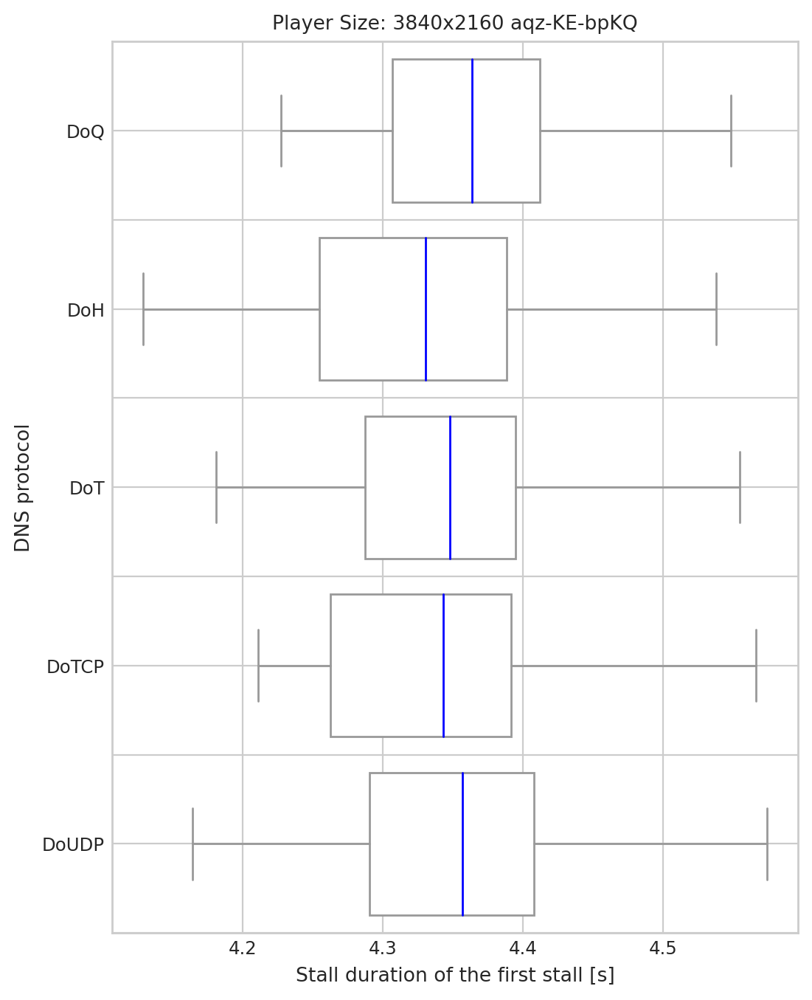

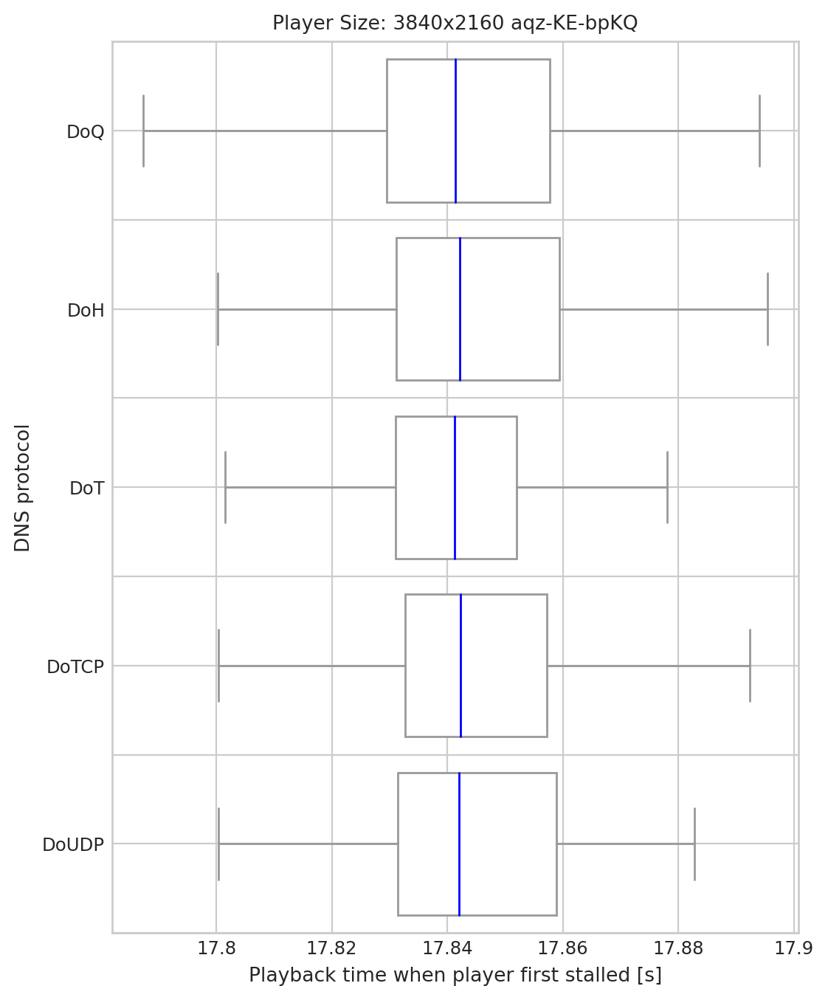

In [718]:
draw_boxplot(first_stall, 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the first stall [s]', 'Player Size:', 'first-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(first_stall, 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player first stalled [s]', 'Player Size:', 'first-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

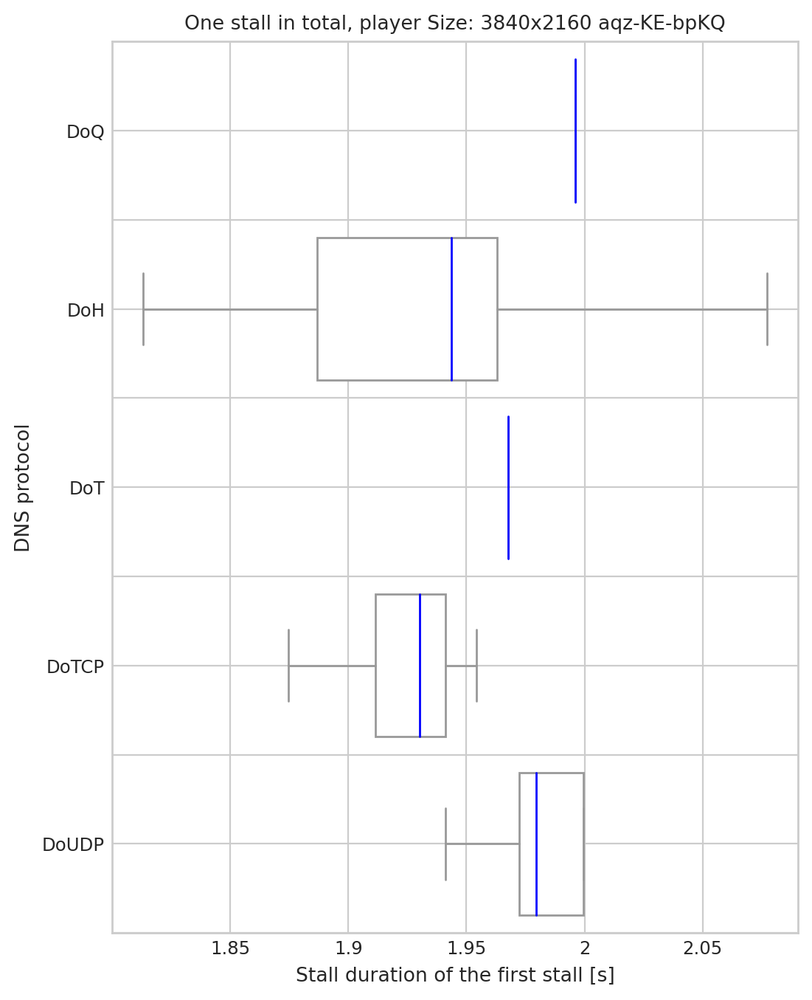

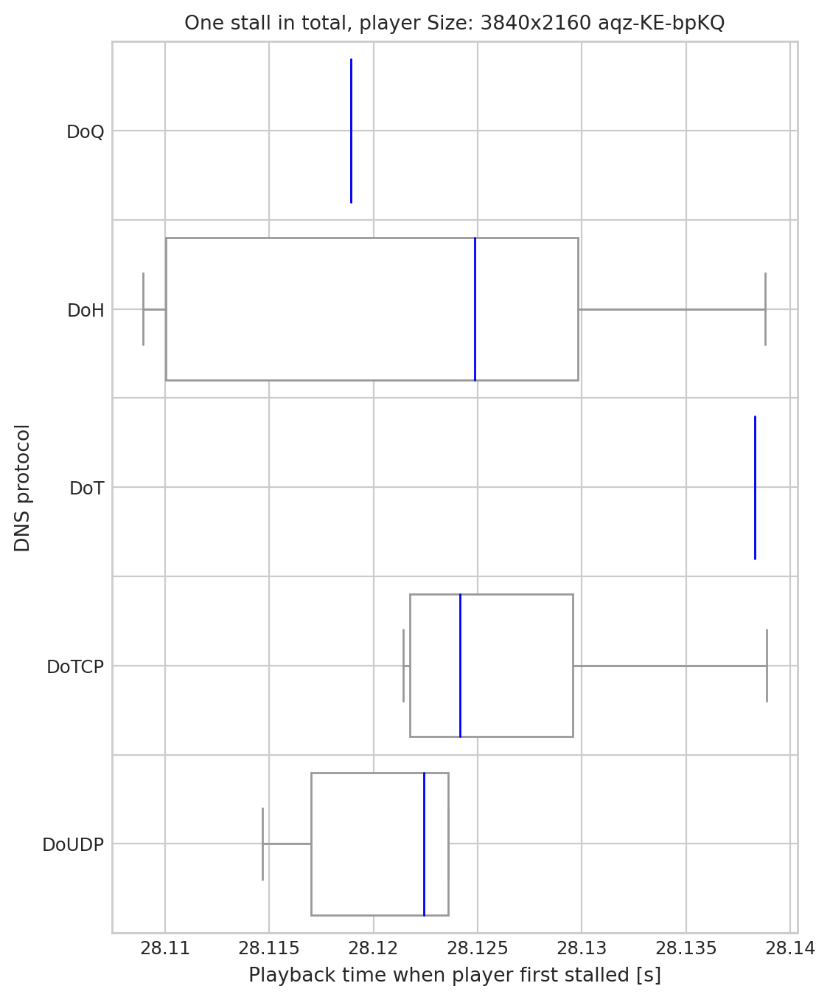

In [720]:
draw_boxplot(first_stall[first_stall.msm_id.isin(one_stall)], 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the first stall [s]', 'One stall in total, player Size:', 'one-stall-first-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(first_stall[first_stall.msm_id.isin(one_stall)], 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player first stalled [s]', 'One stall in total, player Size:', 'one-stall-first-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

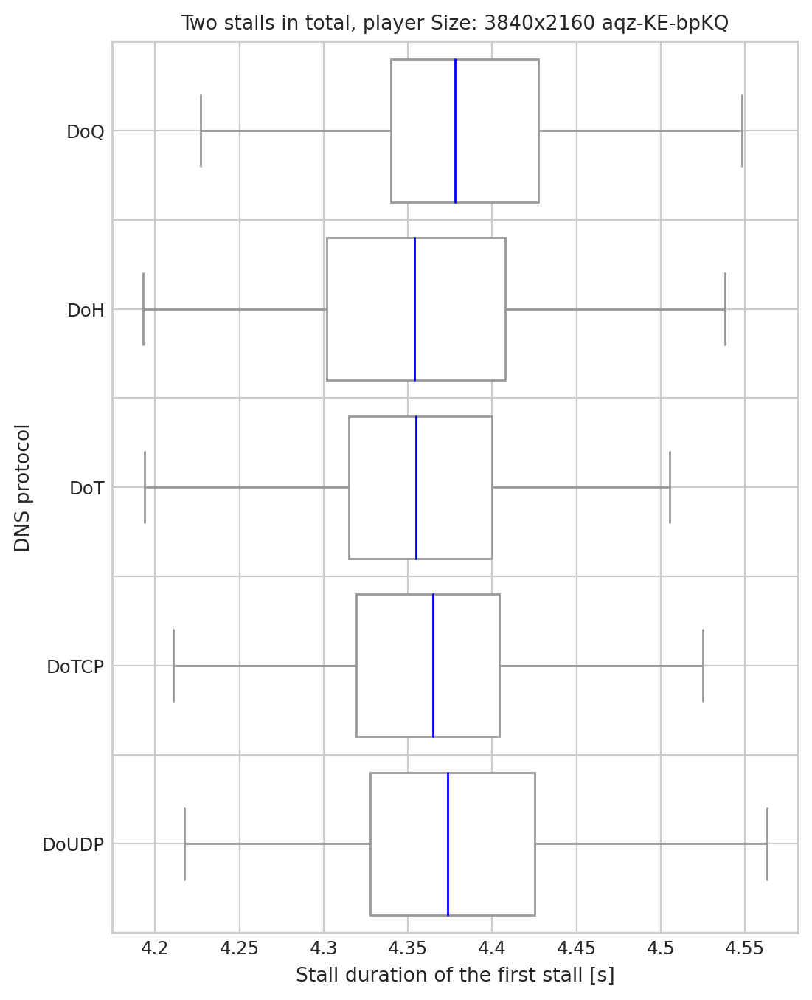

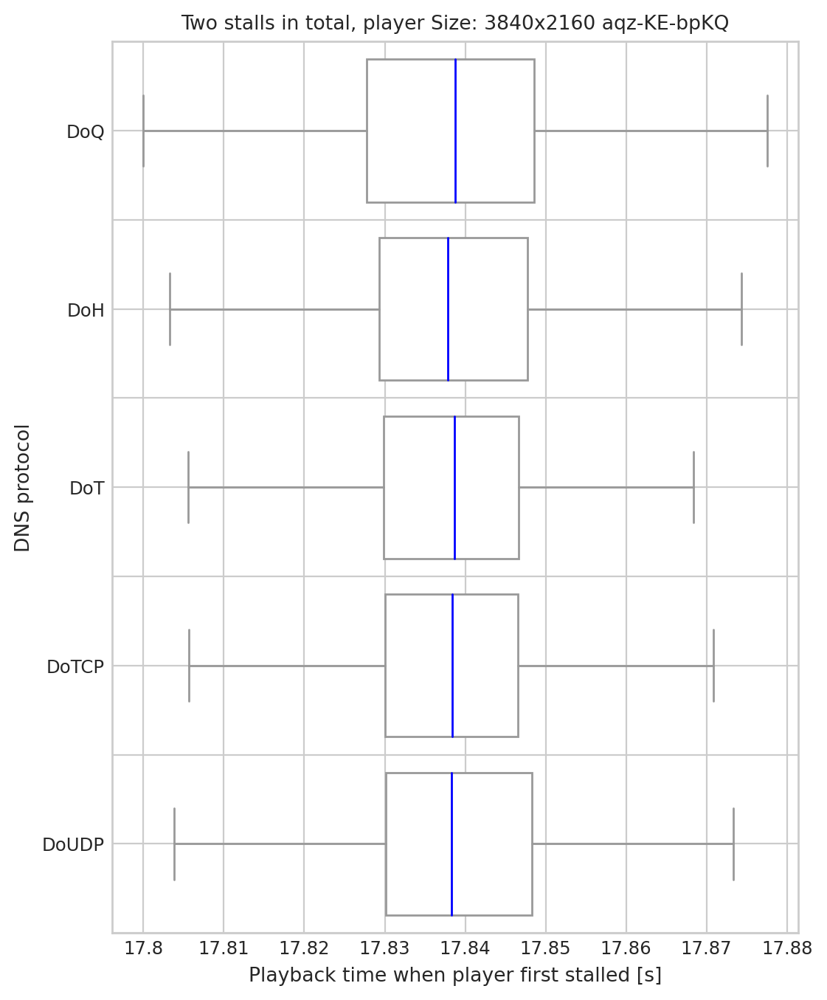

In [719]:
draw_boxplot(first_stall[first_stall.msm_id.isin(two_stalls)], 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the first stall [s]', 'Two stalls in total, player Size:', 'two-stalls-first-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(first_stall[first_stall.msm_id.isin(two_stalls)], 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player first stalled [s]', 'Two stalls in total, player Size:', 'two-stalls-first-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

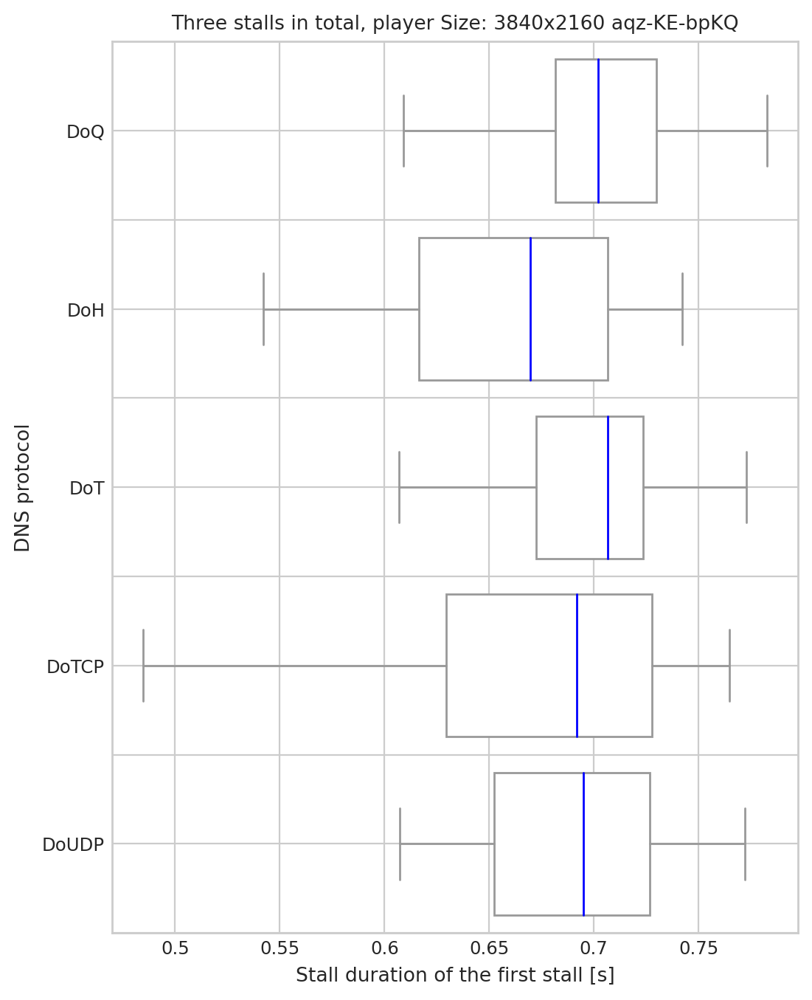

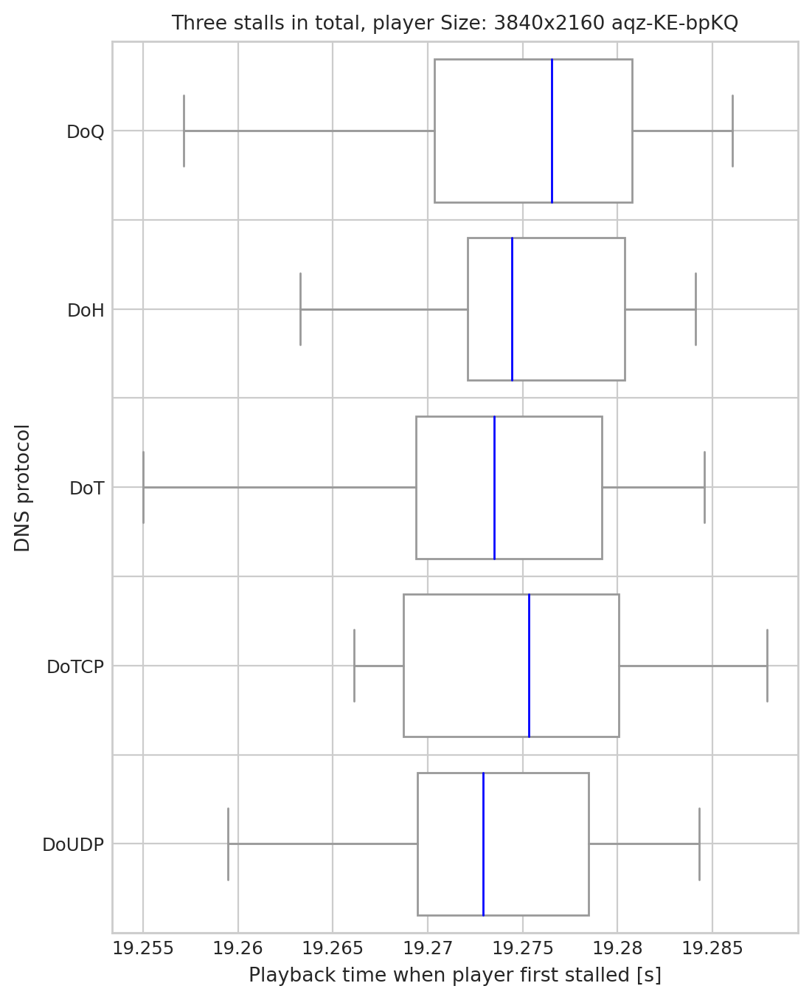

In [721]:
draw_boxplot(first_stall[first_stall.msm_id.isin(three_stalls)], 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the first stall [s]', 'Three stalls in total, player Size:', 'three-stalls-first-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(first_stall[first_stall.msm_id.isin(three_stalls)], 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player first stalled [s]', 'Three stalls in total, player Size:', 'three-stalls-first-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

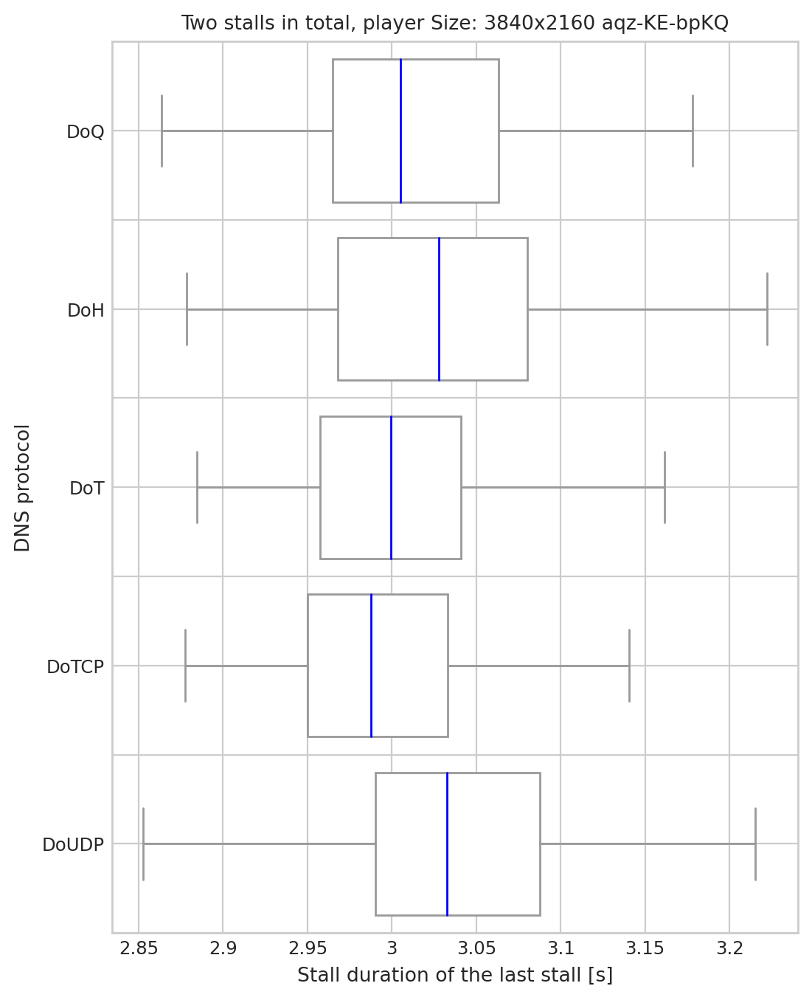

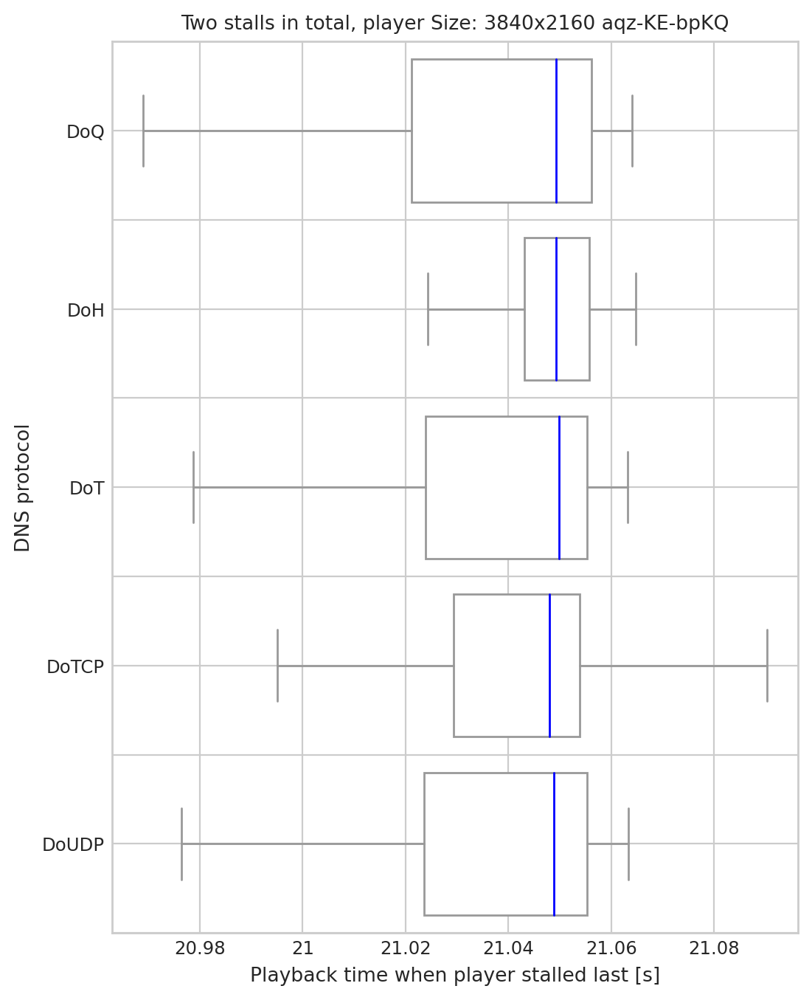

In [759]:
draw_boxplot(latest_stall[latest_stall.msm_id.isin(two_stalls)], 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the last stall [s]', 'Two stalls in total, player Size:', 'two-stalls-last-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(latest_stall[latest_stall.msm_id.isin(two_stalls)], 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled last [s]', 'Two stalls in total, player Size:', 'two-stalls-last-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

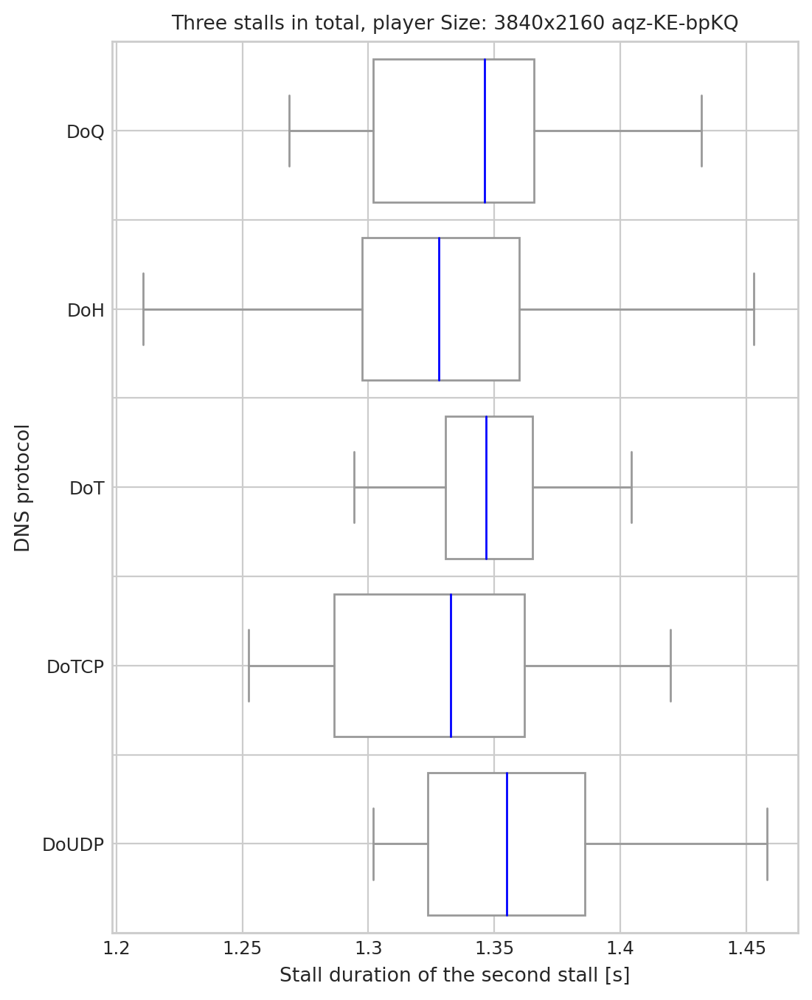

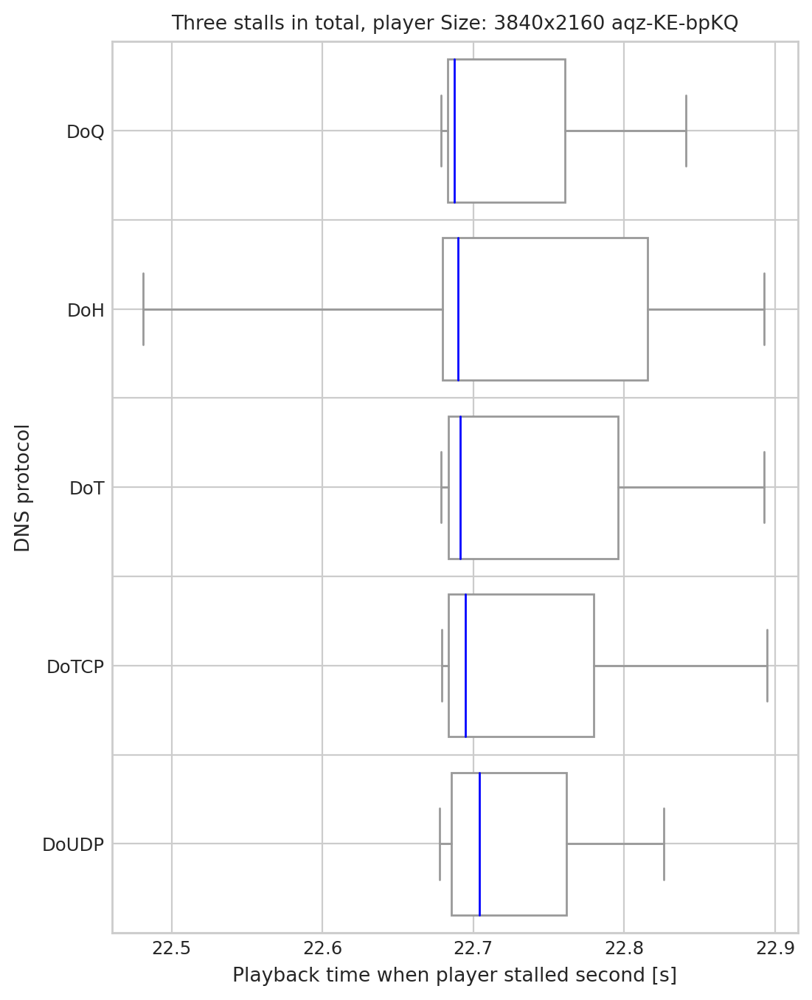

In [756]:
draw_boxplot(second_stall_of_three[second_stall_of_three.msm_id.isin(three_stalls)], 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the second stall [s]', 'Three stalls in total, player Size:', 'three-stalls-second-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(second_stall_of_three[second_stall_of_three.msm_id.isin(three_stalls)], 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled second [s]', 'Three stalls in total, player Size:', 'three-stalls-second-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

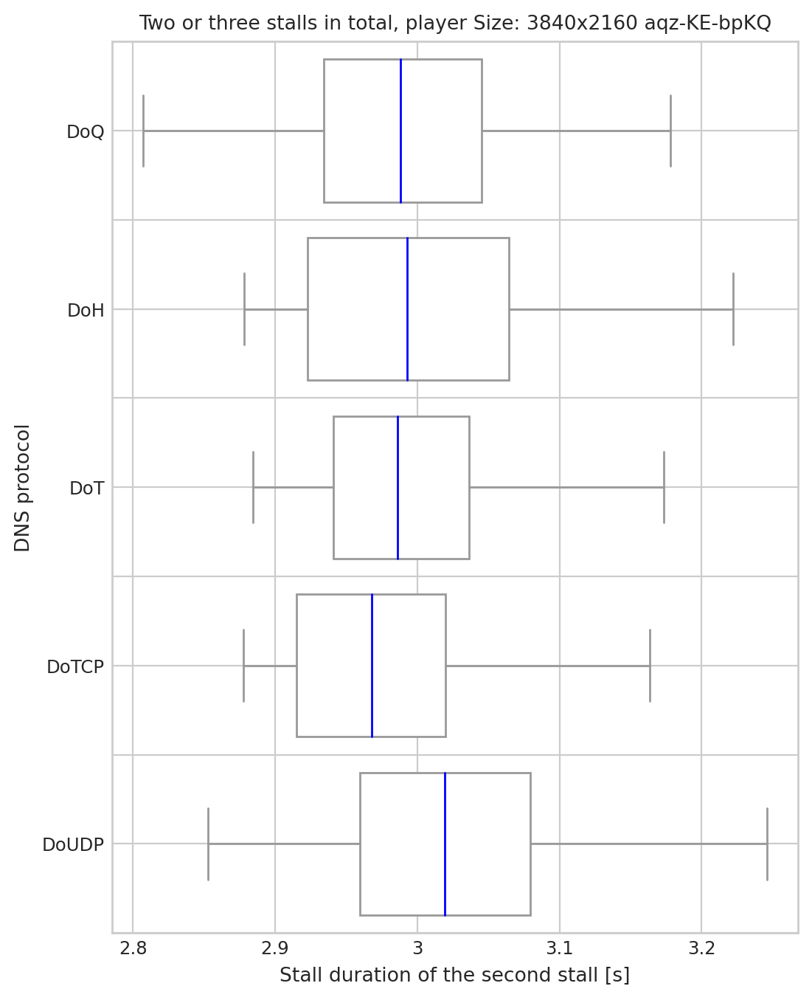

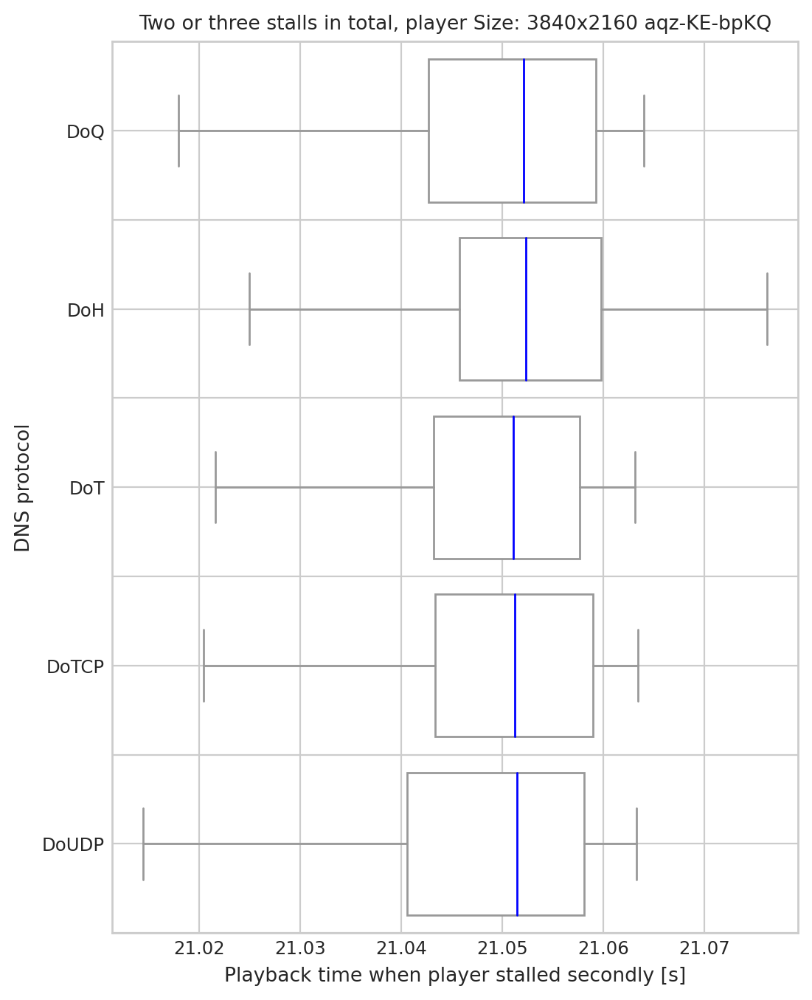

In [761]:
draw_boxplot(pd.concat([latest_stall[latest_stall.msm_id.isin(two_stalls)], second_stall_of_three[second_stall_of_three.msm_id.isin(three_stalls)]]), 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the second stall [s]', 'Two or three stalls in total, player Size:', 'second-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(pd.concat([latest_stall[latest_stall.msm_id.isin(two_stalls)], second_stall_of_three[second_stall_of_three.msm_id.isin(three_stalls)]]), 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled secondly [s]', 'Two or three stalls in total, player Size:', 'second-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)

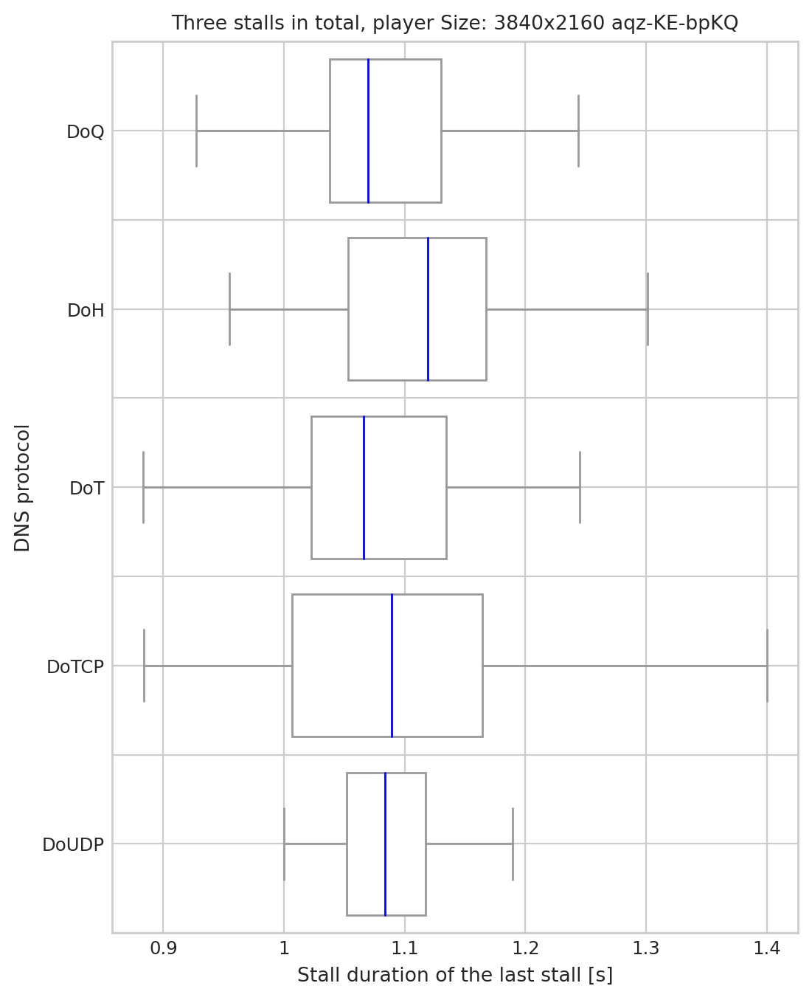

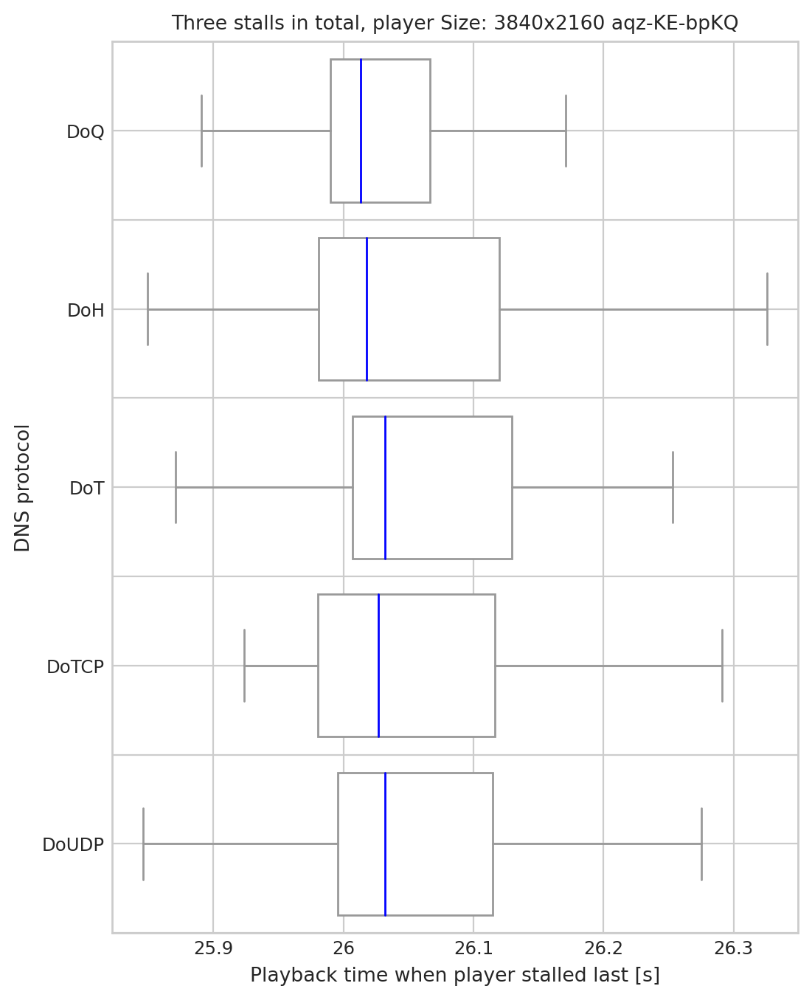

In [757]:
draw_boxplot(latest_stall[latest_stall.msm_id.isin(three_stalls)], 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration of the last stall [s]', 'Three stalls in total, player Size:', 'three-stalls-last-stall-stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)
draw_boxplot(latest_stall[latest_stall.msm_id.isin(three_stalls)], 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled last [s]', 'Three stalls in total, player Size:', 'three-stalls-last-stall-buffer-events-with-play-events-by-player-size-and-proto', [0,0], "DNS protocol", showmean=False)